<a href="https://colab.research.google.com/github/K1000oTorres/Mi-primer-repositorio/blob/main/Lightweight_and_interpretable_left_ventricular_ejection_fraction_estimation_using_Mobile_U_Ne.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **MOBILE U-NET**

Las siguientes lineas de código son para subdividir la carpeta con los 10030 videos dependiendo de su tipo:
* Train
* Val 
* Test

In [ ]:
!pip install gspread

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import csv

with open('/content/drive/MyDrive/Echocardiography/FileList.csv', newline='') as f:
    reader = csv.DictReader(f)
    count_total = sum(row['Split'] == 'TRAIN' or row['Split'] == 'VAL' or row['Split'] == 'TEST' for row in reader)
    f.seek(0)
    count_train = sum(row['Split'] == 'TRAIN' for row in reader)
    f.seek(0)
    count_val = sum(row['Split'] == 'VAL' for row in reader)
    f.seek(0)
    count_test = sum(row['Split'] == 'TEST' for row in reader)

print(f'Número de veces que aparece "TRAIN": {count_total}')
print(f'Número de veces que aparece "TRAIN": {count_train}')
print(f'Número de veces que aparece "VAL": {count_val}')
print(f'Número de veces que aparece "TEST": {count_test}')

In [ ]:
import os
import shutil

# Rutas de las carpetas destino
train_dir = '/content/drive/MyDrive/Echocardiography/train'
val_dir = '/content/drive/MyDrive/Echocardiography/val'
test_dir = '/content/drive/MyDrive/Echocardiography/test'
cont_train = 0
cont_val = 0
cont_test = 0
# Abre el archivo CSV
with open('/content/drive/MyDrive/Echocardiography/FileList.csv', newline='') as f:
    reader = csv.DictReader(f)

    # Itera sobre las filas del archivo CSV
    for row in reader:
        filename = row['FileName']
        split = row['Split']
        src_path = os.path.join('/content/drive/MyDrive/Echocardiography/Videos', filename)
        
        # Copia el archivo a su carpeta destino correspondiente
        if split == 'TRAIN':
            cont_train += 1
            dst_path = os.path.join(train_dir, filename)
        elif split == 'VAL':
            cont_val += 1
            dst_path = os.path.join(val_dir, filename)
        elif split == 'TEST':
            cont_test += 1
            dst_path = os.path.join(test_dir, filename)
        else:
            continue  # Ignora filas que no son "TRAIN", "VAL" o "TEST"
        try:
          shutil.copy(src_path, dst_path)
        except FileNotFoundError:
          continue

Para mirar cuantos videos hay en las carpetas se utiliza el siguiente comando que es un ***contador***

In [ ]:
print(cont_train)

Se importan librerías para correr el código que corresponde al ***dataloader***

In [ ]:
import tensorflow as tf
from tensorflow import keras
import os
import pandas as pd
import numpy as np
import collections
import cv2
import skimage.draw
import matplotlib.pyplot as plt
print(tf.__version__)

In [ ]:
class EchoMasks(tf.keras.utils.Sequence):
	def __init__(self, root = "/content/drive/MyDrive/Echocardiography/",split='train', batch_size = 1, noise = None, padding = None):
		self.folder = root
		self.split = split
		self.batch_size = batch_size
		self.noise = noise
		self.pad = padding

		self.fnames =[]
		self.outcomes =[]
		self.ejection=[]
		self.fps = []

		with open(self.folder + "FileList.csv") as f:
			header   = f.readline().strip().split(",")
			filenameIndex = header.index("FileName")
			splitIndex = header.index("Split")
			efIndex = header.index("EF")
			fpsIndex = header.index("FPS")
			for line in f:
				lineSplit = line.strip().split(',')
				# Get name of the video file
				fileName = os.path.splitext(lineSplit[filenameIndex])[0]+".avi"
				
				#Get the subset that the video belongs to 
				fileSet = lineSplit[splitIndex].lower()
				
				#Get ef for the video
				fileEf = lineSplit[efIndex]

				#Get fps for the video
				fileFps = lineSplit[fpsIndex]

				#Ensure that the video exists 
				if os.path.exists(self.folder + "/Videos/" + fileName):
					if fileSet == split:
						self.fnames.append(fileName)
						self.outcomes.append(lineSplit)
						self.ejection.append(fileEf)
						self.fps.append(fileFps)

		self.frames = collections.defaultdict(list)
		_defaultdict_of_lists_ = collections.defaultdict(list)
		self.trace = collections.defaultdict(lambda: collections.defaultdict(list))

		#Read the volume tracings CSV file to find videos with ED/ES frames 
		with open(self.folder + "VolumeTracings.csv") as f:
			header = f.readline().strip().split(",")
			assert header == ["FileName", "X1", "Y1", "X2", "Y2", "Frame"]

			for line in f:
				filename, x1, y1, x2, y2, frame = line.strip().split(",")
				x1 = float(x1)
				x2 = float(x2)
				y1 = float(y1)
				y2 = float(y2)
				frame = int(frame)

				# New frame index for the given filename
				if frame not in self.trace[filename]:
					self.frames[filename].append(frame)
				self.trace[filename][frame].append((x1,y1,x2,y2))

		#Transform into numpy array 
		for filename in self.frames:
			for frame in self.frames[filename]:
				self.trace[filename][frame] = np.array(self.trace[filename][frame])

		# Reject files without tracings 
		keep = [len(self.frames[f]) >= 2 for f in self.fnames]
		self.fnames = [f for (f, k) in zip(self.fnames, keep) if k]
		self.outcomes = [f for (f, k) in zip(self.outcomes, keep) if k]

		self.indexes = np.arange(np.shape(self.fnames)[0])


	def __len__(self):
		# Denotes the number of batches per epoch
		return(int (np.floor(np.shape(self.fnames)[0])/self.batch_size))

	def __getitem__(self, idx):
		# Generate one batch of data
		# Generate indexes of the batch

		indexes = self.indexes[idx*self.batch_size:(idx+1)*self.batch_size]
		X, y = self.__data_generation(indexes)


		return X, y


	def __data_generation(self, list_IDs_temp):

		X = []
		y = []

		index = 0
		for i in list_IDs_temp:
			path = os.path.join(self.folder, "Videos", self.fnames[i])
			# Load video into np.array
			if not os.path.exists(path):
				print("File does not exist")

			frames = self.frames[self.fnames[i]]
			frames.sort() #  Ensure that the frames are in ascending order
			traces = self.trace[self.fnames[i]]

			vid_cap = cv2.VideoCapture(path)
			frame_count = int(vid_cap.get(cv2.CAP_PROP_FRAME_COUNT))
			frame_width = int(vid_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
			frame_height = int(vid_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

			# Read the entire video and save the traced frames 
			inputs = np.zeros((len(frames),frame_width, frame_height, 3), np.uint8)
			targets = np.zeros((len(frames),frame_width, frame_height), np.uint8)
			index = 0
			
			# Load the frames  
			for count in range(frame_count): 
				success, frame = vid_cap.read()
				if not success:
					print("Failed to load frame #", count, ' of ', filename)
				
				if (count) in frames: #Assume that frame number is 1 indexed
					frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
					inputs[index] = frame
					index = index + 1
			
			# blackout pixels for simulated noise
			if self.noise:
				num_pepper = np.ceil(self.noise * 2 * frame_height * frame_width)
				coords = [np.random.randint(0, i-1, int(num_pepper)) for i in inputs.shape[0:3]]
				inputs[tuple(coords)] = (0,0,0)
			
			# Scale pixels between 0 and 1
			inputs = inputs /255.0
			X = np.append(X, inputs)
			X = X.reshape((-1, 112,112,3))
	
			#Load the targets
			index = 0
			for f in frames:
				t = traces[f]
				x1, y1, x2, y2 = t[:, 0], t[:, 1], t[:, 2], t[:, 3]
				x = np.concatenate((x1[1:], np.flip(x2[1:])))
				y_ = np.concatenate((y1[1:], np.flip(y2[1:])))
				r, c = skimage.draw.polygon(np.rint(y_).astype(int), np.rint(x).astype(int), (frame_width,frame_height))
				mask = np.zeros((frame_width, frame_height), np.float32)
				mask[r, c] = 1
				targets[index] = mask
				index = index + 1	

			y = np.append(y, targets)
			y = y.reshape(-1, 112, 112)

		y = np.expand_dims(y, -1)
		
		if self.pad is not None:
			X = np.pad(X, ((0,0),(self.pad,self.pad),(self.pad,self.pad),(0,0)), mode='constant', constant_values=0)
			y = np.pad(y, ((0,0),(self.pad,self.pad),(self.pad,self.pad), (0,0)), mode='constant', constant_values=0)

		return X, y

	def display_example(self, idx):
		indexes = self.indexes[idx*self.batch_size:(idx+1)*self.batch_size]
		X, y = self.__data_generation(indexes)

		fig, axs = plt.subplots(1, 2, sharey=True, tight_layout=True)
		axs[0].imshow(X[0])
		axs[0].set_title("Frame")
		axs[1].imshow(y[0])
		axs[1].set_title("Mask")
		plt.show()

In [ ]:
# Define packed tensor so that we can have a segmentation mask ground truth and a EF ground truth
class PackedTensor(tf.experimental.BatchableExtensionType):
    __name__ = 'extension_type_colab.PackedTensor'

    ef: tf.Tensor
    video_masks: tf.Tensor
    ed_es_frames: tf.Tensor
    edv : tf.Tensor
    esv : tf.Tensor

    # shape and dtype hold no meaning in this context, so we use a dummy
    # to stop Keras from complaining

    shape = property(lambda self: self.output_0.shape)
    dtype = property(lambda self: self.output_0.dtype)

    class Spec:
      def __init__(self, shape, dtype=tf.float32):
        self.ef = tf.TensorSpec(shape, dtype)
        self.video_masks = tf.TensorSpec(shape, dtype)
        self.ed_es_frames = tf.TensorSpec(shape, dtype)
        self.edv = tf.TensorSpec(shape, dtype)
        self.esv = tf.TensorSpec(shape, dtype)

        # shape and dtype hold no meaning in this context, so we use a dummy
        # to stop Keras from complaining
        shape: tf.TensorShape = tf.constant(1.).shape 
        dtype: tf.DType = tf.constant(1.).dtype

# these two functions have no meaning, but need dummy implementations
# to stop Keras from complaining
@tf.experimental.dispatch_for_api(tf.shape)
def packed_shape(input: PackedTensor, out_type=tf.int32, name=None):
    return tf.shape(input.col_ids)

@tf.experimental.dispatch_for_api(tf.cast)
def packed_cast(x: PackedTensor, dtype: str, name=None):
    return x


In [ ]:
class EchoSet(tf.keras.utils.Sequence):
	def __init__(self, root = "/content/drive/MyDrive/Echocardiography/", split='train', max_length = 128, min_spacing = 16, pad = 8, attenuation = 3, batch_size =1,  center=True):
		self.folder = root
		self.split = split
		self.max_length = max_length
		self.min_length = min_spacing
		self.pad = pad
		self.attenuation = attenuation
		self.batch_size = batch_size
		self.center = center


		self.fnames =[]
		self.outcomes =[]
		self.ejection=[]
		self.fps = []
		self.edv = []
		self.esv = []
		
		with open(self.folder + "FileList.csv") as f:
			header   = f.readline().strip().split(",")
			filenameIndex = header.index("FileName")
			splitIndex = header.index("Split")
			efIndex = header.index("EF")
			fpsIndex = header.index("FPS")

			edvIndex = header.index("EDV")	
			esvIndex = header.index("ESV")


			for line in f:
				lineSplit = line.strip().split(',')
				# Get name of the video file
				fileName = os.path.splitext(lineSplit[filenameIndex])[0]+".avi"
				
				#Get the subset that the video belongs to 
				fileSet = lineSplit[splitIndex].lower()
				
				#Get ef for the video
				fileEf = lineSplit[efIndex]

				#Get fps for the video
				fileFps = lineSplit[fpsIndex]

				# Get the EDV and ESV for the video 
				fileEDV = lineSplit[edvIndex]
				fileESV = lineSplit[esvIndex]

				#Ensure that the video exists 
				if os.path.exists(self.folder + "/Videos/" + fileName):
					if fileSet == split:
						self.fnames.append(fileName)
						self.outcomes.append(lineSplit)
						self.ejection.append(fileEf)
						self.fps.append(fileFps)
						self.edv.append(fileEDV)
						self.esv.append(fileESV)

		self.frames = collections.defaultdict(list)
		_defaultdict_of_lists_ = collections.defaultdict(list)
		self.trace = collections.defaultdict(lambda: collections.defaultdict(list))

		#Read the voilume tracings CSV file to find videos with ED/ES frames 
		with open(self.folder + "VolumeTracings.csv") as f:
			header = f.readline().strip().split(",")
			assert header == ["FileName", "X1", "Y1", "X2", "Y2", "Frame"]

			for line in f:
				filename, x1, y1, x2, y2, frame = line.strip().split(",")
				x1 = float(x1)
				x2 = float(x2)
				y1 = float(y1)
				y2 = float(y2)
				frame = int(frame)

				# New frame index for the given filename
				if frame not in self.trace[filename]:
					self.frames[filename].append(frame)
				self.trace[filename][frame].append((x1,y1,x2,y2))

		#Transform into numpy array 
		for filename in self.frames:
			for frame in self.frames[filename]:
				self.trace[filename][frame] = np.array(self.trace[filename][frame])

		# Reject files without tracings 
		keep = [len(self.frames[f]) >= 2 for f in self.fnames]
		self.fnames = [f for (f, k) in zip(self.fnames, keep) if k]
		self.outcomes = [f for (f, k) in zip(self.outcomes, keep) if k]
		self.indexes = np.arange(np.shape(self.fnames)[0])

		self.indexes = np.arange(np.shape(self.fnames)[0])

	def __len__(self):
		# Denotes the number of batches per epoch
		return(int (np.floor(np.shape(self.fnames)[0])/self.batch_size))

	def __getitem__(self, idx):
		# Generate one batch of data and generate indexes of the batch
		indexes = self.indexes[idx*self.batch_size:(idx+1)*self.batch_size]
		X, ef, masks, ed_es_frames, edv, esv = self.__data_generation(indexes)
		X = np.expand_dims(X, 0)


		ed_es_frames = np.array(ed_es_frames, dtype =bool)

		# use packed tensor so that label contains the ef and the masks
		packed_output = PackedTensor(ef, masks, ed_es_frames, edv, esv)

		return X, packed_output
	
	def __data_generation(self, list_IDs_temp):
		# Retun the video (starting at the first annotated frame) and the mask of the first annotation 
		#X = np.empty((self.batch_size, self.max_length, 3, 128,128))
		X= []
		ejection = np.empty(self.batch_size)
		edv = np.empty(self.batch_size)
		esv = np.empty(self.batch_size)

		index = 0
		for i in list_IDs_temp:
			path = os.path.join(self.folder, "Videos", self.fnames[i])
			# Load video into np.array
			if not os.path.exists(path):
				print("File does not exist")

			vid_cap = cv2.VideoCapture(path)
			f = int(vid_cap.get(cv2.CAP_PROP_FRAME_COUNT))
			w = int(vid_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
			h = int(vid_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

			v = np.zeros((f, w, h, 3), np.uint8)

			for count in range(f):
				success, frame = vid_cap.read()
				if not success:
					print("Failed to load frame #", count, ' of ', filename)
				frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
				v[count] = frame

			video = v.transpose((3,0,1,2))
			key = os.path.splitext(self.fnames[i])[0]

			video = video / 255.0
			video = np.moveaxis(video,0,1)

			frames = self.frames[self.fnames[i]]
			frames.sort()
			traces = self.trace[self.fnames[i]]
			first_frame = frames[0]

			nvideo = []

			# Start from frame ED -1 (if centering)
			# In some cases the test videos have fewer than max_len frames
			if (self.center):
				if  f - first_frame + 1 > self.max_length:
					nvideo.append(video[first_frame -1])
					nvideo.extend(video[first_frame:first_frame + self.max_length -1])
				else:
					nvideo.append(video[first_frame -1 ])
					nvideo.extend(video[first_frame:f])

					# zeros = np.zeros( (3, w, h))
					# for i in range(0, self.max_length - f + first_frame -1):
					# 	nvideo.append(zeros)

			# return all frames
			else:
				nvideo.append(video[0])
				nvideo.extend(video[1:f])


			#Load the mask for ES and ED
			if self.center:
				masks = np.empty((self.batch_size,np.shape(nvideo)[0], 128, 128, 1))
				ed_es_frames = np.zeros((self.batch_size, np.shape(nvideo)[0]))

				for f_no in frames:
					
					t = traces[f_no]
					x1, y1, x2, y2 = t[:, 0], t[:, 1], t[:, 2], t[:, 3]
					x = np.concatenate((x1[1:], np.flip(x2[1:])))
					y_ = np.concatenate((y1[1:], np.flip(y2[1:])))
					r, c = skimage.draw.polygon(np.rint(y_).astype(int), np.rint(x).astype(int), (w,h))
					mask = np.zeros((w,h), np.float32)
					mask[r, c] = 1
					mask = np.pad(mask, ((self.pad,self.pad),(self.pad,self.pad)), mode='constant', constant_values=0)
					mask = np.reshape(mask, (128,128, 1))

					if(f_no - first_frame < self.max_length):
						masks[index][f_no - first_frame] = mask
						ed_es_frames[index][f_no - first_frame] = 1
			else:
				masks = []
				ed_es_frames = []
				zeros = np.zeros((128, 128,1))

				for f_no in range(0, f):
					# if this frame has a trace
					if f_no in frames:
						t = traces[f_no]
						x1, y1, x2, y2 = t[:, 0], t[:, 1], t[:, 2], t[:, 3]
						x = np.concatenate((x1[1:], np.flip(x2[1:])))
						y_ = np.concatenate((y1[1:], np.flip(y2[1:])))
						r, c = skimage.draw.polygon(np.rint(y_).astype(int), np.rint(x).astype(int), (w,h))
						mask = np.zeros((w,h), np.float32)
						mask[r, c] = 1
						mask = np.pad(mask, ((self.pad,self.pad),(self.pad,self.pad)), mode='constant', constant_values=0)
						mask = np.reshape(mask, (128,128, 1))
						masks.append(mask)
						ed_es_frames.append(1)

						
					else:
						masks.append(zeros)
						ed_es_frames.append(0)




			# Padding 
			nvideo = np.pad(nvideo, ((0,0),(0,0),(self.pad,self.pad),(self.pad,self.pad)), mode='constant', constant_values=0)
			nvideo = np.swapaxes(nvideo, 1, 2)
			nvideo = np.swapaxes(nvideo, 2, 3)

			X = np.append(X, nvideo)
			X = X.reshape((-1, 128,128,3))

			
			ejection[index] = float(self.ejection[i]) / 100.0 #Divide by 10 to put in range 0-1
			edv[index] = float(self.edv[i])
			esv[index] = float(self.esv[i])
			index = index + 1

			#print(np.shape(self.edv))
			
			
		return tf.convert_to_tensor(X), tf.convert_to_tensor(ejection), tf.convert_to_tensor(masks), tf.convert_to_tensor(ed_es_frames), tf.convert_to_tensor(edv), tf.convert_to_tensor(esv)

El siguiente código corresponde a la arquitectura de Mobile U-NET

In [ ]:
!ls FileList.csv

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
#from dataloader import EchoMasks

from tensorflow.keras.applications import MobileNetV2

echo_train = EchoMasks(split = 'train' , noise = 0.005, padding=8, batch_size = 1)
echo_valid = EchoMasks(split ='val', padding = 8, batch_size = 3)

In [ ]:
class Bottleneck(tf.keras.Model):
    def __init__(self, filters, t, s, out_channels):
        
        super(Bottleneck, self).__init__(name='Bottleneck')

        self.conv2a = tf.keras.layers.Conv2D(t*filters, 1 ,padding='same')
        self.bn2a = tf.keras.layers.BatchNormalization()

        self.dconv2 = tf.keras.layers.DepthwiseConv2D(3,strides=(s,s),padding ='same')
        self.bn2b = tf.keras.layers.BatchNormalization()

        self.conv2b = tf.keras.layers.Conv2D(out_channels, 1 ,padding='same')
        self.bn2c = tf.keras.layers.BatchNormalization()

        self.shortcutconv = tf.keras.layers.Conv2D(out_channels, 1,padding='same', strides=(s,s))
        self.shortcutbn = tf.keras.layers.BatchNormalization()

    def call(self, input_tensor, training=False):
        shortcut = input_tensor

        x = self.conv2a(input_tensor)
        x = self.bn2a(x, training=training)
        x = tf.keras.layers.ReLU(max_value=6)(x)

        x = self.dconv2(x)
        x = self.bn2b(x, training=training)
        x = tf.keras.layers.ReLU(max_value=6)(x)

        x = self.conv2b(x)
        x = self.bn2c(x, training=training)

        shortcut = self.shortcutconv(shortcut)
        shortcut = self.shortcutbn(shortcut, training=training)

        x += shortcut
        return tf.nn.relu(x)

In [ ]:
class Residual(tf.keras.Model):
    def __init__(self, filters):
       
        super(Residual, self).__init__(name='')

        self.conv2a = tf.keras.layers.Conv2D(filters, (1, 1),padding='valid')
        self.bn2a = tf.keras.layers.BatchNormalization()

        self.shortcutconv = tf.keras.layers.Conv2D(filters, 1,padding='same', strides=(1,1))
        self.shortcutbn = tf.keras.layers.BatchNormalization()


    def call(self, input_tensor, training=False):
        shortcut = input_tensor

        x = self.conv2a(input_tensor)
        x = self.bn2a(x, training=training)
        x = tf.nn.relu(x)

        shortcut = self.shortcutconv(shortcut)
        shortcut = self.shortcutbn(shortcut, training=training)

        x += shortcut
        return tf.nn.relu(x)


In [ ]:
class Upsample(tf.keras.Model):
	def __init__(self, filters):
		super(Upsample, self).__init__(name='')
		self.filters = filters
		self.up_samp = layers.UpSampling2D((2,2))

		self.conv1 = layers.Conv2D(filters, (3, 3), padding="same")
		self.bn1 = layers.BatchNormalization()

		self.conv2 = layers.Conv2D(filters, (3, 3), padding="same")
		self.bn2 = layers.BatchNormalization()

	def call(self, inputs, conv_features):
		# upsample
   		x = self.up_samp(inputs)
   		x = layers.Concatenate()([x, conv_features])

   		x = self.conv1(x)
   		x = self.bn1(x)
   		x = tf.nn.relu(x)

   		x = self.conv2(x)
   		x = self.bn2(x)
   		x = tf.nn.relu(x)

   		return(x)



In [ ]:
class RMUNet(tf.keras.Model):
	def __init__(self):

		super(RMUNet,self).__init__(name='RMUNet')
		self.conv1 = layers.Conv2D(32,3, (2,2), padding='same')
		
		self.b1 = Bottleneck(filters= 32, s = 1, t=1, out_channels=16)
		self.b2 = Bottleneck(filters= 16, s = 2, t=6, out_channels=24)
		self.r1 = Residual(24)
		self.b3 = Bottleneck(filters= 24, s = 2, t=6, out_channels=32)
		self.r2 = Residual(32)
		self.b4 = Bottleneck(filters= 32, s = 2, t=6, out_channels=64)
		self.r3 = Residual(64)
		self.b5 = Bottleneck(filters=64, s = 1, t=6, out_channels=96)
		self.b6 = Bottleneck(filters=96, s=2, t=6, out_channels=160)
		self.b7 = Bottleneck(filters=160, s=1, t=6, out_channels=320)

		self.conv2 = layers.Conv2D(1280,1, padding='same')

		self.us1 = Upsample(filters=512)
		self.us2 = Upsample(filters=256)
		self.us3 = Upsample(filters=128)
		self.us4 = Upsample(filters=64)

		self.conv3 = layers.Conv2D(1, 1, padding="same", activation = "sigmoid")



	def call(self, inputs, training=False):
		x = self.conv1(inputs)
		s4 = self.b1(x)
		s3 = self.b2(s4)
		x = self.r1(s3)
		x = self.b3(x)
		s2 = self.r2(x)
		x = self.b4(s2)
		x = self.r3(x)
		s1 = self.b5(x)
		x = self.b6(s1)
		x = self.b7(x)

		x = self.conv2(x)

		x = self.us1(x, s1)
		x = self.us2(x, s2)
		x = self.us3(x, s3)
		x = self.us4(x, s4)
		
		x = layers.UpSampling2D((2,2))(x)
		x = self.conv3(x)

		return x
	

In [ ]:
RMUnet = RMUNet()	
def display(display_list):
  	plt.figure()

  	title = ['Input Image', 'True Mask', 'Predicted Mask']

  	for i in range(len(display_list)):
  		plt.subplot(1, len(display_list), i+1)
  		plt.title(title[i])
  		plt.imshow(display_list[i])
  		plt.axis('off')
  	plt.show()

class DisplayCallback(tf.keras.callbacks.Callback):
	def __init__(self):
		super(DisplayCallback,self).__init__()

	def on_epoch_end(self, epoch, logs=None):
		show_predictions()

def show_predictions():
	sample_img, sample_mask = echo_train.__getitem__(4)
	pred_mask = RMUnet.predict(sample_img)
	display([sample_img[0], sample_mask[0], pred_mask[0]])


#sample_img, sample_mask = echo_train.__getitem__(4)
#print(np.shape(sample_img[0]), "  ", np.shape(sample_mask))


#RMUnet.compile(optimizer=tf.keras.optimizers.Adam(),loss='binary_crossentropy',metrics="accuracy")

#pred_mask = RMUnet.predict(sample_img)
#display([sample_img[0], sample_mask[0], pred_mask[0]])

#callbacks = callbacks = [tf.keras.callbacks.ModelCheckpoint("RMU", save_best_only=True, save_weights_only=True), DisplayCallback()]

#model_history = RMUnet.fit(echo_train,epochs=10,validation_data=echo_valid, callbacks=callbacks)

La siguiente parte de código es para el entrenamiento de la arquitectura Mobile U-Net

In [ ]:
#from data_loader import EchoMasks
#from uNet import build_unet_model
import tensorflow as tf
import keras
from tensorflow.keras.optimizers import schedules
import numpy as np
import matplotlib.pyplot as plt
#from RMUNet import RMUNet

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"


In [ ]:
echo_train = EchoMasks(split = 'train' , padding=8, batch_size = 1)
echo_valid = EchoMasks(split ='val', padding = 8, batch_size = 1)
echo_test = EchoMasks(split ='test', padding = 8, batch_size = 1)

model = RMUNet()

In [ ]:
def display(display_list, save_as=None):
	plt.figure()
	title = ['Input Image', 'Prev Mask', 'True Mask', 'Predicted Mask']
	
	for i in range(len(display_list)):
		plt.subplot(1, len(display_list), i+1)
		plt.title(title[i])
		plt.imshow(display_list[i])
		plt.axis('off')

	if save_as:
		plt.savefig('Prediction_epoch' + str(save_as))

	else:
		plt.show()

def diceLoss(y_true, y_pred, smooth=1e-6):
	#flatten label and prediction tensors
	intersection = keras.backend.sum(y_true * y_pred, axis=[1,2,3])
	union = keras.backend.sum(y_true, axis=[1,2,3]) +keras.backend.sum(y_pred, axis=[1,2,3])
	dice = keras.backend.mean((2. * intersection + smooth)/(union + smooth), axis=0)
	return 1-dice

Cause: code mixing tabs and spaces for indentation is not allowed
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: code mixing tabs and spaces for indentation is not allowed
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
1/1 [==============================] - 3s 3s/step
Model: "RMUNet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_38 (Conv2D)          multiple                  896       
                                                                 
 Bottleneck (Bottleneck)     multiple                  2816      
                                                                 
 Bottleneck (Bottleneck)     multiple                  6288      
                                                                 
  (Residual)                 multiple                  1392      
                                                                 
 Bottleneck (Bottleneck)     multiple                  11888     
                                                

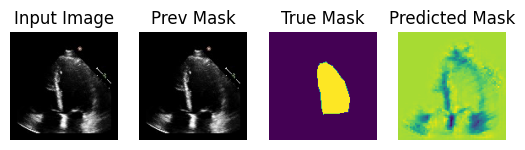

(128, 128, 3)
Epoch 1/30
7460/7460 [==============================] - 7141s 954ms/step - loss: 0.1301 - accuracy: 0.9821 - val_loss: 0.1209 - val_accuracy: 0.9831
Epoch 2/30
7460/7460 [==============================] - 7035s 943ms/step - loss: 0.1016 - accuracy: 0.9861 - val_loss: 0.1291 - val_accuracy: 0.9830
Epoch 3/30
3008/7460 [===========>..................] - ETA: 1:06:01 - loss: 0.0963 - accuracy: 0.9868

KeyboardInterrupt: ignored

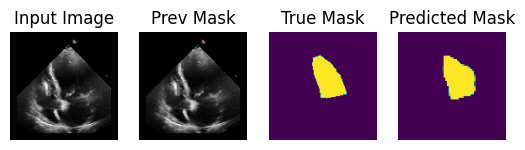

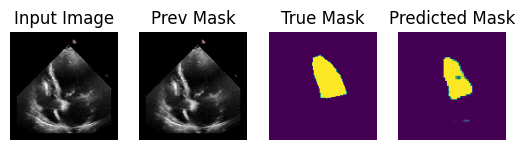

In [ ]:
class DisplayCallback(tf.keras.callbacks.Callback):
	def __init__(self):
		super(DisplayCallback,self).__init__()

	def on_epoch_end(self, epoch, logs=None):
		show_predictions(title=str(epoch))

def show_predictions(title=None):
	sample_img, sample_mask = echo_train.__getitem__(4)

	pred_mask = model.predict(sample_img)
	display([sample_img[0,:,:, 0:3],sample_img[0,:, :,0:3],sample_mask[0], pred_mask[0]], save_as = title)

sample_img, sample_mask = echo_test.__getitem__(4)

lr_schedule = schedules.ExponentialDecay(initial_learning_rate=0.001,decay_steps=20000,decay_rate=0.9)


model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule),loss= diceLoss,metrics="accuracy")

#See what the model predicts before training 
pred_mask = model.predict(sample_img)

model.summary()
# Do not save as .h5 file
callbacks = [tf.keras.callbacks.ModelCheckpoint("RMU", save_best_only=True, save_weights_only=True), DisplayCallback()]

display([sample_img[0, :, :, 0:3],sample_img[0,:, :,0:3],sample_mask[0], pred_mask[0]])

print(np.shape(sample_img[0, :, :,0:3]))

model_history = model.fit(echo_train,epochs=30,validation_data=echo_test, callbacks=callbacks)

In [ ]:
print(sample_img.shape)
print(sample_mask.shape)
print(pred_mask.shape)

In [ ]:
sample_input = np.zeros((1, 128, 128, 3))
_ = model(sample_input)
model.save('saved-models/RMU10')

In [ ]:
!cp -r /content/saved-models /content/drive/MyDrive/Echocardiography

La siguiente parte de código corresponde a las predicciones

In [ ]:
#from dataloader import EchoSet
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
#from RMUNet import RMUNet

import cv2
import imageio
import os

import scipy.signal as sig
import scipy.stats as stat
import scipy.spatial.distance as sdist
import matplotlib.colors as clr

In [ ]:
def closest_point(point, array):
     diff = array - point
     distance = np.einsum('ij,ij->i', diff, diff)
     return np.argmin(distance), distance

def farthest_point(point, array):
     diff = array - point
     distance = np.einsum('ij,ij->i', diff, diff)
     return np.argmax(distance), distance

def label_points(p1, p2, p3):
    d1 = np.linalg.norm(p1 - p2)
    d2 = np.linalg.norm(p2 - p3)
    d3 = np.linalg.norm(p1 - p3)
    if d1 < d2 and d1 < d3:
        apex = p3
        mv_1 = p1
        mv_2 = p2
    elif d2 < d1 and d2 < d3:
        apex = p1
        mv_1 = p3
        mv_2 = p2
    else:
        apex = p2
        mv_1 = p1
        mv_2 = p3

    return apex, mv_1, mv_2

In [ ]:
def simpsons_biplane(cnt, frame, mask_area,draw, im):
    # Find the minumum enclosing triangle for the LV contour
    [area, tri] = cv2.minEnclosingTriangle(cnt)

    # Find the three points closest to the triangle corners
    idx, arr = closest_point(tri[0][0],cnt[:,0,:])
    bp1 = cnt[idx, 0, :]
    idx, arr = closest_point(tri[1][0],cnt[:,0,:])
    bp2 = cnt[idx, 0, :]
    idx, arr = closest_point(tri[2][0],cnt[:,0,:])
    bp3 = cnt[idx, 0, :]

    # one of these points is the apex and the other two indicate the MV annulus 
    apex, mv_1, mv_2 = label_points(bp1, bp2, bp3)

    # Find the slope of the line connecting the MV points
    mv_slope = mv_1 - mv_2 

    # PERPINDICULAR BISECTOR
    mid_point = ((mv_1 + mv_2) /2).astype(int)

    # The apex slope should be perpindicular to the mv_slope
    apex_slope = apex - mid_point
    # Normalize the apex slope vector (if the norm exists)
    if np.linalg.norm(apex_slope):
        apex_slope = apex_slope / np.linalg.norm(apex_slope)

    blank = np.zeros(np.shape(frame))
    apex_line = cv2.line(blank.copy(), (apex - 112 * apex_slope).astype(int), (mid_point + 112 * apex_slope).astype(int), 1, 1)
    contour_drawing = cv2.drawContours(blank.copy(), [cnt], 0, 1, 1)
    intersections = np.logical_and(contour_drawing, apex_line)
    points = np.where(intersections == 1)
    points = np.transpose(points[0:2]) # put points array in the form [[x1, y1], [x2, y2] ...]

    # error handling (ensure there are at least 2 intercept pts, which are far from apex)
    width = 2
    dist = 0

    while np.shape(points)[0] < 2 or dist < 0.90 * (np.linalg.norm(mv_1 - mv_2)):
        apex_line = cv2.line(apex_line, (apex + 10 * apex_slope).astype(int), (mid_point - 10 * apex_slope).astype(int), 1, width)
        contour_drawing = cv2.drawContours(blank.copy(), [cnt], 0, 1, 1)
        intersections = np.logical_and(contour_drawing, apex_line)
        points = np.where(intersections == 1)
        points = np.transpose(points[0:2])
        idx,arr = farthest_point(np.flip(apex), points)
        dist = arr[idx]

        width = width + 1

    # Choose the point that is furthest away from the apex as the intercept.  
    intercept = points[idx]
    intercept = np.flip(intercept)

    LV_length = np.linalg.norm(apex - intercept)

    V = (8 * (mask_area**2)) / (3 * np.pi * LV_length)
    
    if draw:
        
         tri = tri.astype(int)
         p1 = (tri[0][0][0], tri[0][0][1])
         p2 = (tri[1][0][0], tri[1][0][1])
         p3 = (tri[2][0][0], tri[2][0][1])
 
         im3 = cv2.line(im, p1, p3, (0, 255,0), 1)
         im3 = cv2.line(im3, p3, p2, (0, 255,0), 1)
         im3 = cv2.line(im3, p1, p2, (0, 255,0), 1)

         im3 = cv2.drawContours(im, [cnt], 0, (255,255,0), 1)

         im3 = cv2.circle(im3, apex, 2, (0, 0, 255), 2)
         im3 = cv2.circle(im3, mv_1, 2, (255, 0, 0), 2)
         im3 = cv2.circle(im3, mv_2, 2, (255, 0, 0), 2)
         im3 = cv2.circle(im3, intercept, 2, (0,255,255), 2)

         im3 = cv2.line(im3, apex, intercept, (255, 0,255), 1)
         overlay = im.copy()
         cv2.fillPoly(overlay, pts =[cnt], color=(253, 231, 37))
         alpha = 0.4
         image_new = cv2.addWeighted(overlay, alpha, im, 1 - alpha, 0)
         im3 = image_new

         return V, im3


In [ ]:
def modified_simpsons(cnt, frame, draw, im):
    # Find the minumum enclosing triangle for the LV contour
    [area, tri] = cv2.minEnclosingTriangle(cnt)

    # Find the three points closest to the triangle corners
    idx, arr = closest_point(tri[0][0],cnt[:,0,:])
    bp1 = cnt[idx, 0, :]
    idx, arr = closest_point(tri[1][0],cnt[:,0,:])
    bp2 = cnt[idx, 0, :]
    idx, arr = closest_point(tri[2][0],cnt[:,0,:])
    bp3 = cnt[idx, 0, :]

    # one of these points is the apex and the other two indicate the MV annulus 
    apex, mv_1, mv_2 = label_points(bp1, bp2, bp3)

    mid_point = ((mv_1 + mv_2) /2).astype(int)
    apex_slope = apex - mid_point

    # Normalize the apex slope vector (if the norm exists)
    if np.linalg.norm(apex_slope):
        apex_slope = apex_slope / np.linalg.norm(apex_slope)

    blank = np.zeros(np.shape(frame))
    apex_line = cv2.line(blank.copy(), (apex - 112 * apex_slope).astype(int), (mid_point + 112 * apex_slope).astype(int), 1, 1)
    contour_drawing = cv2.drawContours(blank.copy(), [cnt], 0, 1, 1)
    intersections = np.logical_and(contour_drawing, apex_line)
    points = np.where(intersections == 1)
    points = np.transpose(points[0:2]) # put points array in the form [[x1, y1], [x2, y2] ...]

    # error handling (ensure there are at least 2 intercept pts, which are far from apex)
    width = 2
    dist = 0

    while np.shape(points)[0] < 2 or dist < 0.90 * (np.linalg.norm(mv_1 - mv_2)):
        apex_line = cv2.line(apex_line, (apex + 10 * apex_slope).astype(int), (mid_point - 10 * apex_slope).astype(int), 1, width)
        contour_drawing = cv2.drawContours(blank.copy(), [cnt], 0, 1, 1)
        intersections = np.logical_and(contour_drawing, apex_line)
        points = np.where(intersections == 1)
        points = np.transpose(points[0:2])
        idx,arr = farthest_point(np.flip(apex), points)
        dist = arr[idx]

        width = width + 1

    # Choose the point that is furthest away from the apex as the intercept.  
    intercept = points[idx]
    intercept = np.flip(intercept)

    # find 20 points evenly spaced along the biplane 
    x = np.linspace(apex[1], intercept[1], 20)
    y = np.linspace(apex[0], intercept[0], 20)


    pts = np.vstack((y, x)).T

    # slope of connecting line should be perp to the biplane 
    disc_slope = np.flip(apex_slope)
    disc_slope[0] = -disc_slope[0]

    im3 = np.zeros((np.shape(frame)[0], np.shape(frame)[1], 3))

    V = 0
    # for each point compute the volume of the disc 
    for num in range(1, np.shape(pts)[0]-1):
        lower = pts[num]
        upper = pts[num+1]

        height = np.linalg.norm(lower - upper)

        
        i1 = line_contour_intercept(lower, disc_slope, frame, cnt)
        i2 = line_contour_intercept(lower, -disc_slope, frame, cnt)

        #im3 = cv2.line(im3, i1.astype(int), i2.astype(int), (255, 0, 150), 1)

        r = np.linalg.norm(i1 - i2) / 2
        disc_vol = np.pi * (r**2) *height
        V = V + disc_vol

    print(apex)
    print(intercept)
    print(x)
    print(y)

    if draw:
   

        im3 = cv2.drawContours(im, [cnt], 0, (255,255,0), 1)

        im3 = cv2.circle(im3, apex, 2, (0, 0, 255), 2)
        im3 = cv2.circle(im3, mv_1, 2, (255, 0, 0), 2)
        im3 = cv2.circle(im3, mv_2, 2, (255, 0, 0), 2)
        im3 = cv2.circle(im3, intercept, 2, (0,0,255), 2)

        im3 = cv2.line(im3, apex, intercept, (255, 0,255), 1)

    for pt in pts:
      im3 = cv2.circle(im3, pt.astype(int), 0, (255, 0, 150), -1)

      filename = 'gif_images/f' + str(index) +'_' + str(i)+ '.png'
      cv2.imwrite(filename, im3)

    return V, im3

In [ ]:
def line_contour_intercept(given_point, slope, frame, cnt):

    blank = np.zeros(np.shape(frame))
    line = cv2.line(blank.copy(), (given_point).astype(int), (given_point + 112 * slope).astype(int), 1, 1)
    contour_drawing = cv2.drawContours(blank.copy(), [cnt], 0, 1, 1)
    intersections = np.logical_and(contour_drawing, line)
    points = np.where(intersections == 1)
    points = np.transpose(points[0:2])

    width = 2
    while np.shape(points)[0] < 2:
        line = cv2.line(blank.copy(), (given_point).astype(int), (given_point + 112 * slope).astype(int), 1, width)
        contour_drawing = cv2.drawContours(blank.copy(), [cnt], 0, 1, 1)
        intersections = np.logical_and(contour_drawing, line)
        points = np.where(intersections == 1)
        points = np.transpose(points[0:2])
        width = width + 1

    idx,arr = farthest_point(given_point, points)
    intersection = points[idx]
    intersection = np.flip(intersection)

    return(intersection)

In [ ]:
# Create folder to save gifs
!mkdir -p gifs
!mkdir gif_images

==========       0 / 1276  -  0.0  % complete      ==========
         Current MAE =  nan
         Current DSC =  nan


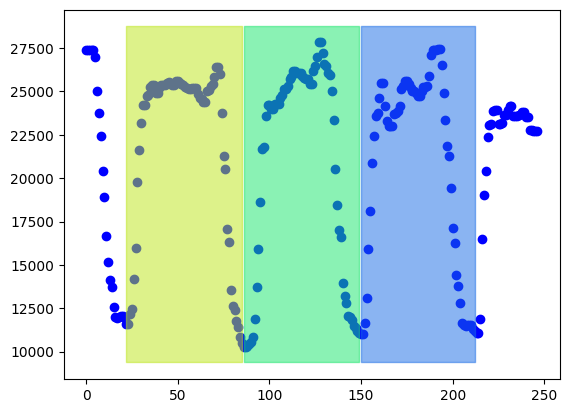

0.6065067469300973


<ipython-input-30-a83ed088f64e>:165: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


==========       1 / 1276  -  0.07836990595611286  % complete      ==========
         Current MAE =  0.04698884243009738
         Current DSC =  0.9539294242858887


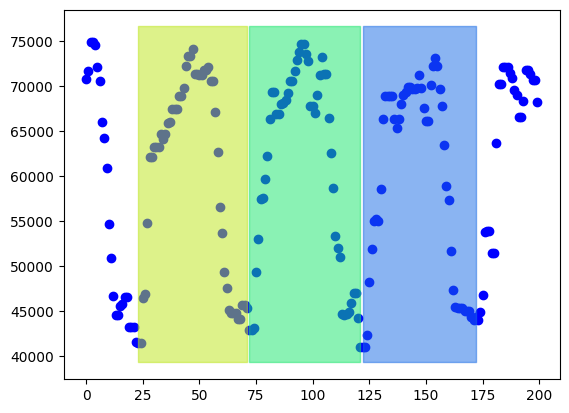

0.43528454254116683
==========       2 / 1276  -  0.15673981191222572  % complete      ==========
         Current MAE =  0.03606456953563211
         Current DSC =  0.948847234249115


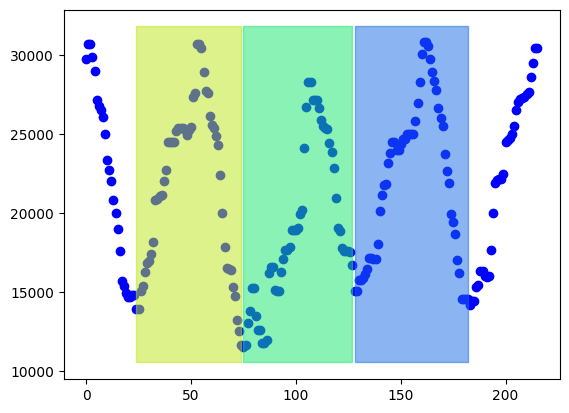

0.5708102938065762
==========       3 / 1276  -  0.23510971786833856  % complete      ==========
         Current MAE =  0.044997418092613505
         Current DSC =  0.9455796082814535


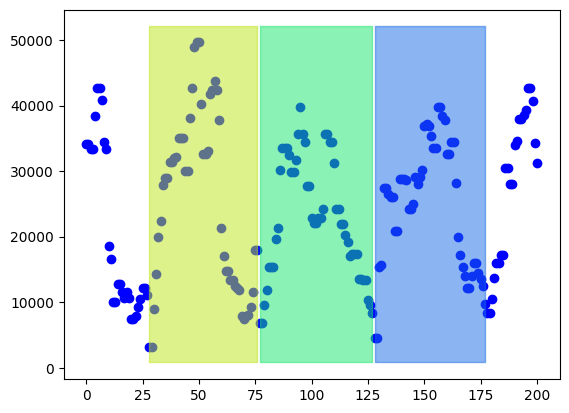

0.8835872616097324
==========       4 / 1276  -  0.31347962382445144  % complete      ==========
         Current MAE =  0.12805742527189323
         Current DSC =  0.8926962614059448


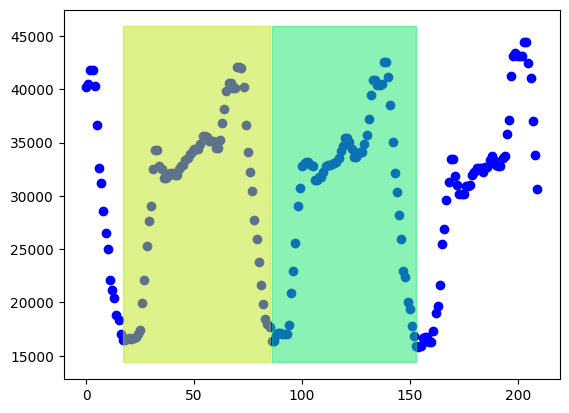

0.6116869364986525
==========       5 / 1276  -  0.39184952978056425  % complete      ==========
         Current MAE =  0.1063047247777841
         Current DSC =  0.9061781644821167


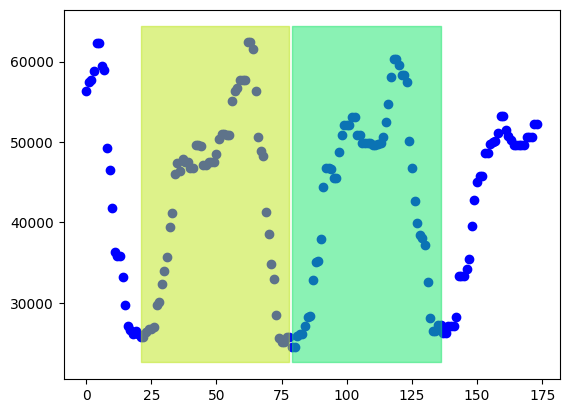

0.5960328041954952
==========       6 / 1276  -  0.4702194357366771  % complete      ==========
         Current MAE =  0.09043534073073595
         Current DSC =  0.8905092080434164


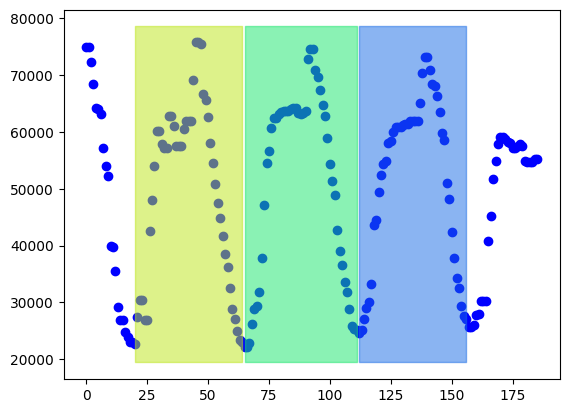

0.689263348491063
==========       7 / 1276  -  0.54858934169279  % complete      ==========
         Current MAE =  0.07972281939649695
         Current DSC =  0.8969862290791103


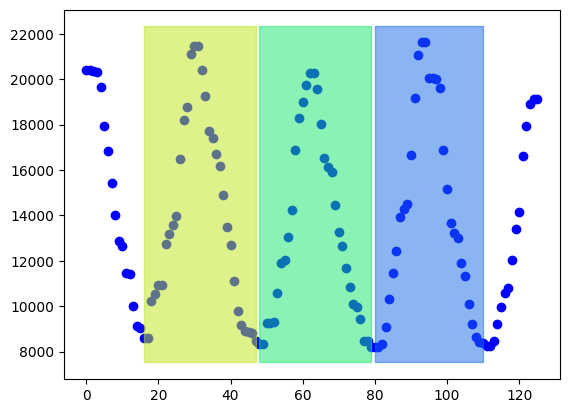

0.603373197971868
==========       8 / 1276  -  0.6269592476489029  % complete      ==========
         Current MAE =  0.07357297968091832
         Current DSC =  0.9000607132911682


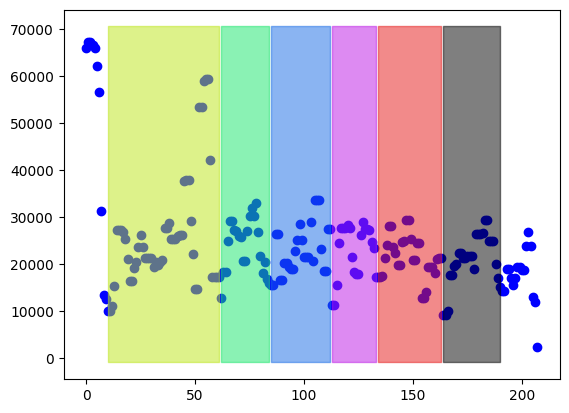

0.641504402355782
==========       9 / 1276  -  0.7053291536050157  % complete      ==========
         Current MAE =  0.07010024194479206
         Current DSC =  0.9006014400058322


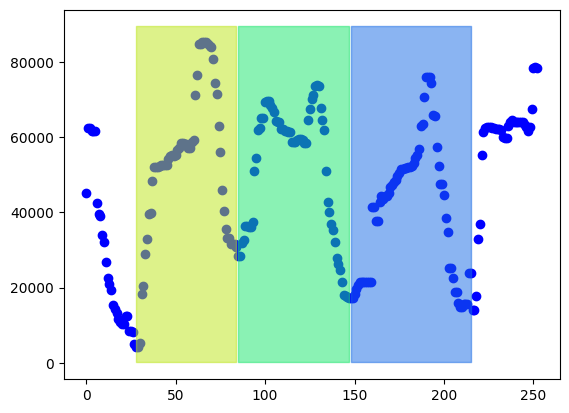

0.8395613897997966
==========       10 / 1276  -  0.7836990595611285  % complete      ==========
         Current MAE =  0.08601953230029251
         Current DSC =  0.8995416641235352


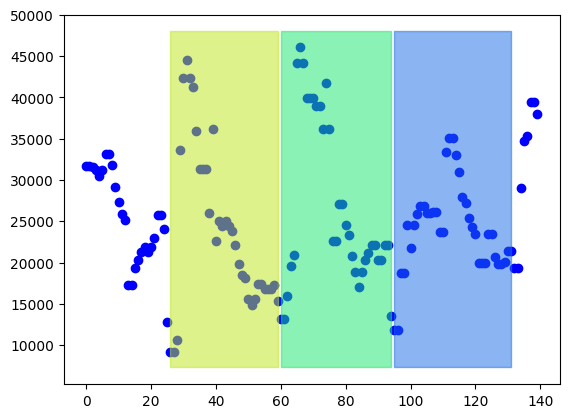

0.7240601138806877
==========       11 / 1276  -  0.8620689655172413  % complete      ==========
         Current MAE =  0.08789975601669207
         Current DSC =  0.8901572335850109


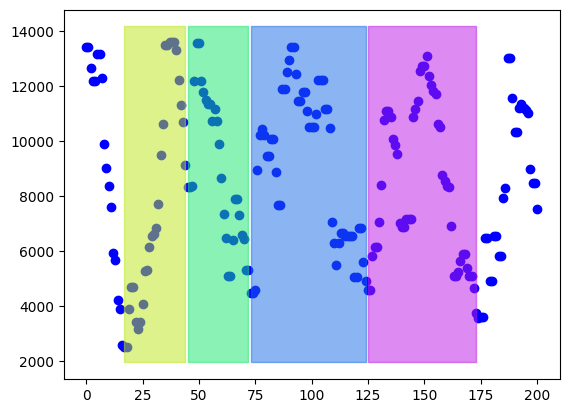

0.6887478384218244
==========       12 / 1276  -  0.9404388714733543  % complete      ==========
         Current MAE =  0.09335224465878644
         Current DSC =  0.8790040810902914


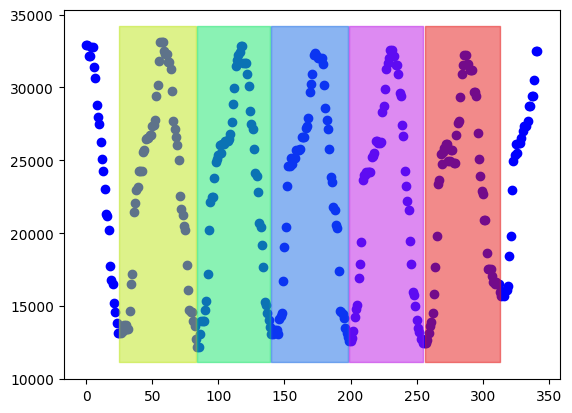

0.6111662850430575
==========       13 / 1276  -  1.0188087774294672  % complete      ==========
         Current MAE =  0.09083531441142267
         Current DSC =  0.8799136601961576


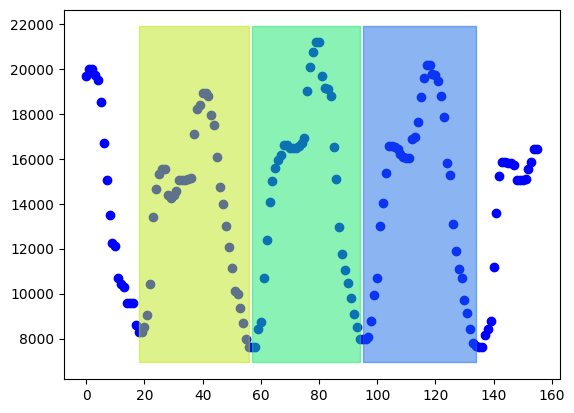

0.6110412521526564
==========       14 / 1276  -  1.09717868338558  % complete      ==========
         Current MAE =  0.0957913682715108
         Current DSC =  0.8813117487089974


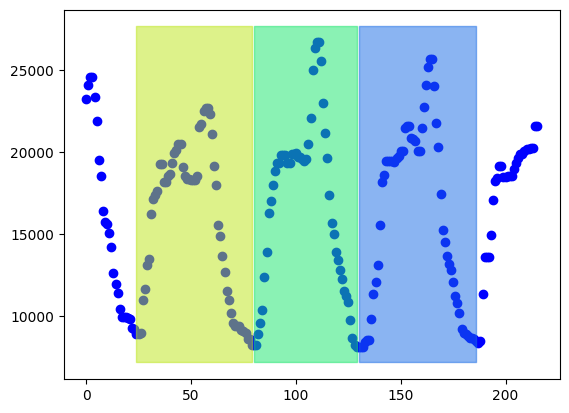

0.6660195138708632
==========       15 / 1276  -  1.1755485893416928  % complete      ==========
         Current MAE =  0.09046514094868587
         Current DSC =  0.8791316588719685


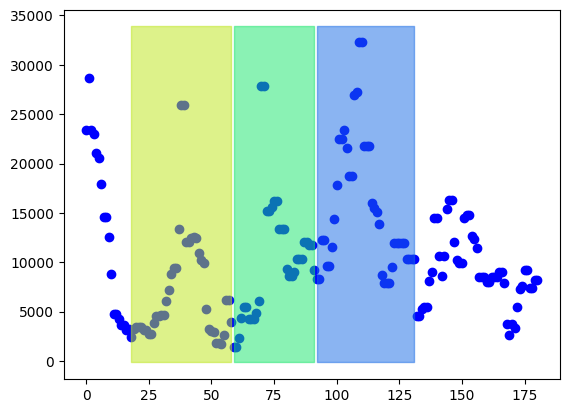

0.8805542218680321
==========       16 / 1276  -  1.2539184952978057  % complete      ==========
         Current MAE =  0.09772094079364499
         Current DSC =  0.8409249186515808


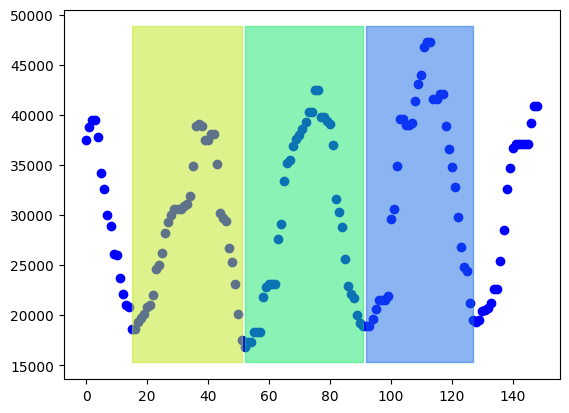

0.5761509690329847
==========       17 / 1276  -  1.3322884012539185  % complete      ==========
         Current MAE =  0.09276141882737265
         Current DSC =  0.8471894123974968


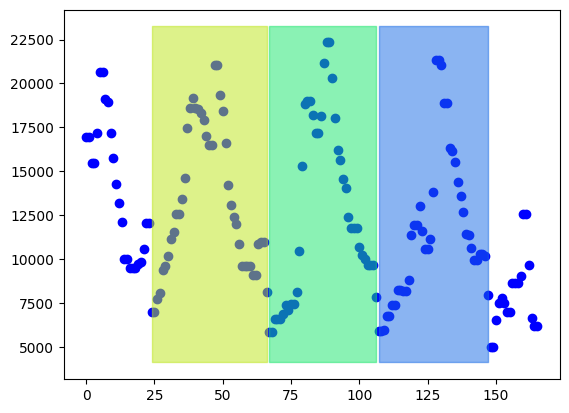

0.7099548477718671
==========       18 / 1276  -  1.4106583072100314  % complete      ==========
         Current MAE =  0.09393221992428902
         Current DSC =  0.8489608764648438


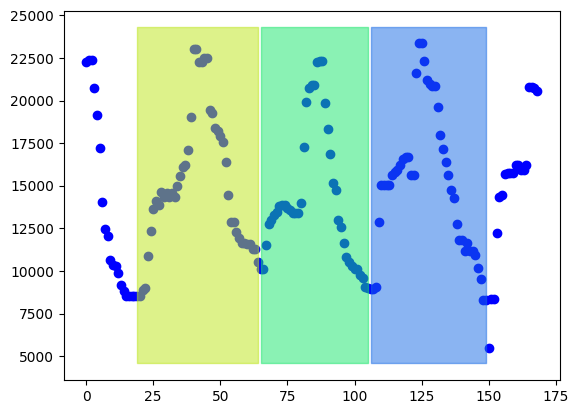

0.6231223201293273
==========       19 / 1276  -  1.4890282131661443  % complete      ==========
         Current MAE =  0.09382938248771208
         Current DSC =  0.852180960931276


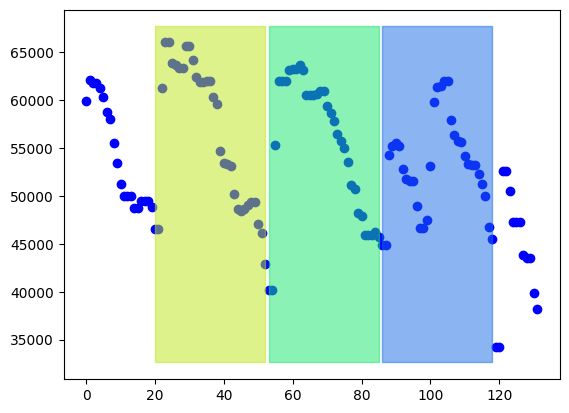

0.31564455560478794
==========       20 / 1276  -  1.567398119122257  % complete      ==========
         Current MAE =  0.09538697531856588
         Current DSC =  0.855373415350914


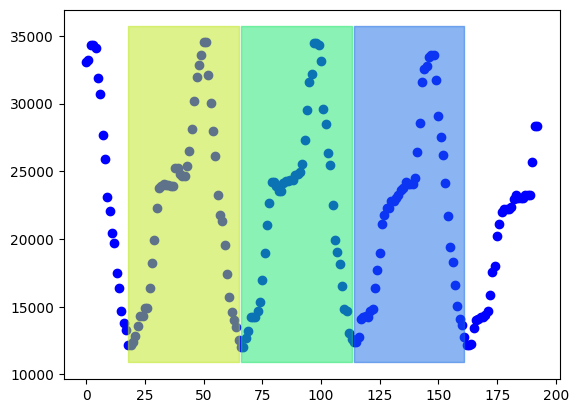

0.6434021914381799
==========       21 / 1276  -  1.64576802507837  % complete      ==========
         Current MAE =  0.0936111888290237
         Current DSC =  0.8575213892119271


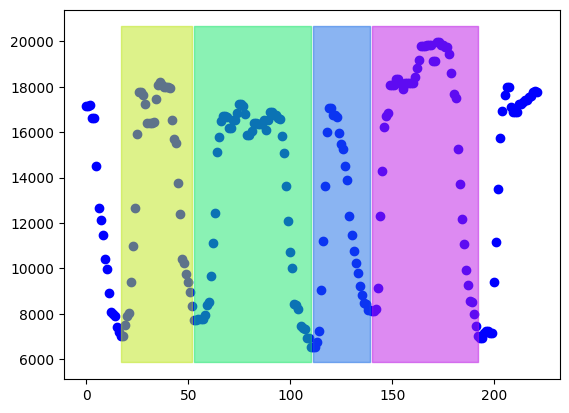

0.6144341678332854
==========       22 / 1276  -  1.7241379310344827  % complete      ==========
         Current MAE =  0.09111513197619146
         Current DSC =  0.8569022769277747


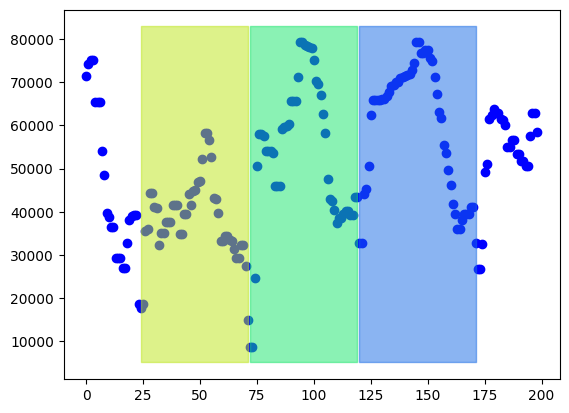

0.7242012001969239
==========       23 / 1276  -  1.8025078369905956  % complete      ==========
         Current MAE =  0.09490228320317984
         Current DSC =  0.8609333945357281


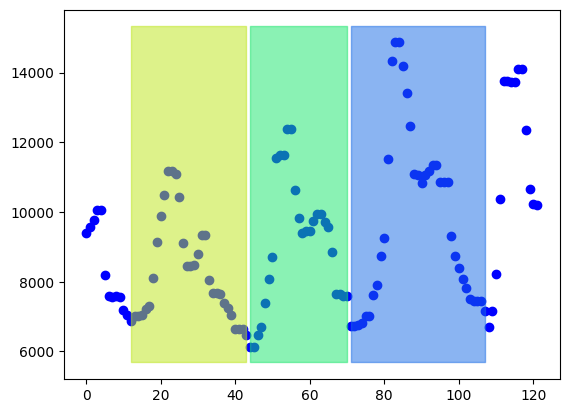

0.4858262341563569
==========       24 / 1276  -  1.8808777429467085  % complete      ==========
         Current MAE =  0.09500255055903246
         Current DSC =  0.8616267318526903


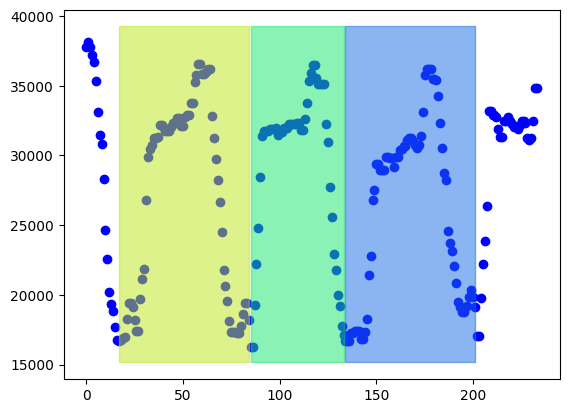

0.5459327056262236
==========       25 / 1276  -  1.9592476489028212  % complete      ==========
         Current MAE =  0.09169045294762222
         Current DSC =  0.864344265460968


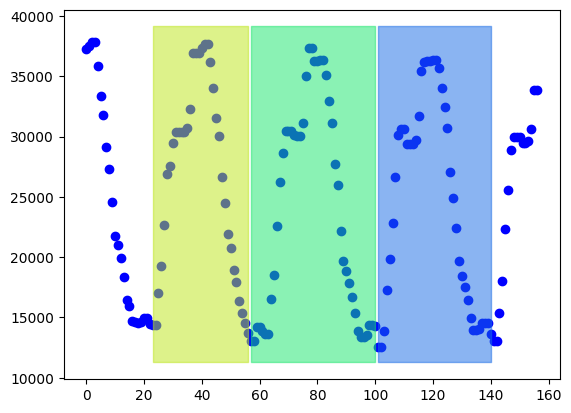

0.6415919766314943
==========       26 / 1276  -  2.0376175548589344  % complete      ==========
         Current MAE =  0.08854962029073313
         Current DSC =  0.8672644129166236


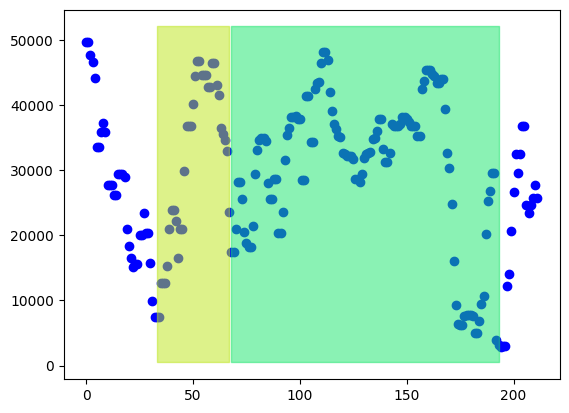

0.8791575827216895
==========       27 / 1276  -  2.115987460815047  % complete      ==========
         Current MAE =  0.10843121205484262
         Current DSC =  0.8662218937167415


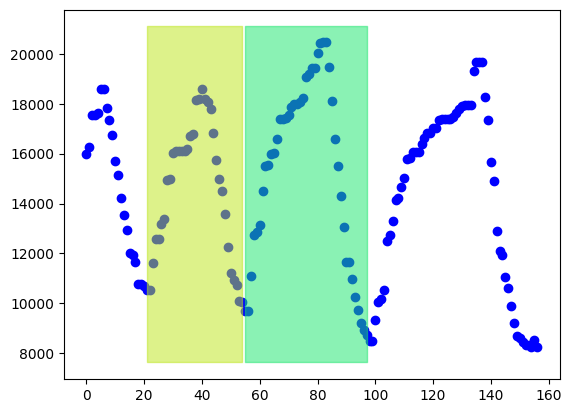

0.510951602836363
==========       28 / 1276  -  2.19435736677116  % complete      ==========
         Current MAE =  0.10674724375418264
         Current DSC =  0.8676796023334775


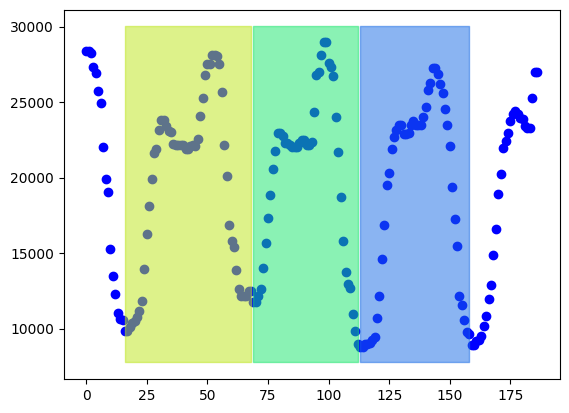

0.6630674278089942
==========       29 / 1276  -  2.272727272727273  % complete      ==========
         Current MAE =  0.10353325598993515
         Current DSC =  0.8705118627383791


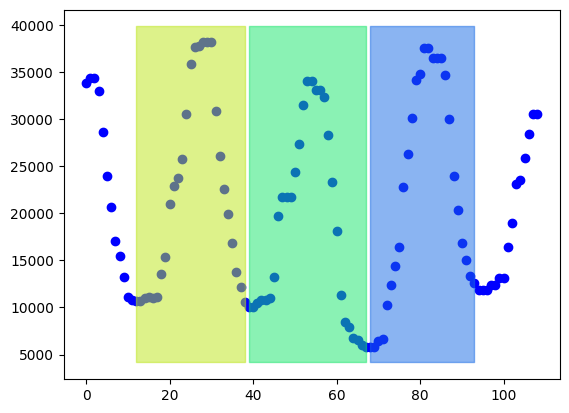

0.7965263522310196
==========       30 / 1276  -  2.3510971786833856  % complete      ==========
         Current MAE =  0.1042856266979713
         Current DSC =  0.8725870708624522


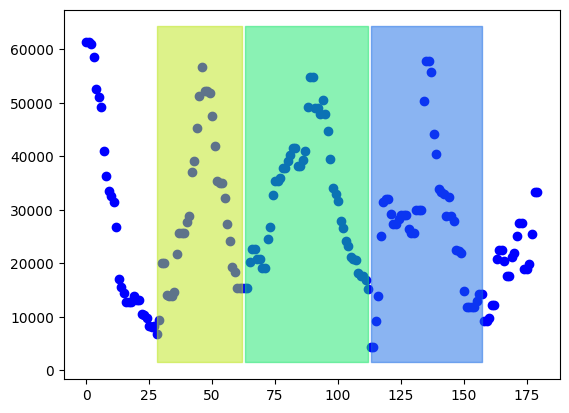

0.841044369208488
==========       31 / 1276  -  2.4294670846394983  % complete      ==========
         Current MAE =  0.1060241333757299
         Current DSC =  0.8709788110948378


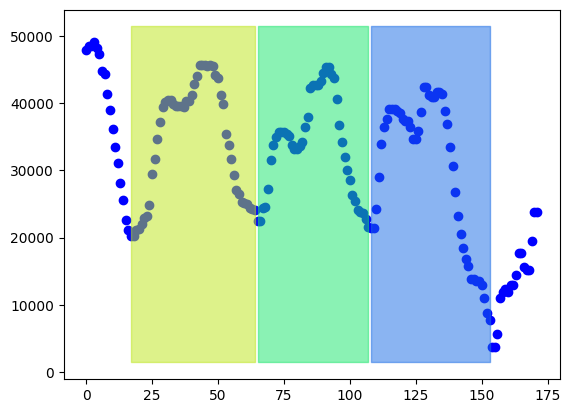

0.6175429932927998
==========       32 / 1276  -  2.5078369905956115  % complete      ==========
         Current MAE =  0.10510161782938834
         Current DSC =  0.8729942813515663


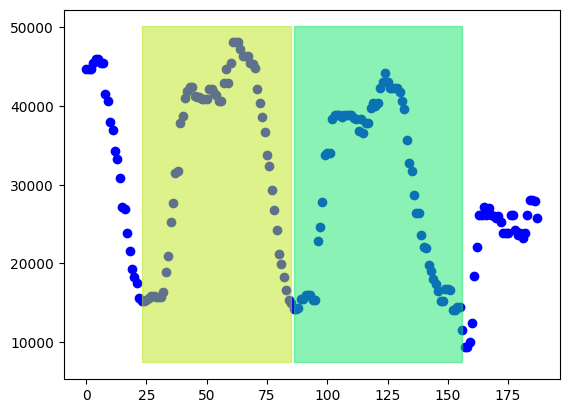

0.6821387641565353
==========       33 / 1276  -  2.586206896551724  % complete      ==========
         Current MAE =  0.10269621561202917
         Current DSC =  0.8721861279372013


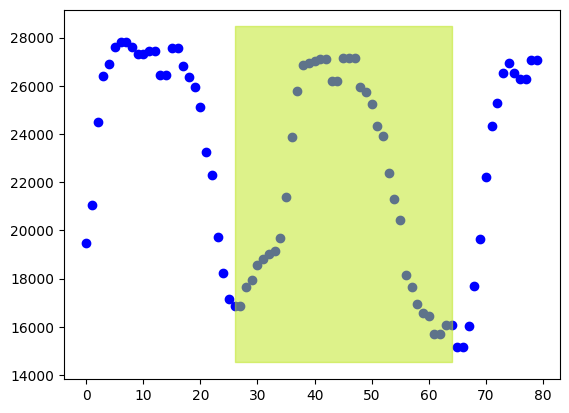

0.42234752305275064
==========       34 / 1276  -  2.664576802507837  % complete      ==========
         Current MAE =  0.10076954043953563
         Current DSC =  0.8736207818283754


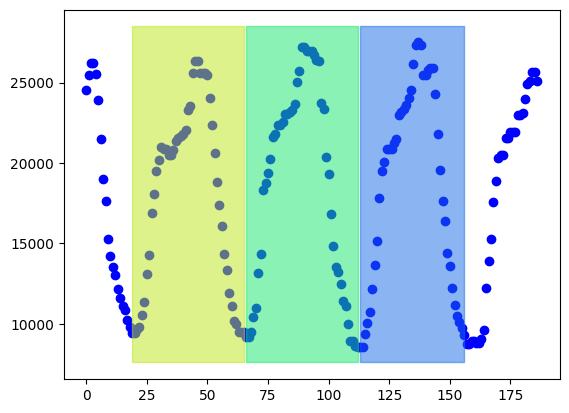

0.6709446058373252
==========       35 / 1276  -  2.74294670846395  % complete      ==========
         Current MAE =  0.0981844593030539
         Current DSC =  0.8754228915487017


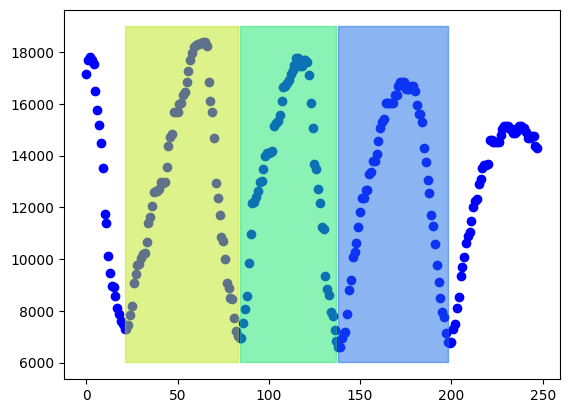

0.6083535637089384
==========       36 / 1276  -  2.8213166144200628  % complete      ==========
         Current MAE =  0.09576826314160967
         Current DSC =  0.8764085488186942


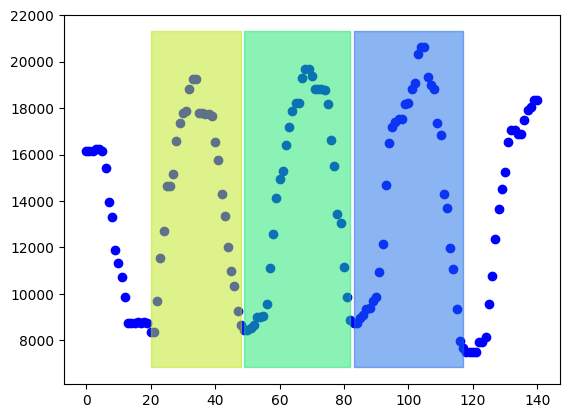

0.5830172137587079
==========       37 / 1276  -  2.8996865203761755  % complete      ==========
         Current MAE =  0.09429138855511461
         Current DSC =  0.878361780901213


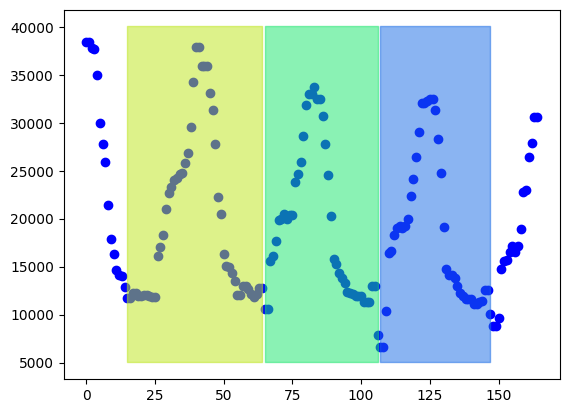

0.7254388902508794
==========       38 / 1276  -  2.9780564263322886  % complete      ==========
         Current MAE =  0.09345557558921368
         Current DSC =  0.8790870214763441


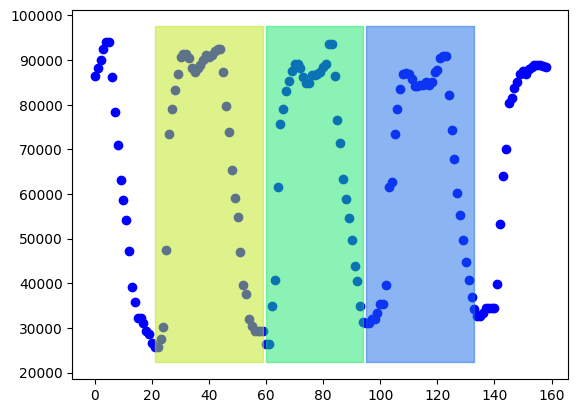

0.6996798479518115
==========       39 / 1276  -  3.0564263322884013  % complete      ==========
         Current MAE =  0.0923436092318444
         Current DSC =  0.8803209616587713


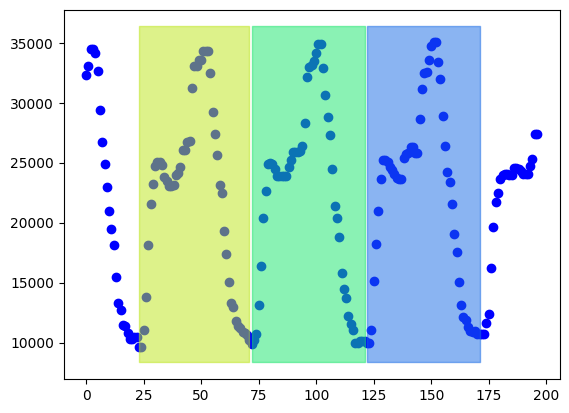

0.7175156893920219
==========       40 / 1276  -  3.134796238244514  % complete      ==========
         Current MAE =  0.09251865690584882
         Current DSC =  0.8816933542490005


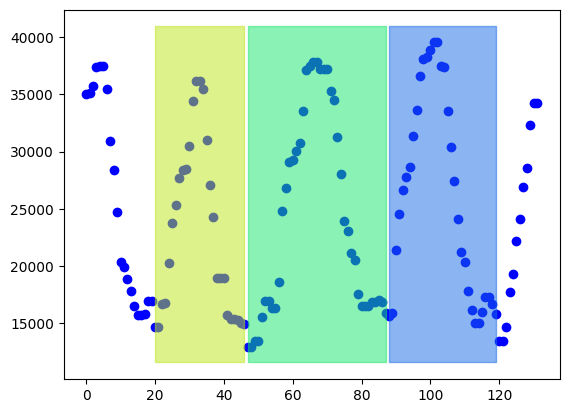

0.6244041724210138
==========       41 / 1276  -  3.2131661442006267  % complete      ==========
         Current MAE =  0.09144763507207235
         Current DSC =  0.8809172816392852


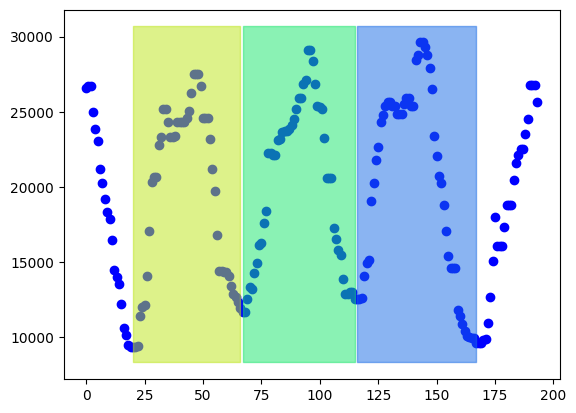

0.6418795700726291
==========       42 / 1276  -  3.29153605015674  % complete      ==========
         Current MAE =  0.09627441926494275
         Current DSC =  0.8813156755197615


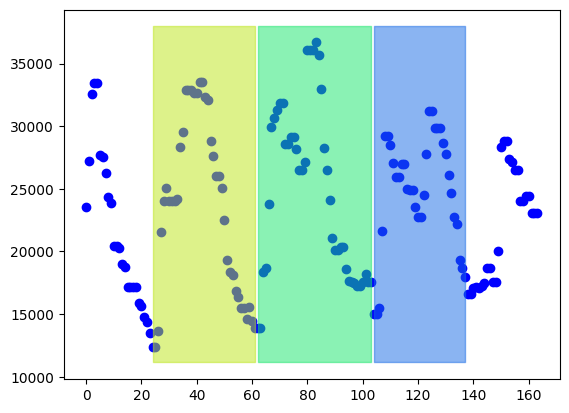

0.5906509691402864
==========       43 / 1276  -  3.3699059561128526  % complete      ==========
         Current MAE =  0.0961064230573926
         Current DSC =  0.8806561578151791


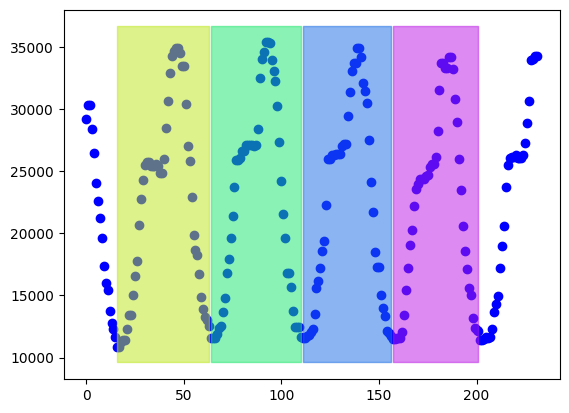

0.6740725550802609
==========       44 / 1276  -  3.4482758620689653  % complete      ==========
         Current MAE =  0.09392415169744593
         Current DSC =  0.8815571665763855


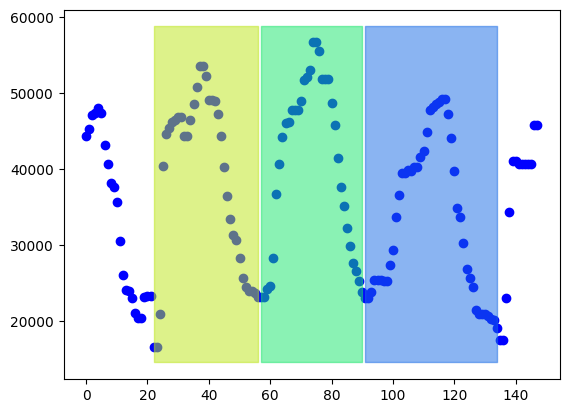

0.6235501088314824
==========       45 / 1276  -  3.5266457680250785  % complete      ==========
         Current MAE =  0.09273994214042452
         Current DSC =  0.8817625522613526


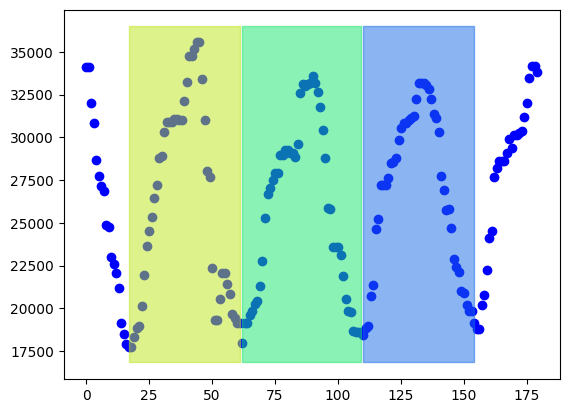

0.47000250213360234
==========       46 / 1276  -  3.605015673981191  % complete      ==========
         Current MAE =  0.0918138854975109
         Current DSC =  0.8827331066131592


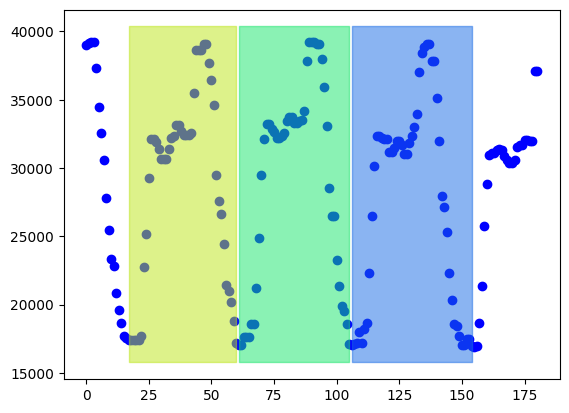

0.5609159445074869
==========       47 / 1276  -  3.683385579937304  % complete      ==========
         Current MAE =  0.0909569625846386
         Current DSC =  0.8834515328102923


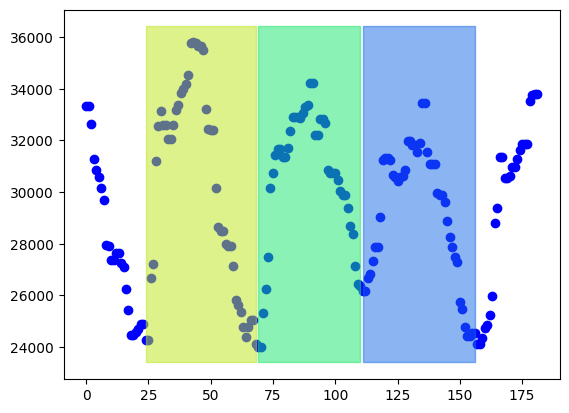

0.29728574026289645
==========       48 / 1276  -  3.761755485893417  % complete      ==========
         Current MAE =  0.0904271166758523
         Current DSC =  0.8846048712730408


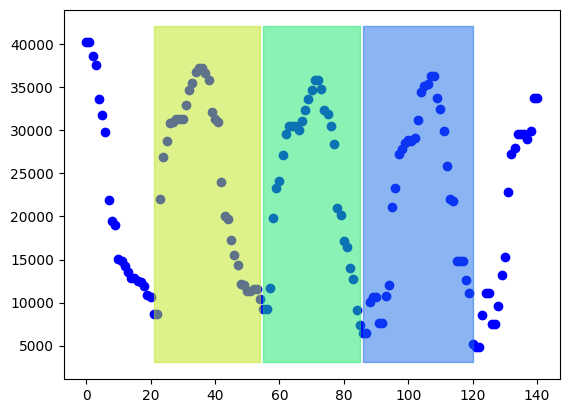

0.7767040169450276
==========       49 / 1276  -  3.8401253918495297  % complete      ==========
         Current MAE =  0.09248784281808037
         Current DSC =  0.8848700182778495


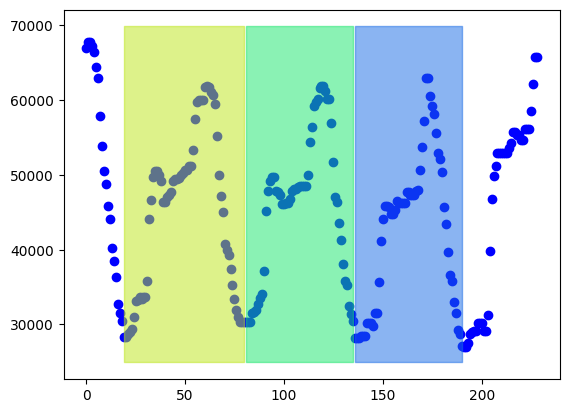

0.536079711765349
==========       50 / 1276  -  3.9184952978056424  % complete      ==========
         Current MAE =  0.09137276509641179
         Current DSC =  0.8858189415931702


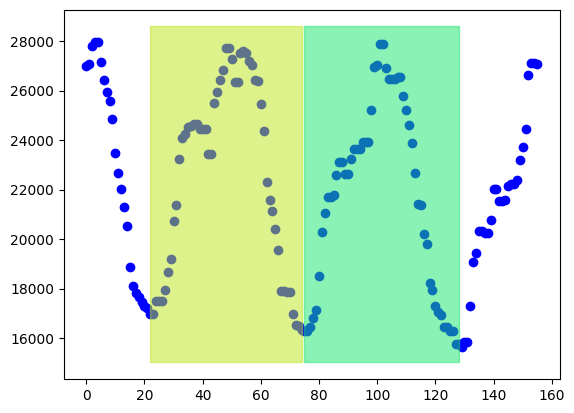

0.41976031742423703
==========       51 / 1276  -  3.9968652037617556  % complete      ==========
         Current MAE =  0.09172067818911424
         Current DSC =  0.8870668458003624


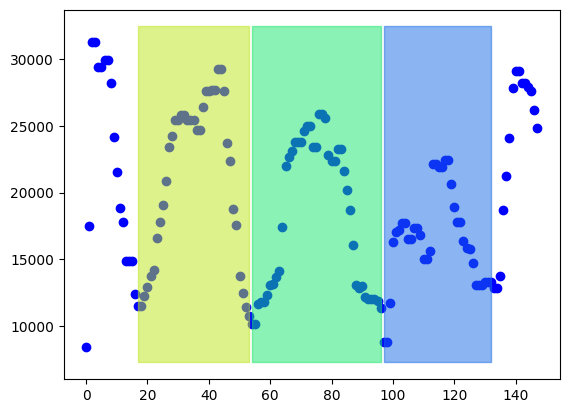

0.6091215776546761
==========       52 / 1276  -  4.075235109717869  % complete      ==========
         Current MAE =  0.09056048810768275
         Current DSC =  0.8879959961542716


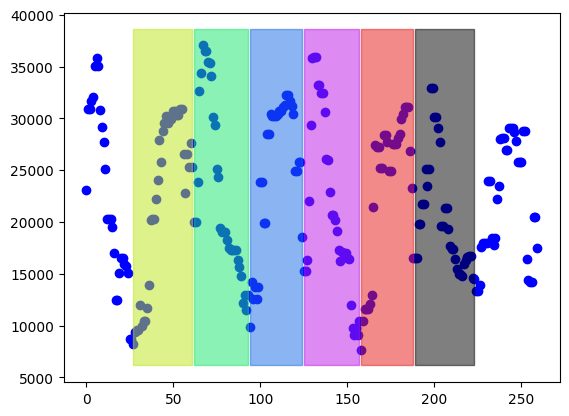

0.6959410699884634
==========       53 / 1276  -  4.153605015673981  % complete      ==========
         Current MAE =  0.09079307809599935
         Current DSC =  0.8869357986270257


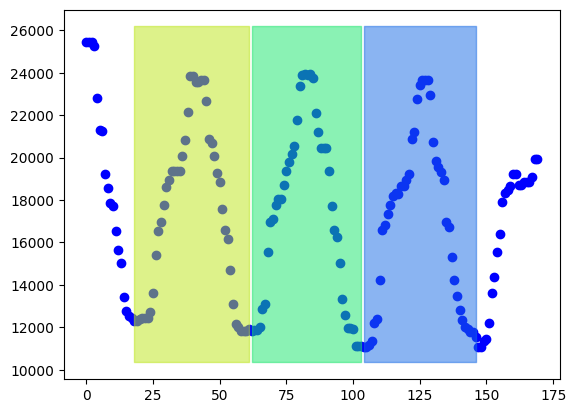

0.524211401906009
==========       54 / 1276  -  4.231974921630094  % complete      ==========
         Current MAE =  0.09152049245336957
         Current DSC =  0.8872841431034936


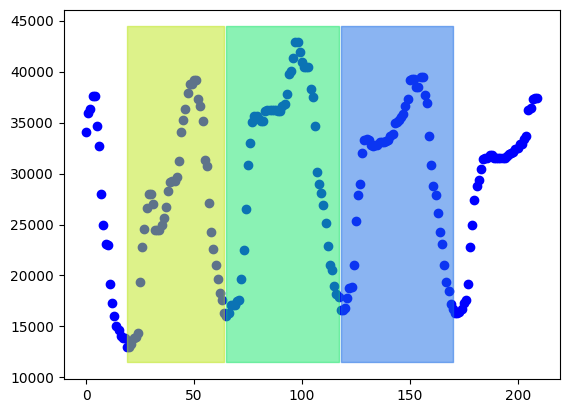

0.6252289952691239
==========       55 / 1276  -  4.310344827586207  % complete      ==========
         Current MAE =  0.0901353362820515
         Current DSC =  0.8878054813905196


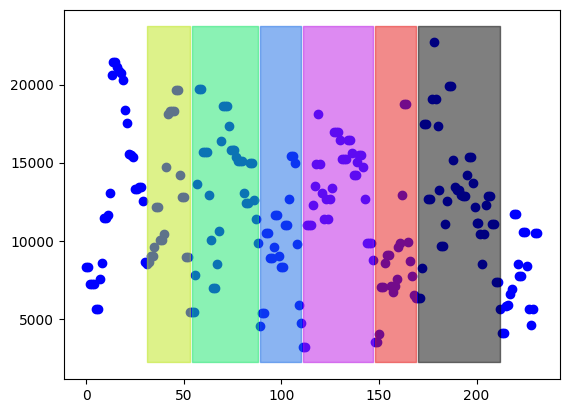

0.7258614892407559
==========       56 / 1276  -  4.38871473354232  % complete      ==========
         Current MAE =  0.09117632993131408
         Current DSC =  0.8846793036375727


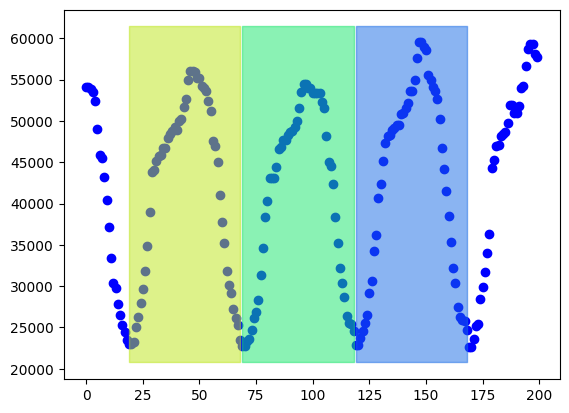

0.5957475915362799
==========       57 / 1276  -  4.467084639498433  % complete      ==========
         Current MAE =  0.08985551470333103
         Current DSC =  0.8857860115536472


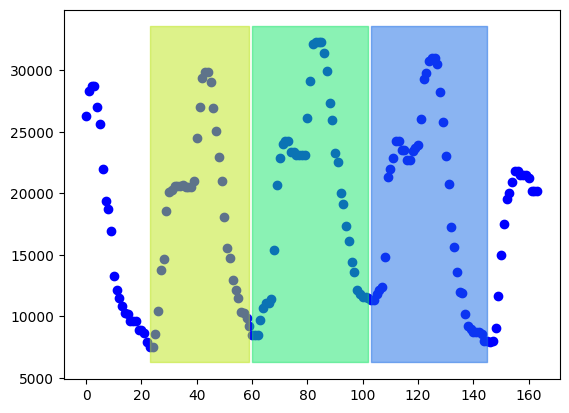

0.7426270554083295
==========       58 / 1276  -  4.545454545454546  % complete      ==========
         Current MAE =  0.09063584820169308
         Current DSC =  0.8867288714852827


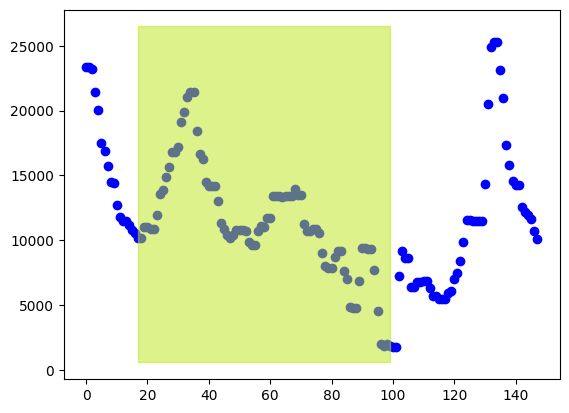

0.9134796350933186
==========       59 / 1276  -  4.623824451410658  % complete      ==========
         Current MAE =  0.09324506535578843
         Current DSC =  0.8869582566164308


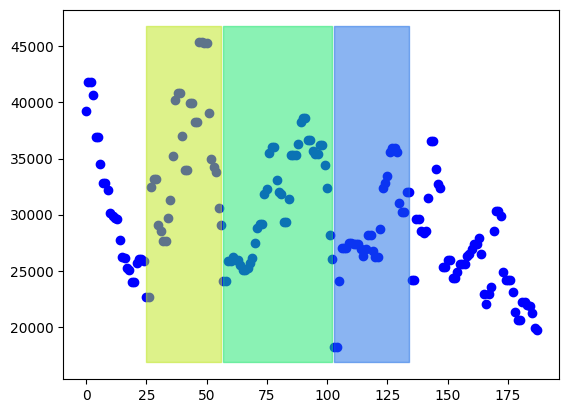

0.45676675363654695
==========       60 / 1276  -  4.702194357366771  % complete      ==========
         Current MAE =  0.09182659603880107
         Current DSC =  0.8878314842780431


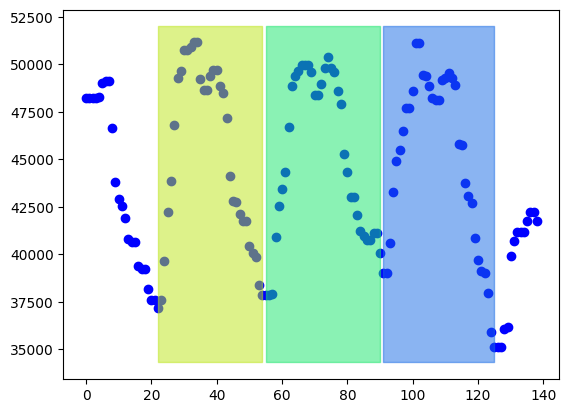

0.27309620138755647
==========       61 / 1276  -  4.780564263322884  % complete      ==========
         Current MAE =  0.09163481187566591
         Current DSC =  0.8888932486049465


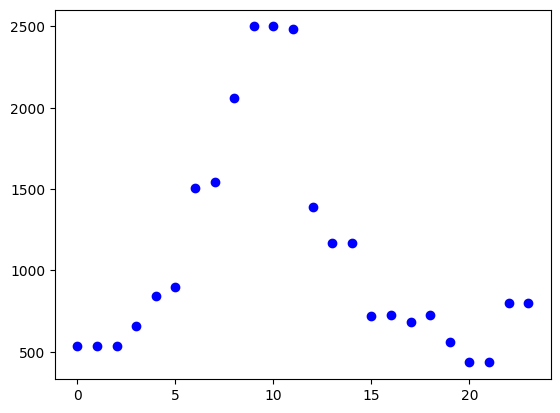

nan
==========       62 / 1276  -  4.858934169278997  % complete      ==========
         Current MAE =  0.09163481187566591
         Current DSC =  0.8786231154395688


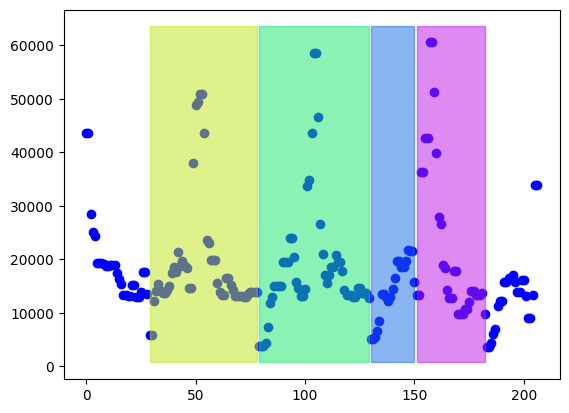

0.8560417767588142
==========       63 / 1276  -  4.93730407523511  % complete      ==========
         Current MAE =  0.09271645746249088
         Current DSC =  0.8769899426944672


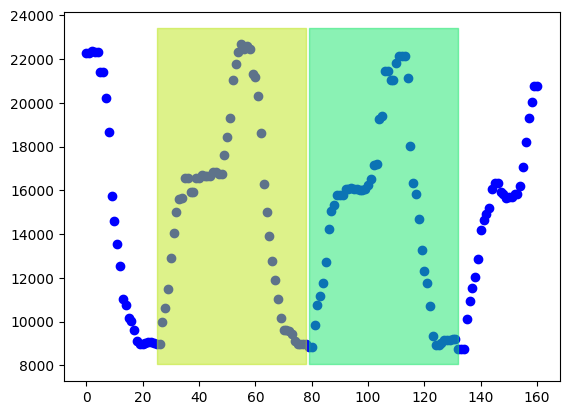

0.6027576375174137
==========       64 / 1276  -  5.015673981191223  % complete      ==========
         Current MAE =  0.09179050746439715
         Current DSC =  0.8774330234155059


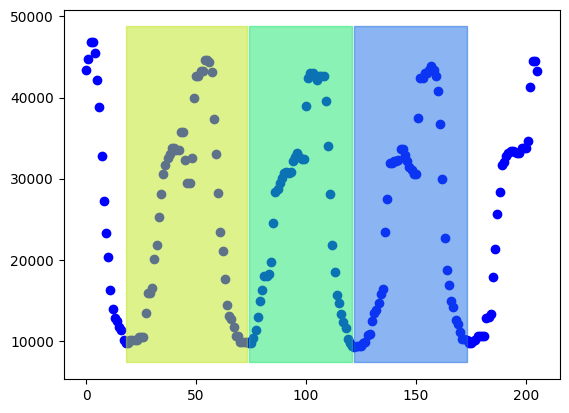

0.7819040072448041
==========       65 / 1276  -  5.094043887147335  % complete      ==========
         Current MAE =  0.09166131293284101
         Current DSC =  0.8781313804479746


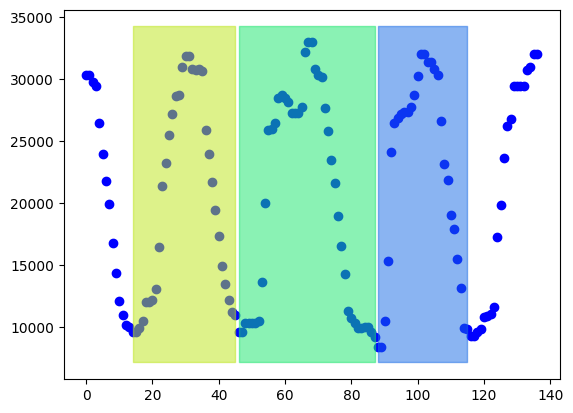

0.715138430881663
==========       66 / 1276  -  5.172413793103448  % complete      ==========
         Current MAE =  0.09068324268436134
         Current DSC =  0.878664900859197


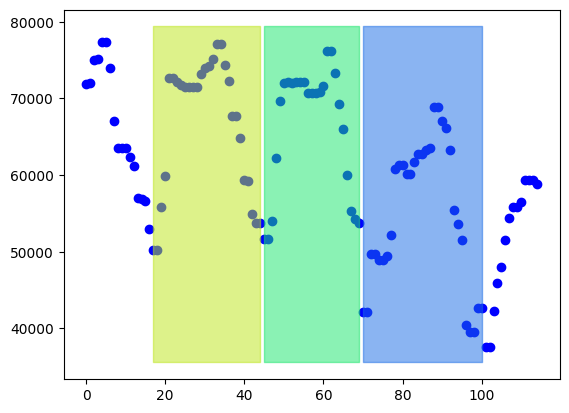

0.36552419117931306
==========       67 / 1276  -  5.2507836990595615  % complete      ==========
         Current MAE =  0.09159581430095153
         Current DSC =  0.8798759401734195


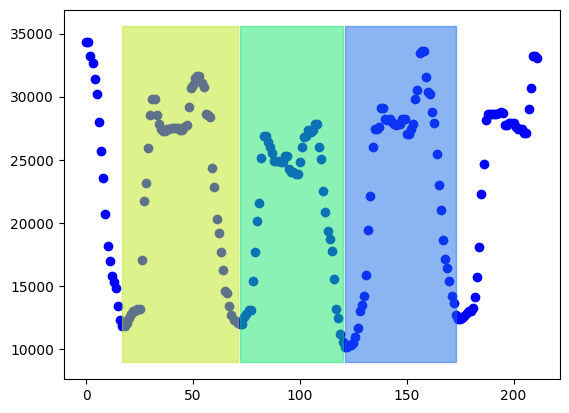

0.6400225783766406
==========       68 / 1276  -  5.329153605015674  % complete      ==========
         Current MAE =  0.09051351183193196
         Current DSC =  0.8806421818102107


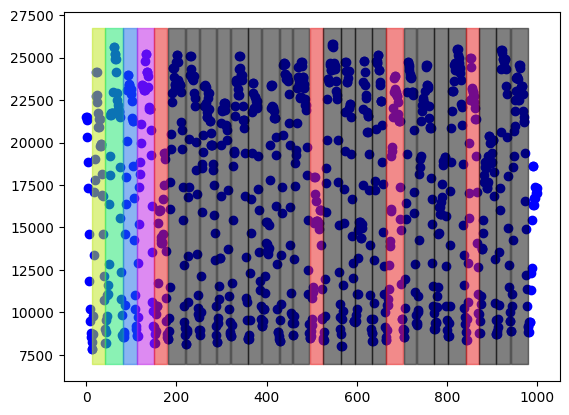

0.6407139026203911
==========       69 / 1276  -  5.407523510971787  % complete      ==========
         Current MAE =  0.09029160660910368
         Current DSC =  0.8797700431035913


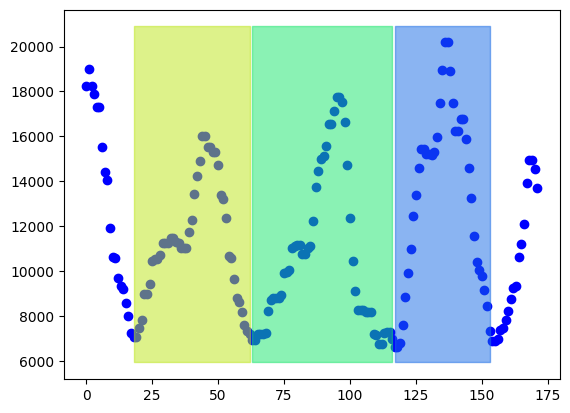

0.6174132951059937
==========       70 / 1276  -  5.4858934169279  % complete      ==========
         Current MAE =  0.08902768421920354
         Current DSC =  0.879495723758425


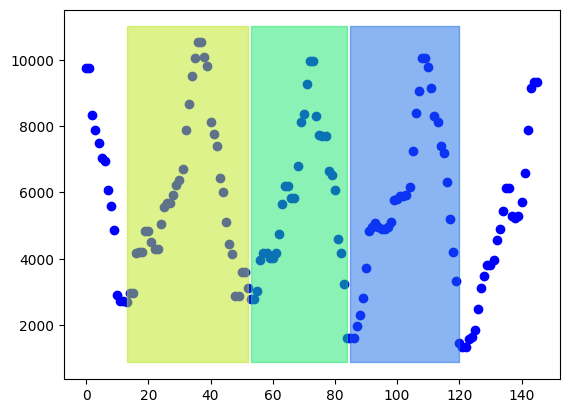

0.7676030889117271
==========       71 / 1276  -  5.564263322884012  % complete      ==========
         Current MAE =  0.08787957657195387
         Current DSC =  0.8774834653021584


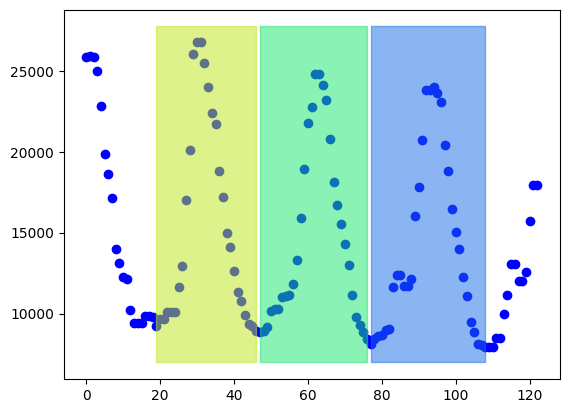

0.6540788763030809
==========       72 / 1276  -  5.6426332288401255  % complete      ==========
         Current MAE =  0.08717882271315057
         Current DSC =  0.87787297864755


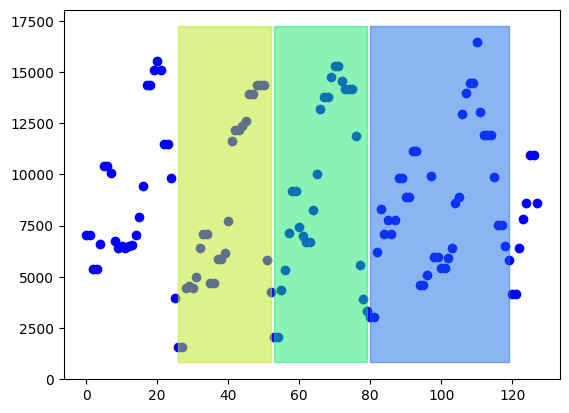

0.8577932861057608
==========       73 / 1276  -  5.721003134796239  % complete      ==========
         Current MAE =  0.09020800713249237
         Current DSC =  0.8733603105153123


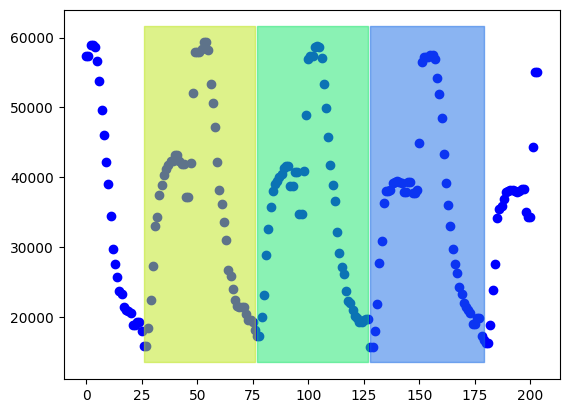

0.7215497766267372
==========       74 / 1276  -  5.799373040752351  % complete      ==========
         Current MAE =  0.08991987930638613
         Current DSC =  0.8740886788110476


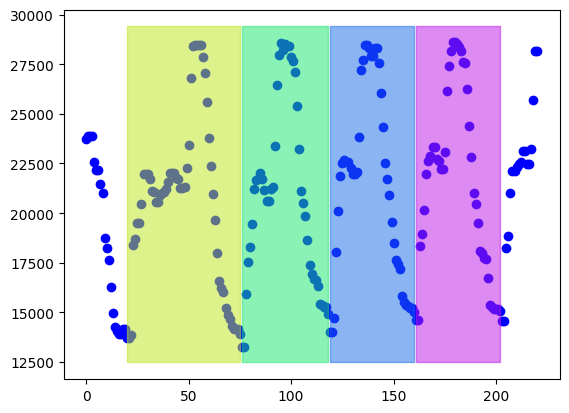

0.5133215598455259
==========       75 / 1276  -  5.877742946708464  % complete      ==========
         Current MAE =  0.09046658041109003
         Current DSC =  0.8745953178405762


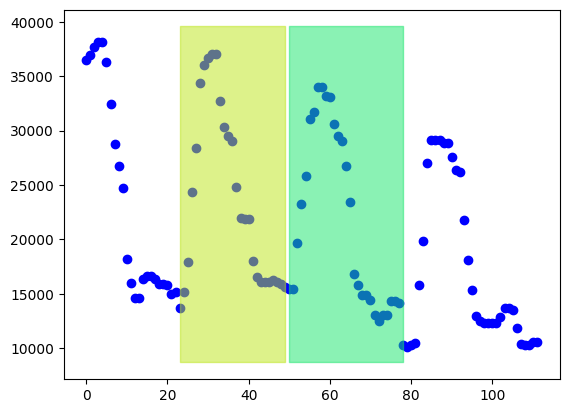

0.631467318611927
==========       76 / 1276  -  5.956112852664577  % complete      ==========
         Current MAE =  0.08966628976411646
         Current DSC =  0.874716402668702


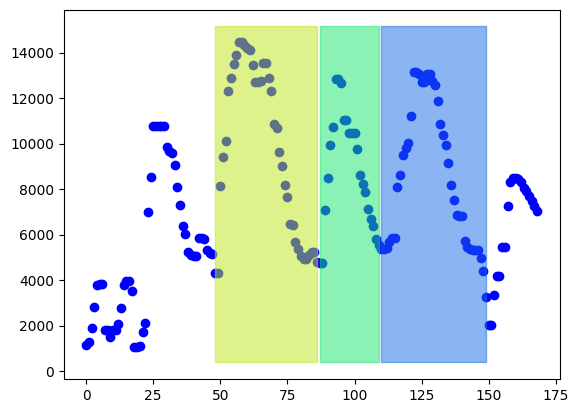

0.6665770661591853
==========       77 / 1276  -  6.0344827586206895  % complete      ==========
         Current MAE =  0.08906396936273579
         Current DSC =  0.8749018830138368


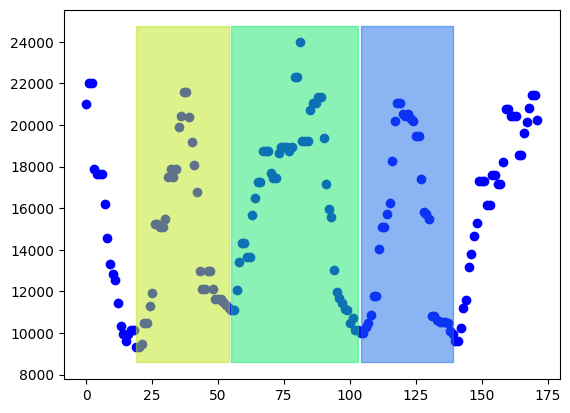

0.5572978262528427
==========       78 / 1276  -  6.112852664576803  % complete      ==========
         Current MAE =  0.08967441260409191
         Current DSC =  0.873454117622131


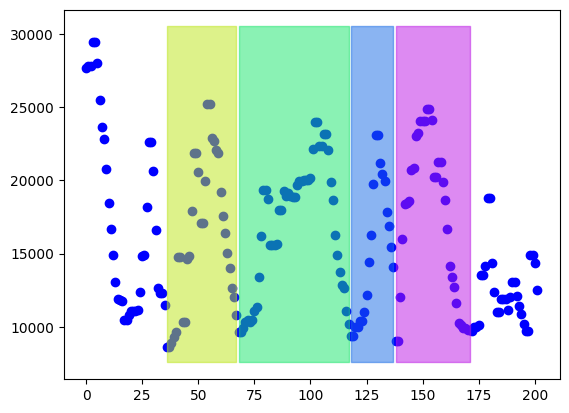

0.622540299103361
==========       79 / 1276  -  6.191222570532916  % complete      ==========
         Current MAE =  0.08875209356938098
         Current DSC =  0.8734352422665946


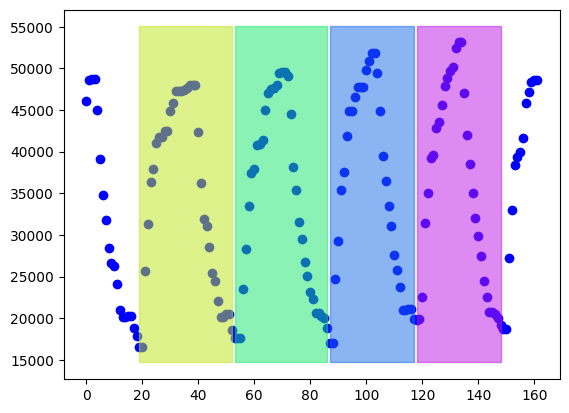

0.6507491218318638
==========       80 / 1276  -  6.269592476489028  % complete      ==========
         Current MAE =  0.08766021643139053
         Current DSC =  0.8739189401268959


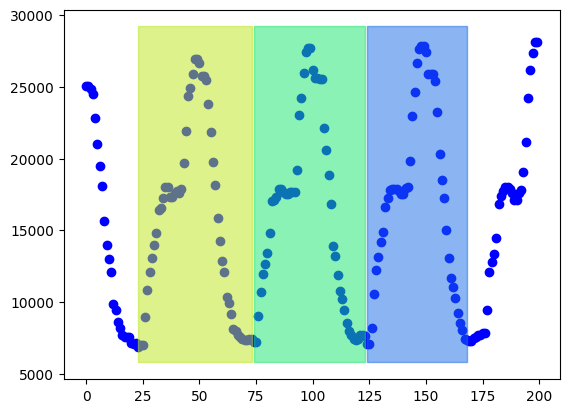

0.7426293018103793
==========       81 / 1276  -  6.347962382445141  % complete      ==========
         Current MAE =  0.08713778997112791
         Current DSC =  0.874354268297737


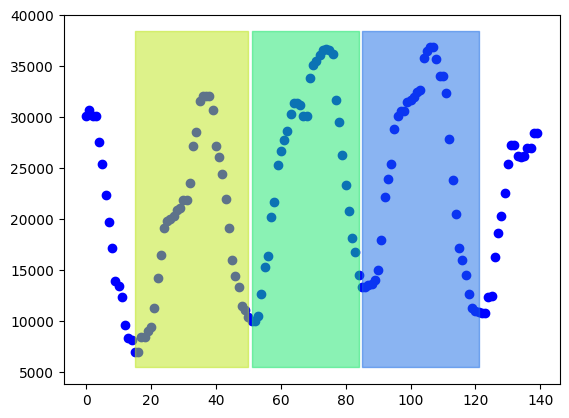

0.7382187094625096
==========       82 / 1276  -  6.4263322884012535  % complete      ==========
         Current MAE =  0.08702233880682397
         Current DSC =  0.8744830888945881


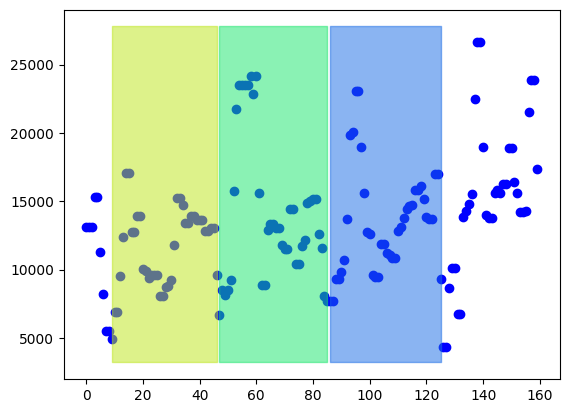

0.7001450889613913
==========       83 / 1276  -  6.504702194357367  % complete      ==========
         Current MAE =  0.09109508041236748
         Current DSC =  0.8712340887770595


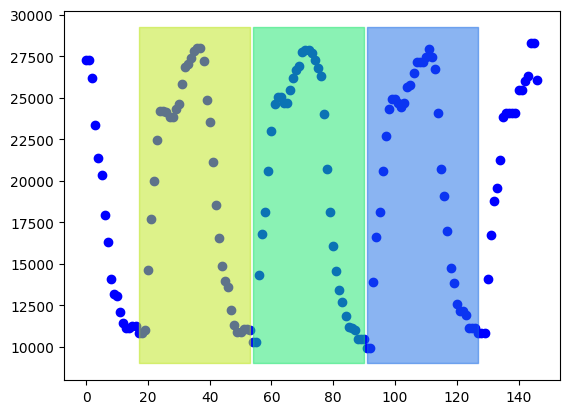

0.629288757872475
==========       84 / 1276  -  6.58307210031348  % complete      ==========
         Current MAE =  0.09064006643544167
         Current DSC =  0.8713242319368181


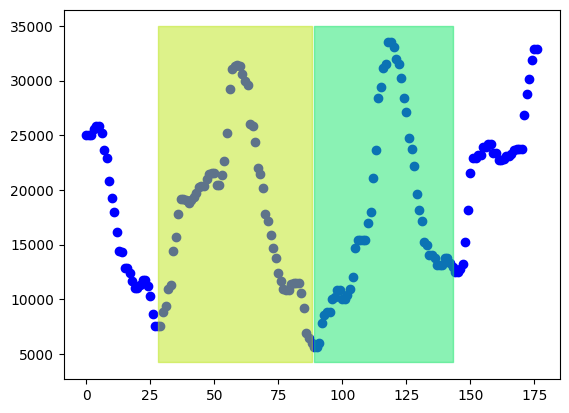

0.8141193495395547
==========       85 / 1276  -  6.661442006269592  % complete      ==========
         Current MAE =  0.09162457572477635
         Current DSC =  0.8719401703161351


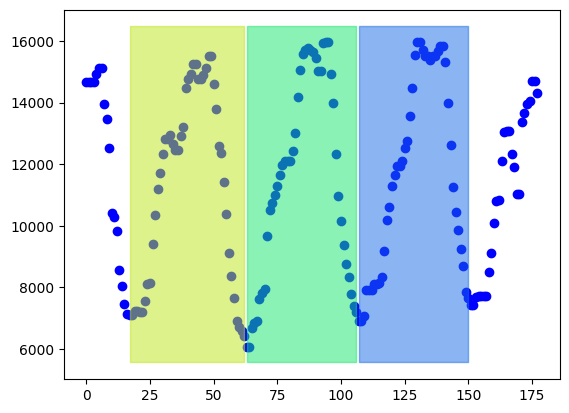

0.5881804055147059
==========       86 / 1276  -  6.739811912225705  % complete      ==========
         Current MAE =  0.09116732981607656
         Current DSC =  0.8725139089795046


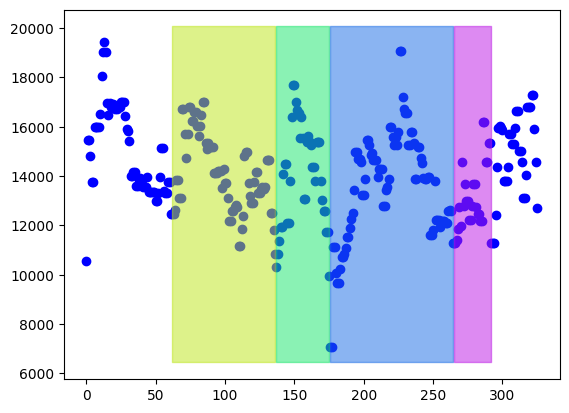

0.42295599816785245
==========       87 / 1276  -  6.818181818181818  % complete      ==========
         Current MAE =  0.09203025166044948
         Current DSC =  0.8718978289900154


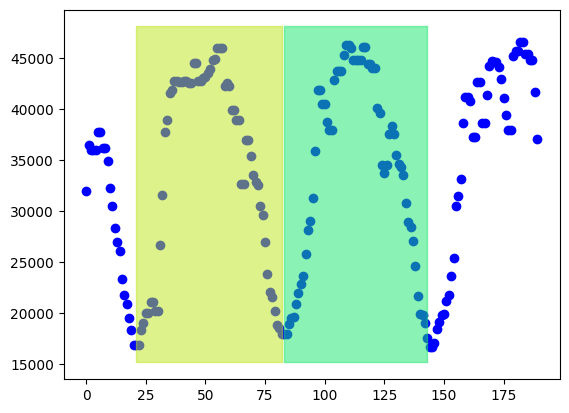

0.6229087354061227
==========       88 / 1276  -  6.896551724137931  % complete      ==========
         Current MAE =  0.0917336111378452
         Current DSC =  0.8719730268825184


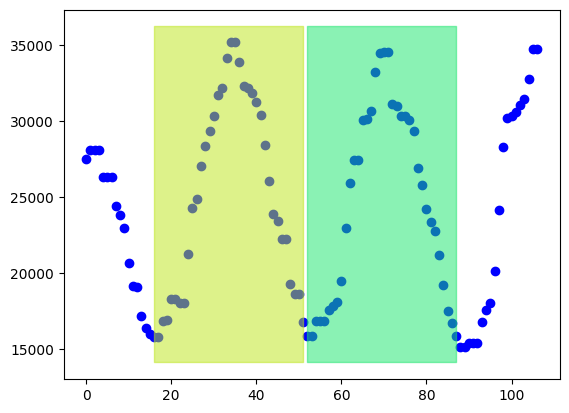

0.5466831853012832
==========       89 / 1276  -  6.974921630094044  % complete      ==========
         Current MAE =  0.09113626391467329
         Current DSC =  0.8718480139635922


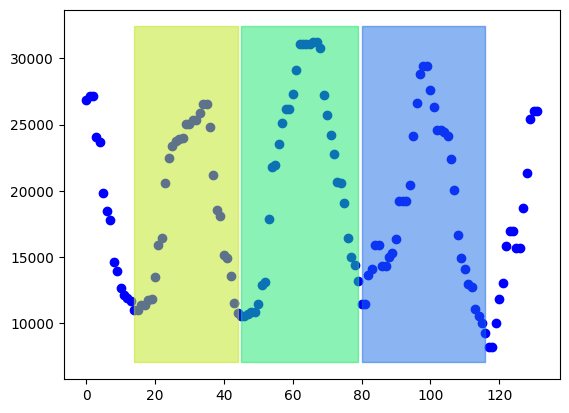

0.6356846674140962
==========       90 / 1276  -  7.053291536050157  % complete      ==========
         Current MAE =  0.0912417619663522
         Current DSC =  0.8718885428375668


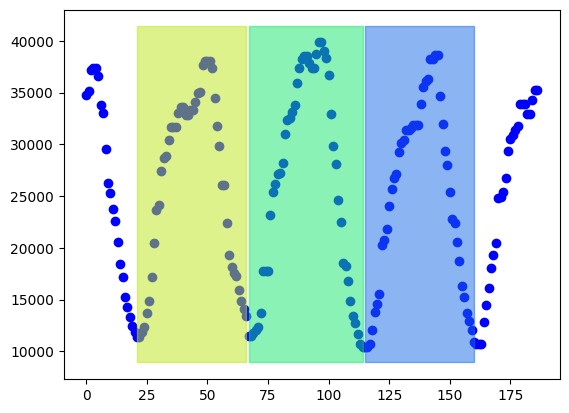

0.7208223641125017
==========       91 / 1276  -  7.131661442006269  % complete      ==========
         Current MAE =  0.09176890418908719
         Current DSC =  0.8718722325104934


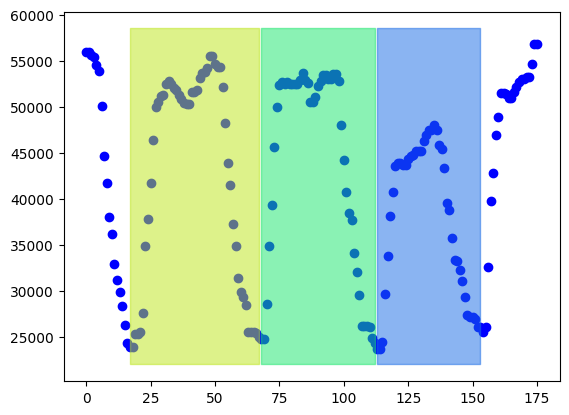

0.5387783163349104
==========       92 / 1276  -  7.210031347962382  % complete      ==========
         Current MAE =  0.09242291756135095
         Current DSC =  0.8722596822873406


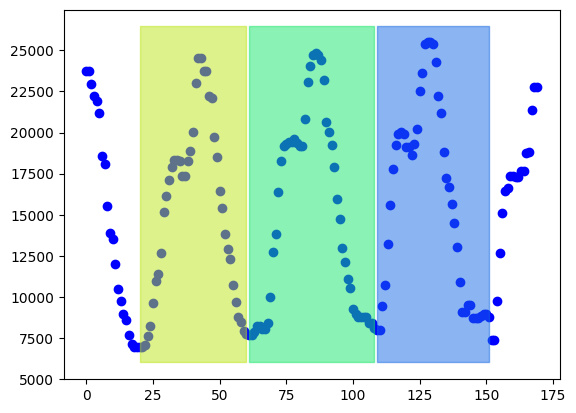

0.6980198377350854
==========       93 / 1276  -  7.2884012539184955  % complete      ==========
         Current MAE =  0.0920585443621524
         Current DSC =  0.8727895079120513


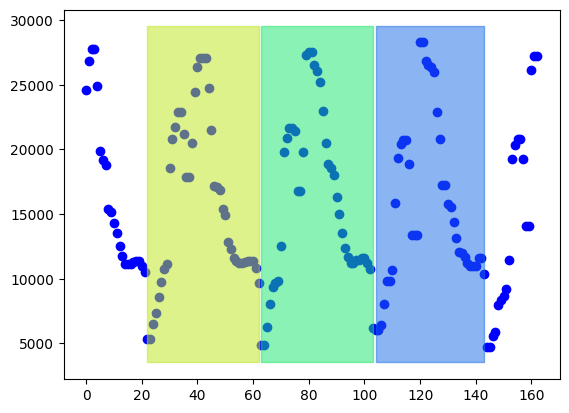

0.8045551253610218
==========       94 / 1276  -  7.366771159874608  % complete      ==========
         Current MAE =  0.0928560459019252
         Current DSC =  0.8730474044667914


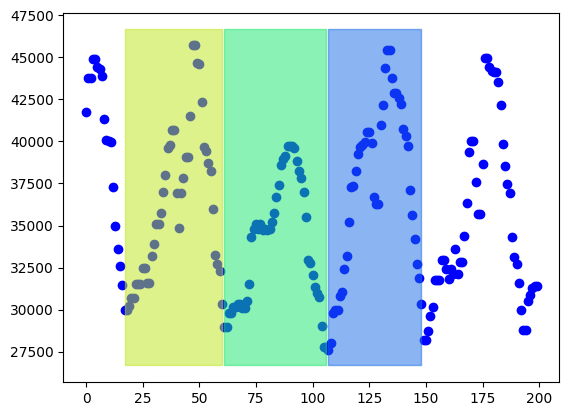

0.34572377902011686
==========       95 / 1276  -  7.445141065830721  % complete      ==========
         Current MAE =  0.09214032522658681
         Current DSC =  0.8737189826212431


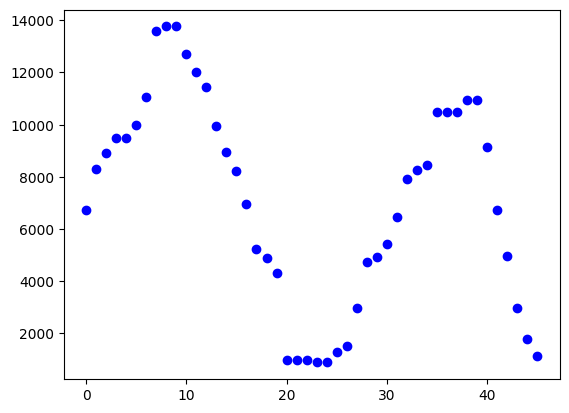

nan
==========       96 / 1276  -  7.523510971786834  % complete      ==========
         Current MAE =  0.09214032522658681
         Current DSC =  0.8702227616061767


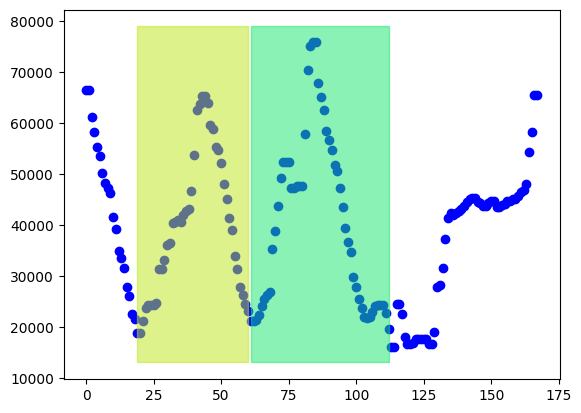

0.7158570047374408
==========       97 / 1276  -  7.601880877742946  % complete      ==========
         Current MAE =  0.09290221265828001
         Current DSC =  0.870988676842955


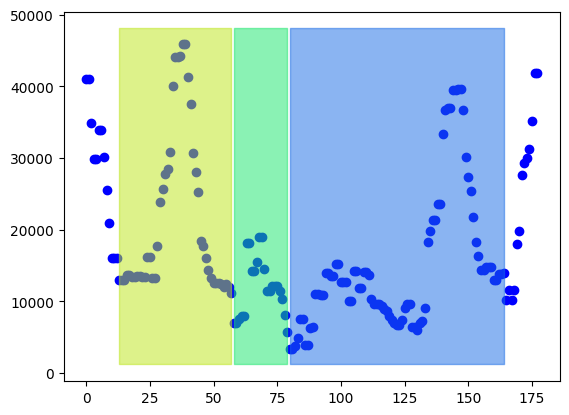

0.7618281007101775
==========       98 / 1276  -  7.6802507836990594  % complete      ==========
         Current MAE =  0.09382503228590396
         Current DSC =  0.8713097773036178


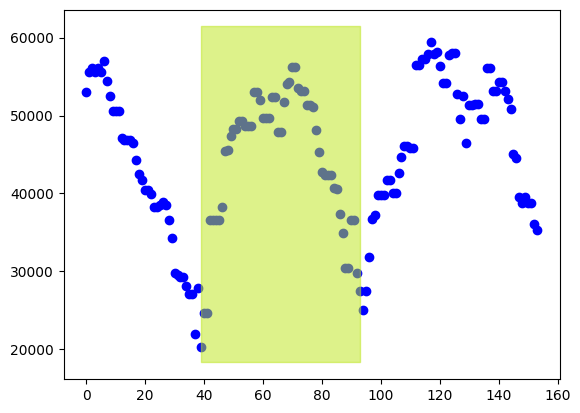

0.639755659263271
==========       99 / 1276  -  7.758620689655173  % complete      ==========
         Current MAE =  0.09652403813412425
         Current DSC =  0.8716993187413071


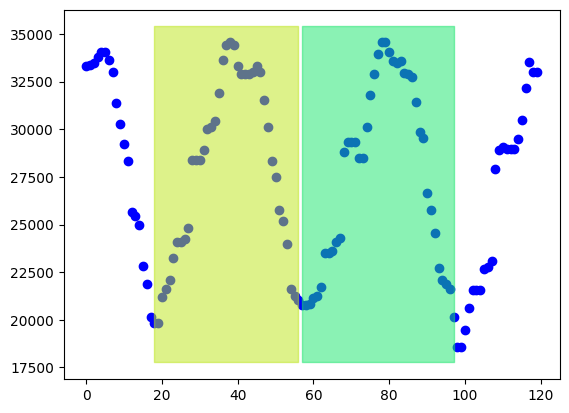

0.4127535523788657
==========       100 / 1276  -  7.836990595611285  % complete      ==========
         Current MAE =  0.09631385830133864
         Current DSC =  0.8723056644201279


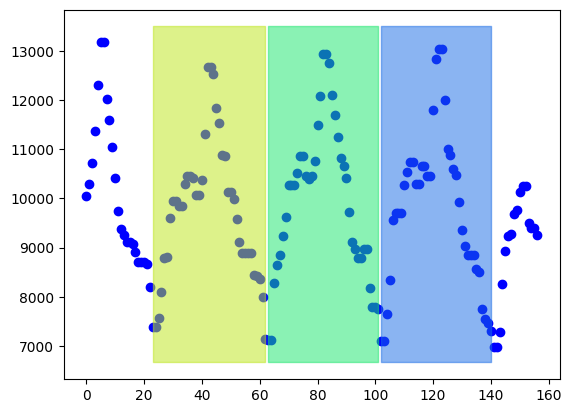

0.4407138300807938
==========       101 / 1276  -  7.915360501567398  % complete      ==========
         Current MAE =  0.09675049656212517
         Current DSC =  0.8727229160837607


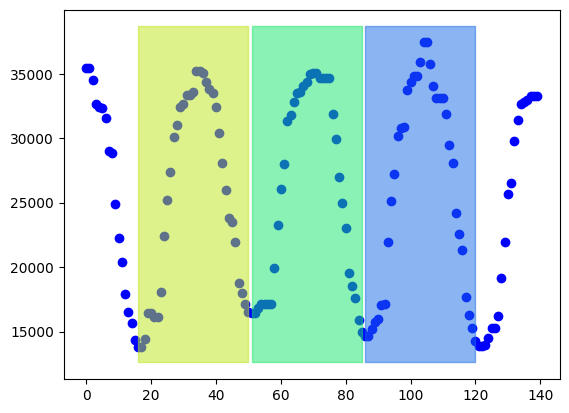

0.5885232402818347
==========       102 / 1276  -  7.993730407523511  % complete      ==========
         Current MAE =  0.09605198982432225
         Current DSC =  0.8734109577010659


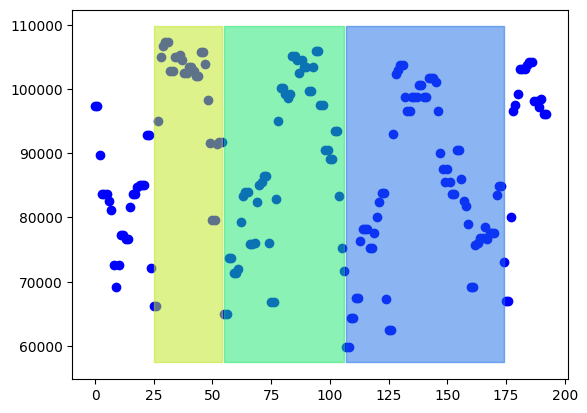

0.39769044734954767
==========       103 / 1276  -  8.072100313479623  % complete      ==========
         Current MAE =  0.09667599961764133
         Current DSC =  0.8737880483414363


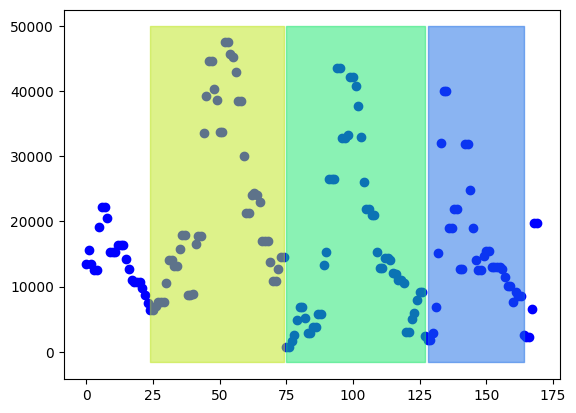

0.934717760885665
==========       104 / 1276  -  8.150470219435737  % complete      ==========
         Current MAE =  0.09894327777321019
         Current DSC =  0.8732504025101662


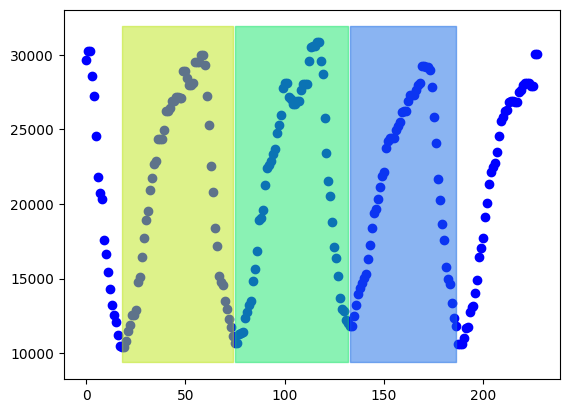

0.6338718472209465
==========       105 / 1276  -  8.22884012539185  % complete      ==========
         Current MAE =  0.09915136160668335
         Current DSC =  0.8733711202939352


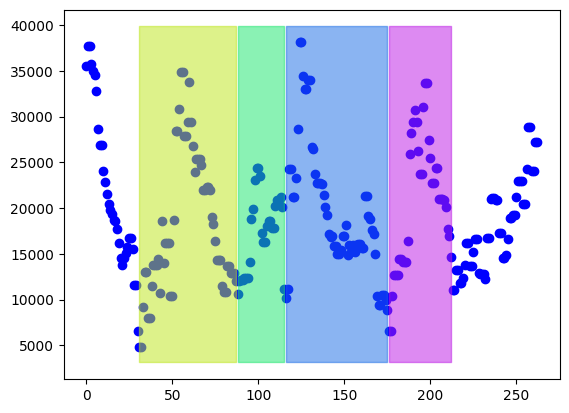

0.7465871771841393
==========       106 / 1276  -  8.307210031347962  % complete      ==========
         Current MAE =  0.09889321180358196
         Current DSC =  0.8733370765200201


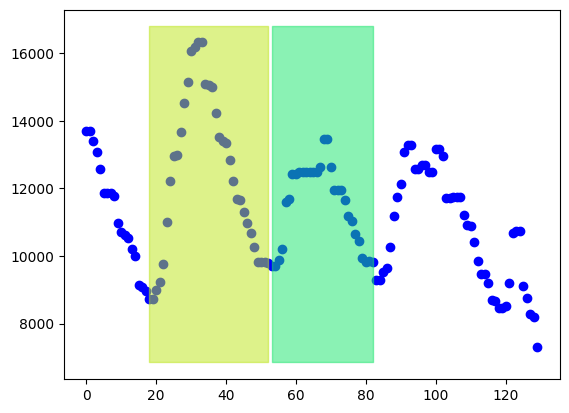

0.372685508173657
==========       107 / 1276  -  8.385579937304076  % complete      ==========
         Current MAE =  0.0982144453352273
         Current DSC =  0.8737999256526199


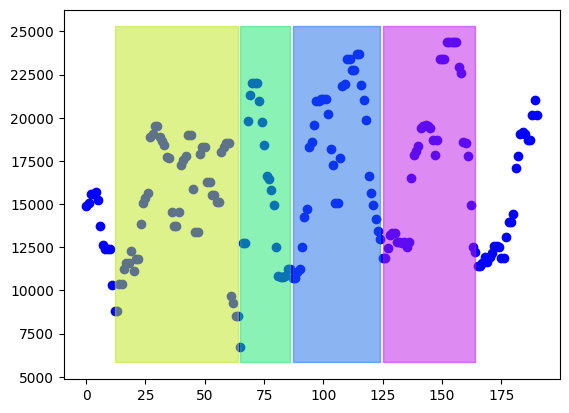

0.5803278669600023
==========       108 / 1276  -  8.463949843260188  % complete      ==========
         Current MAE =  0.0984982787411214
         Current DSC =  0.8743026113068616


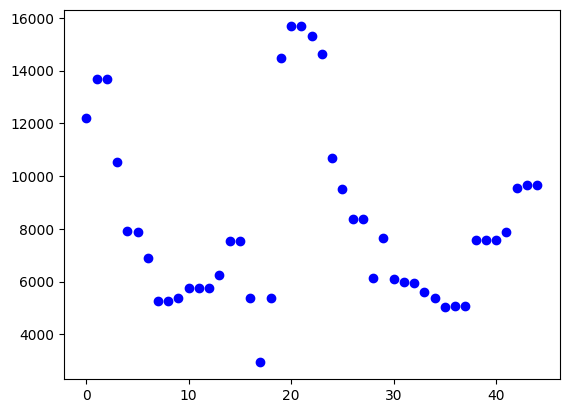

nan
==========       109 / 1276  -  8.5423197492163  % complete      ==========
         Current MAE =  0.0984982787411214
         Current DSC =  0.8745750965328392


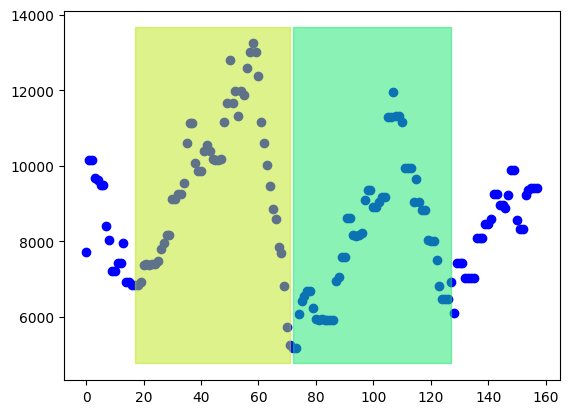

0.5685241382298614
==========       110 / 1276  -  8.620689655172415  % complete      ==========
         Current MAE =  0.09763581506475708
         Current DSC =  0.8748726758089933


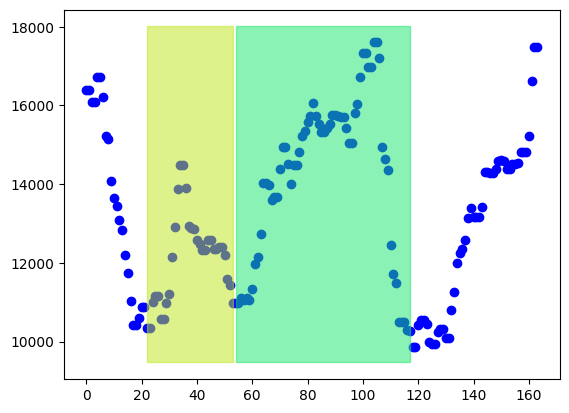

0.35041674304589276
==========       111 / 1276  -  8.699059561128527  % complete      ==========
         Current MAE =  0.09819943957021403
         Current DSC =  0.8753404810621932


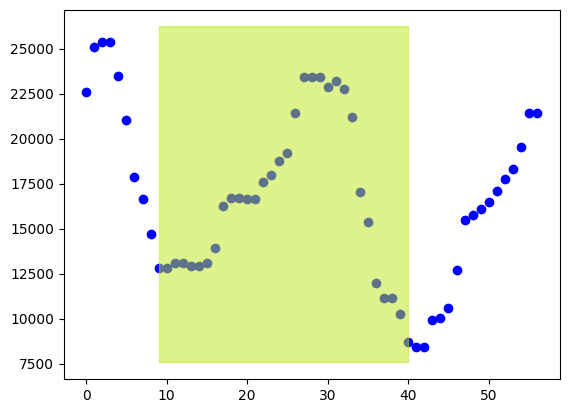

0.5622260689903142
==========       112 / 1276  -  8.77742946708464  % complete      ==========
         Current MAE =  0.09868141642929175
         Current DSC =  0.8741653561592102


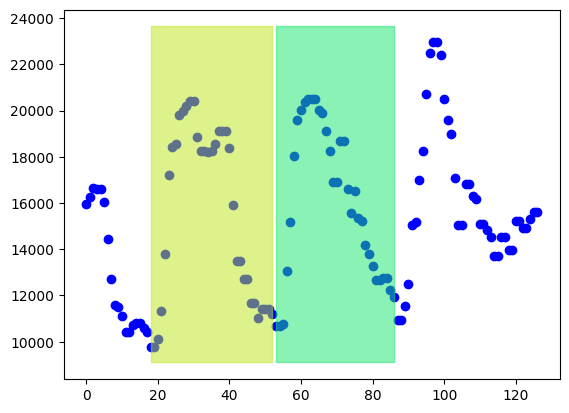

0.501122010296366
==========       113 / 1276  -  8.855799373040753  % complete      ==========
         Current MAE =  0.09780215386178576
         Current DSC =  0.874516716045616


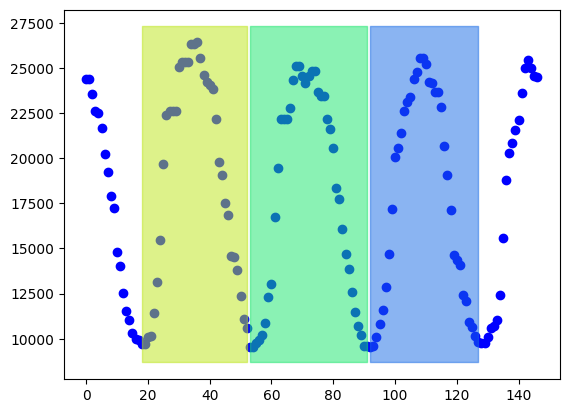

0.6260961907340367
==========       114 / 1276  -  8.934169278996865  % complete      ==========
         Current MAE =  0.09696680582398555
         Current DSC =  0.8747321304522062


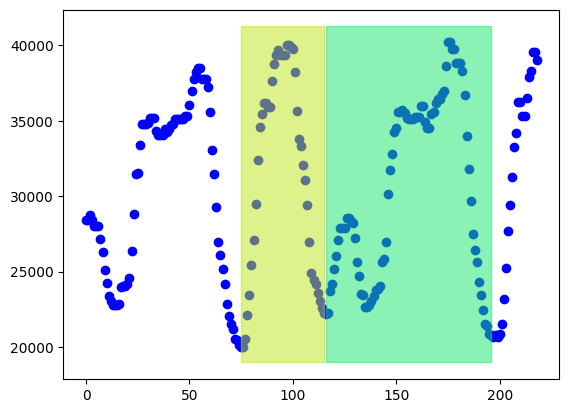

0.4909582866276452
==========       115 / 1276  -  9.012539184952978  % complete      ==========
         Current MAE =  0.09643841126151824
         Current DSC =  0.8752299889274265


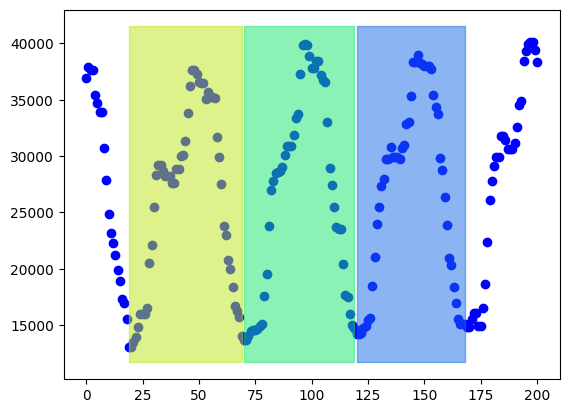

0.6487004620878523
==========       116 / 1276  -  9.090909090909092  % complete      ==========
         Current MAE =  0.09603345592989287
         Current DSC =  0.8755091135871822


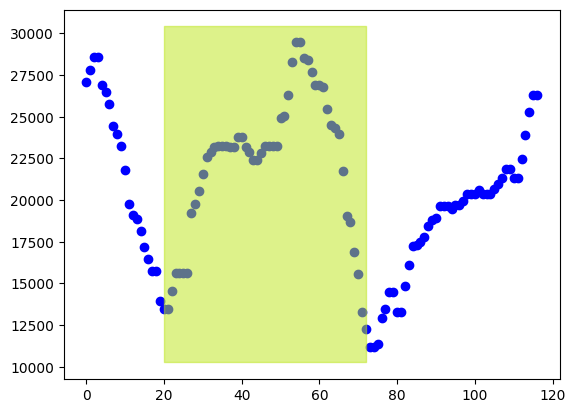

0.5503819343219485
==========       117 / 1276  -  9.169278996865204  % complete      ==========
         Current MAE =  0.09592460293557849
         Current DSC =  0.8756864035231435


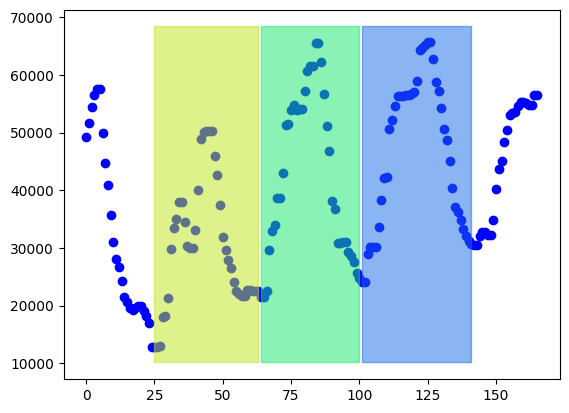

0.6827739400550857
==========       118 / 1276  -  9.247648902821316  % complete      ==========
         Current MAE =  0.09605570130705246
         Current DSC =  0.8760472773495367


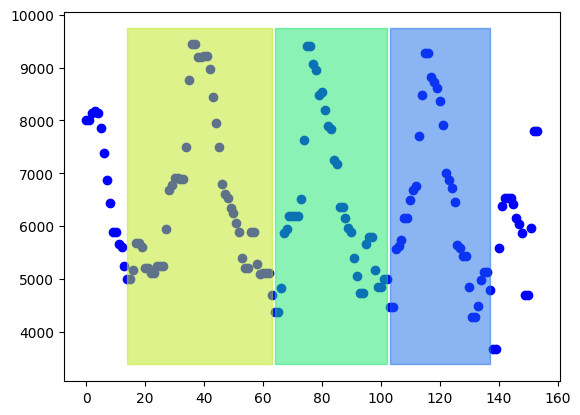

0.5144108602877453
==========       119 / 1276  -  9.32601880877743  % complete      ==========
         Current MAE =  0.09555013630278697
         Current DSC =  0.8760048376411951


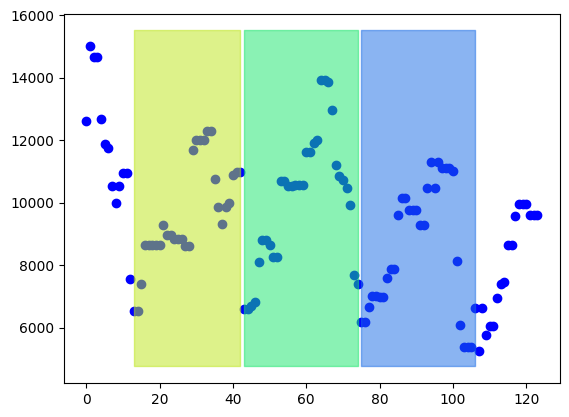

0.5056852522935068
==========       120 / 1276  -  9.404388714733543  % complete      ==========
         Current MAE =  0.09612305728903243
         Current DSC =  0.8749349370598793


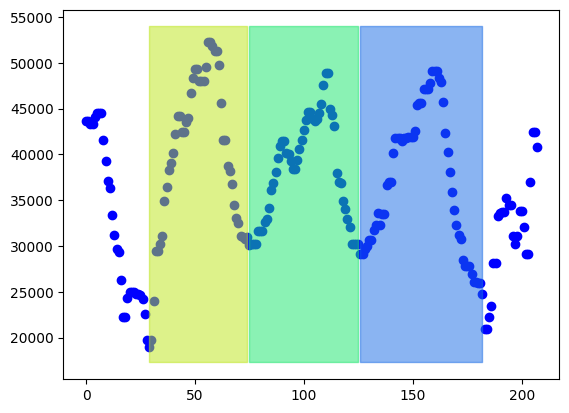

0.4980137248433499
==========       121 / 1276  -  9.482758620689655  % complete      ==========
         Current MAE =  0.09694805304203513
         Current DSC =  0.875531153738006


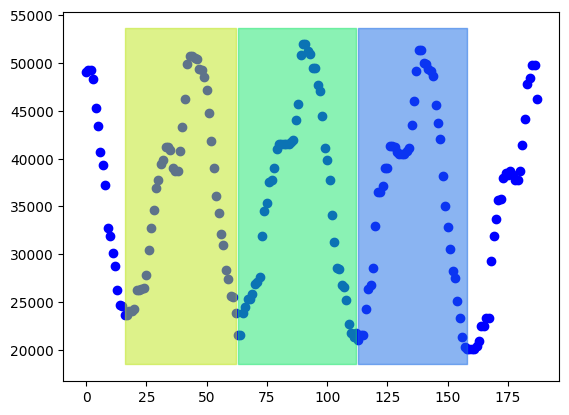

0.5754999355546069
==========       122 / 1276  -  9.561128526645769  % complete      ==========
         Current MAE =  0.09648945586475242
         Current DSC =  0.8760210378248183


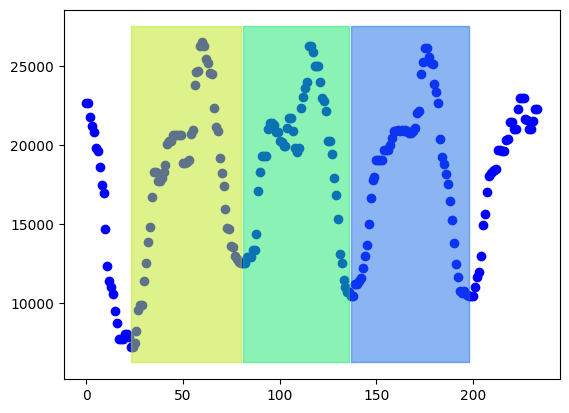

0.6402420128252571
==========       123 / 1276  -  9.639498432601881  % complete      ==========
         Current MAE =  0.09638000876525661
         Current DSC =  0.8761982079443893


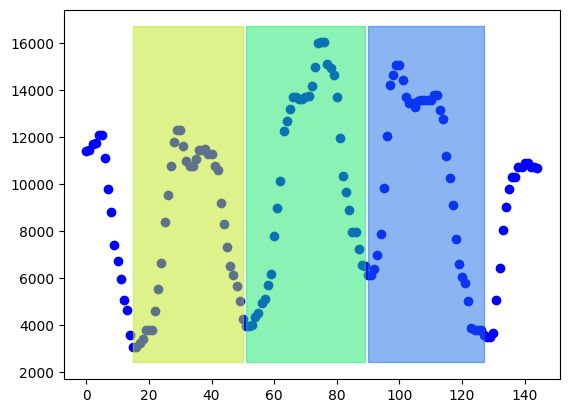

0.7512266462037283
==========       124 / 1276  -  9.717868338557993  % complete      ==========
         Current MAE =  0.09637710442673157
         Current DSC =  0.8763920376377721


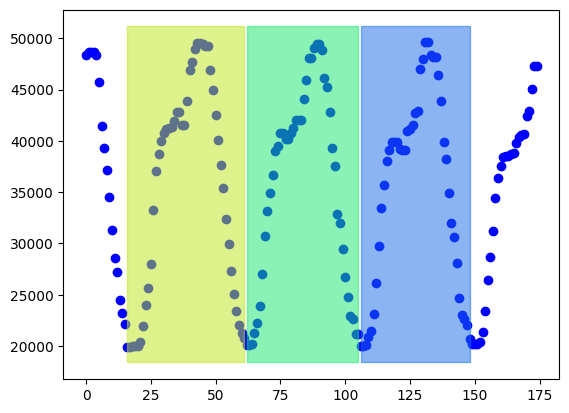

0.596046218957925
==========       125 / 1276  -  9.796238244514107  % complete      ==========
         Current MAE =  0.09574733178108562
         Current DSC =  0.8768018088340759


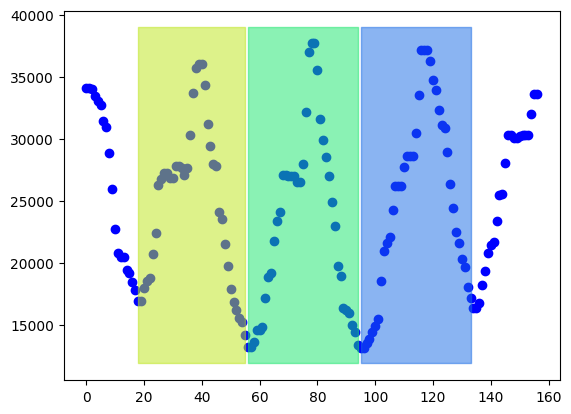

0.6248641005146266
==========       126 / 1276  -  9.87460815047022  % complete      ==========
         Current MAE =  0.09506458096892535
         Current DSC =  0.8767109030768985


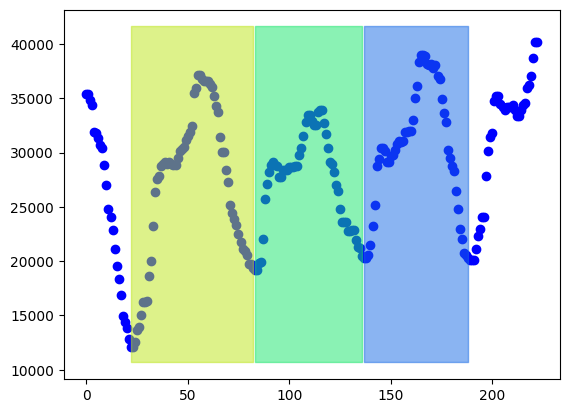

0.5289669526289099
==========       127 / 1276  -  9.952978056426332  % complete      ==========
         Current MAE =  0.09442434829555571
         Current DSC =  0.8771130653816884


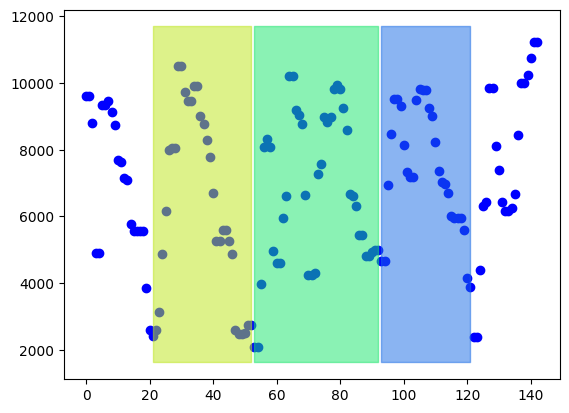

0.7139699745179947
==========       128 / 1276  -  10.031347962382446  % complete      ==========
         Current MAE =  0.09432497758373523
         Current DSC =  0.8765752897597849


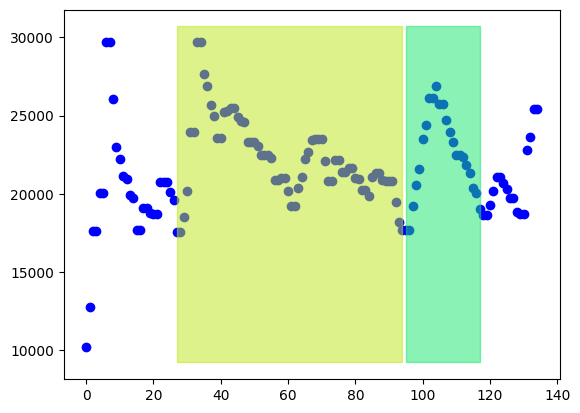

0.37614651193548504
==========       129 / 1276  -  10.109717868338558  % complete      ==========
         Current MAE =  0.09436889064605071
         Current DSC =  0.8752192836399226


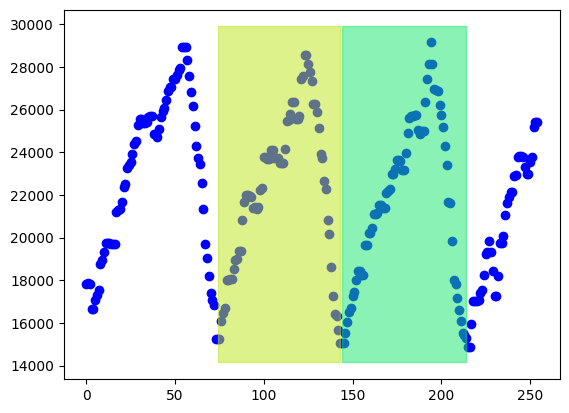

0.4749954438219862
==========       130 / 1276  -  10.18808777429467  % complete      ==========
         Current MAE =  0.09469291562460139
         Current DSC =  0.8757220171965086


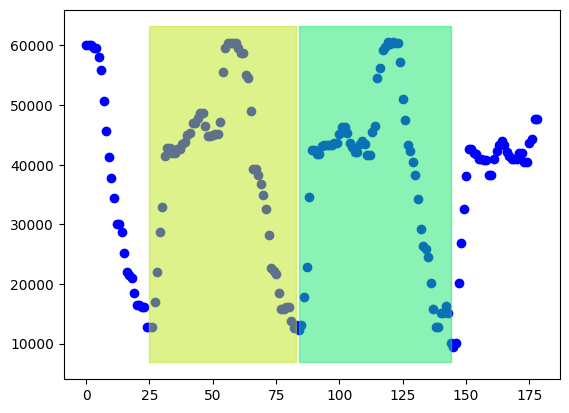

0.7940599910984725
==========       131 / 1276  -  10.266457680250785  % complete      ==========
         Current MAE =  0.09533063229158475
         Current DSC =  0.8756971263703499


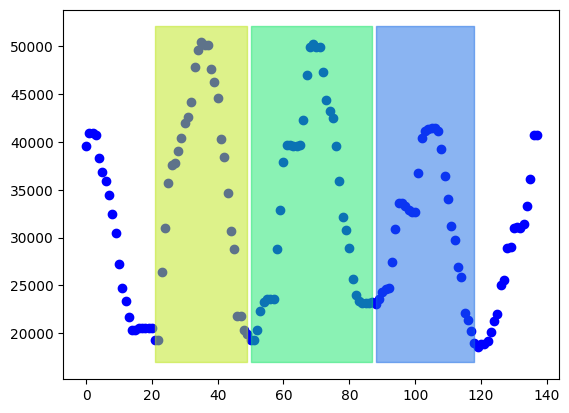

0.5826023570813764
==========       132 / 1276  -  10.344827586206897  % complete      ==========
         Current MAE =  0.09485643912949013
         Current DSC =  0.876194254918532


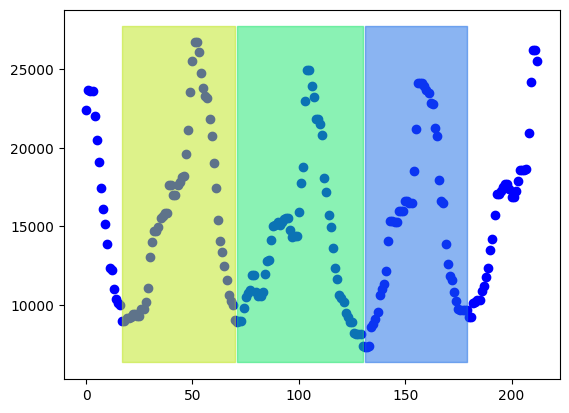

0.6784722506340399
==========       133 / 1276  -  10.423197492163009  % complete      ==========
         Current MAE =  0.0945864219887559
         Current DSC =  0.8762432659479013


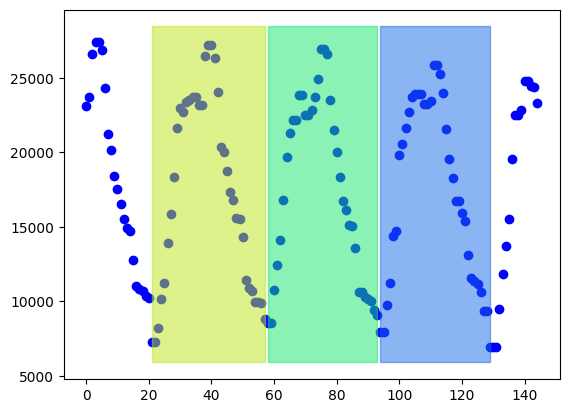

0.702766817704718
==========       134 / 1276  -  10.501567398119123  % complete      ==========
         Current MAE =  0.09438445053238918
         Current DSC =  0.8766271307397244


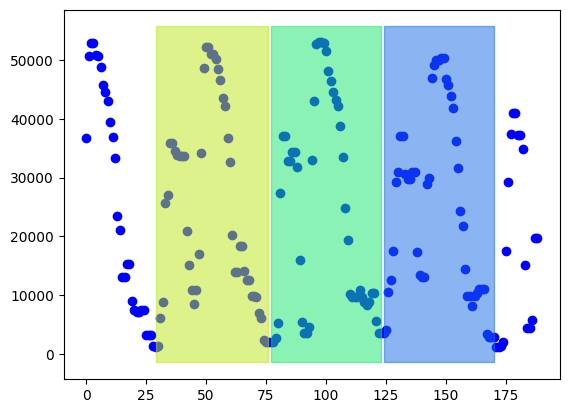

0.9626113404023419
==========       135 / 1276  -  10.579937304075235  % complete      ==========
         Current MAE =  0.09602828647913125
         Current DSC =  0.875516332078863


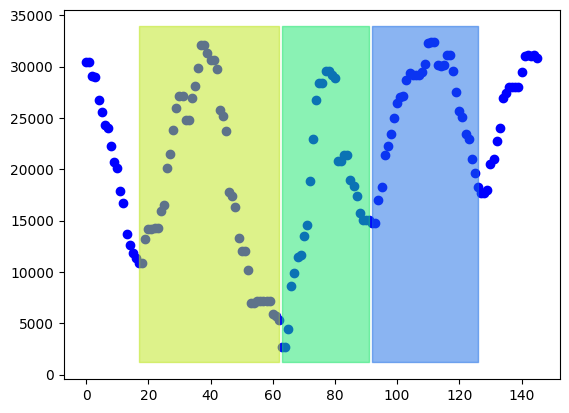

0.7587547973877906
==========       136 / 1276  -  10.658307210031348  % complete      ==========
         Current MAE =  0.09838120136867004
         Current DSC =  0.8760614189154962


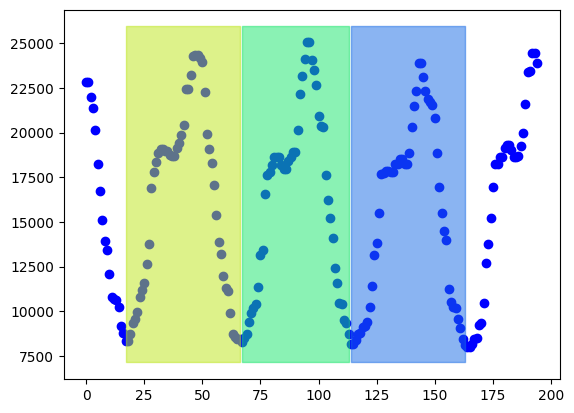

0.6623069686967239
==========       137 / 1276  -  10.736677115987462  % complete      ==========
         Current MAE =  0.09818494080768536
         Current DSC =  0.8764072234613182


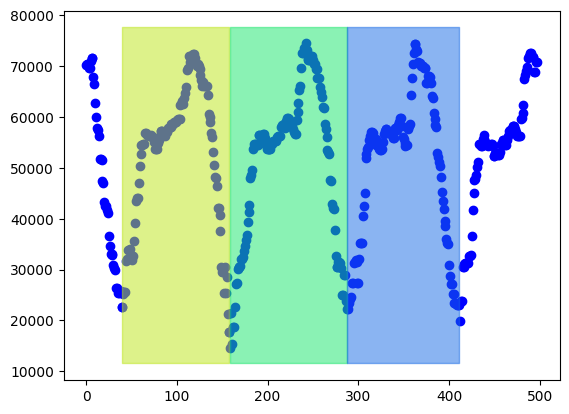

0.7534285235716763
==========       138 / 1276  -  10.815047021943574  % complete      ==========
         Current MAE =  0.09849103967927049
         Current DSC =  0.8765627823878026


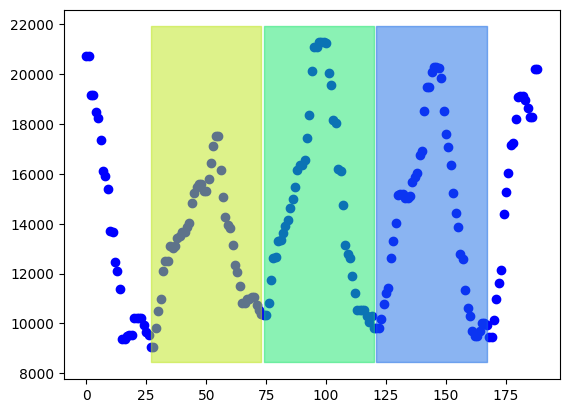

0.5145102241158738
==========       139 / 1276  -  10.893416927899686  % complete      ==========
         Current MAE =  0.09833302145062973
         Current DSC =  0.8770371915625154


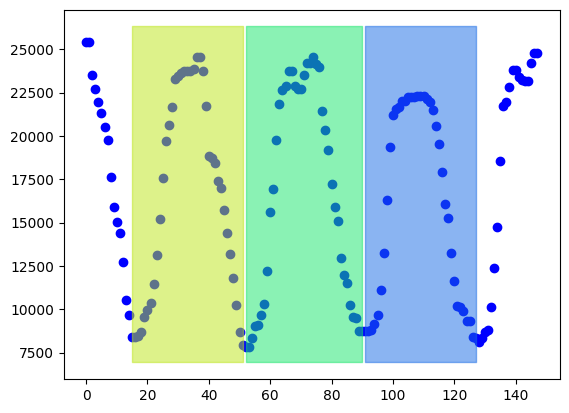

0.6537073652964628
==========       140 / 1276  -  10.9717868338558  % complete      ==========
         Current MAE =  0.09793626424220515
         Current DSC =  0.8772832802363805


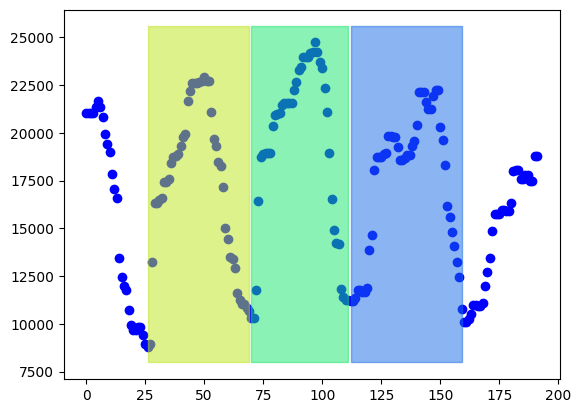

0.5653295549045366
==========       141 / 1276  -  11.050156739811912  % complete      ==========
         Current MAE =  0.09798770947743943
         Current DSC =  0.8775210321372282


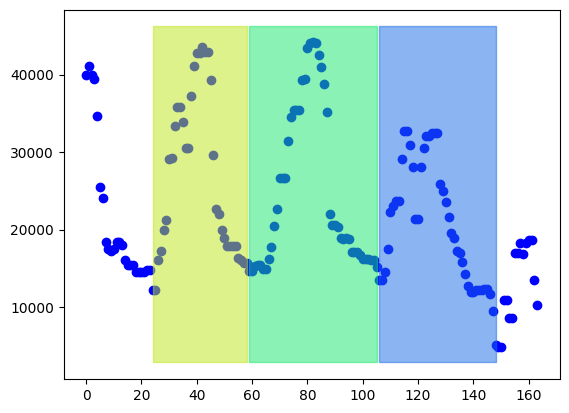

0.6993103417293821
==========       142 / 1276  -  11.128526645768025  % complete      ==========
         Current MAE =  0.0976537946475973
         Current DSC =  0.8776294060156379


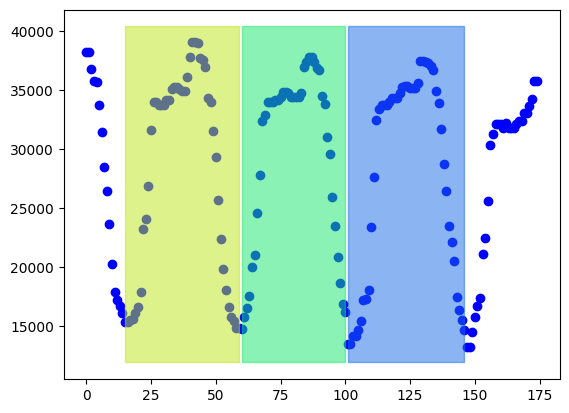

0.6215394582241979
==========       143 / 1276  -  11.206896551724139  % complete      ==========
         Current MAE =  0.09697409167100159
         Current DSC =  0.8780044508980704


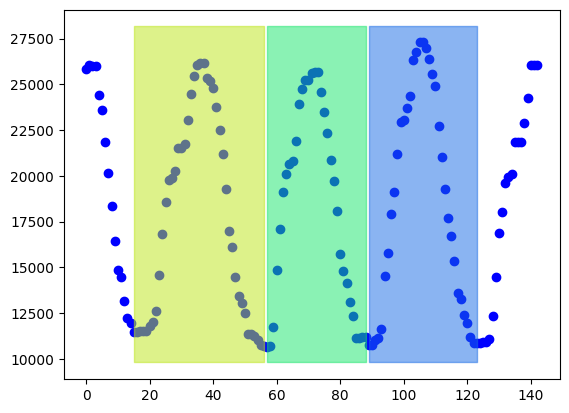

0.5939330502313079
==========       144 / 1276  -  11.285266457680251  % complete      ==========
         Current MAE =  0.09646023324474406
         Current DSC =  0.8785368253787359


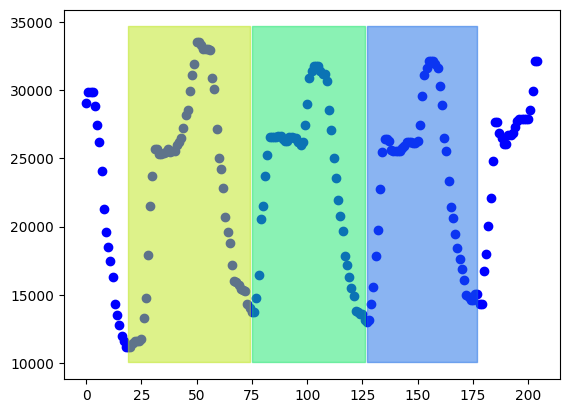

0.6124609990504312
==========       145 / 1276  -  11.363636363636363  % complete      ==========
         Current MAE =  0.09584333132787663
         Current DSC =  0.8789131419412021


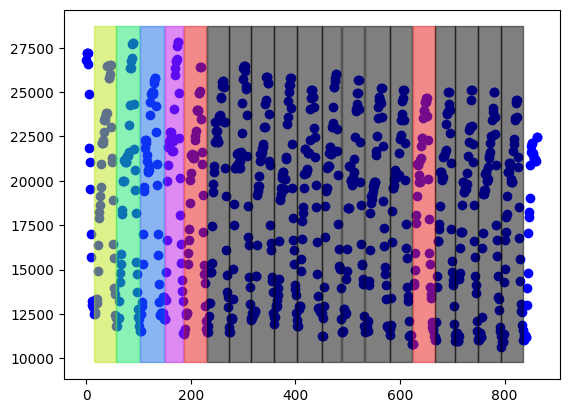

0.5555624188650519
==========       146 / 1276  -  11.442006269592477  % complete      ==========
         Current MAE =  0.09522190437617783
         Current DSC =  0.8790287906176424


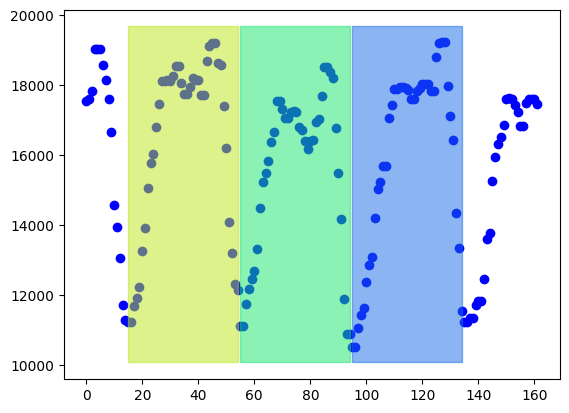

0.4260949332551837
==========       147 / 1276  -  11.52037617554859  % complete      ==========
         Current MAE =  0.09507509295096005
         Current DSC =  0.879127989009935


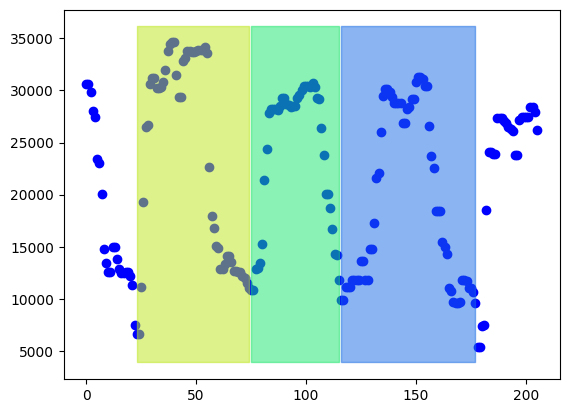

0.7171295204163938
==========       148 / 1276  -  11.598746081504702  % complete      ==========
         Current MAE =  0.09514441956589408
         Current DSC =  0.8788099595018335


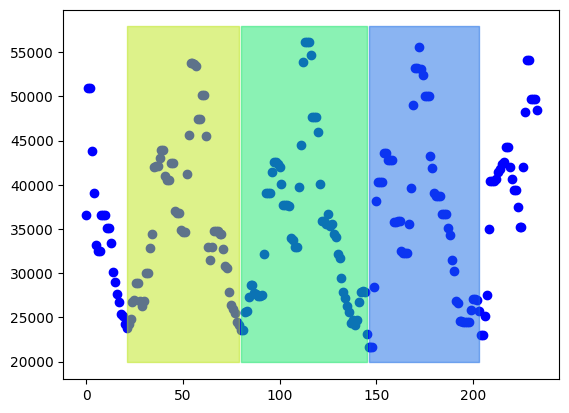

0.5829564349072349
==========       149 / 1276  -  11.677115987460816  % complete      ==========
         Current MAE =  0.09543584445179366
         Current DSC =  0.8789698337548532


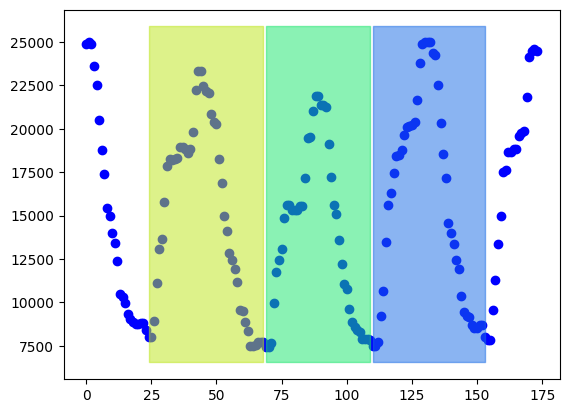

0.6804571649126055
==========       150 / 1276  -  11.755485893416928  % complete      ==========
         Current MAE =  0.09534203256853388
         Current DSC =  0.8794306766986847


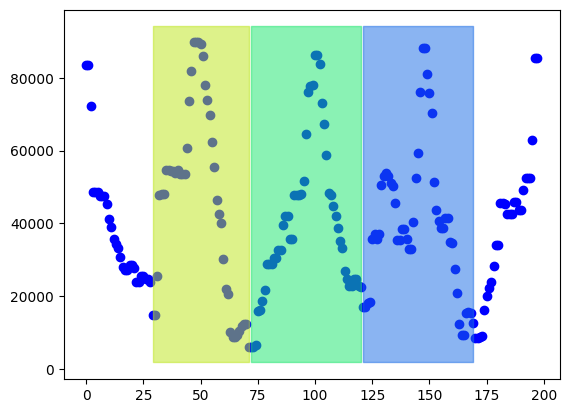

0.9103222714668204
==========       151 / 1276  -  11.83385579937304  % complete      ==========
         Current MAE =  0.09666296990500878
         Current DSC =  0.8795984446607679


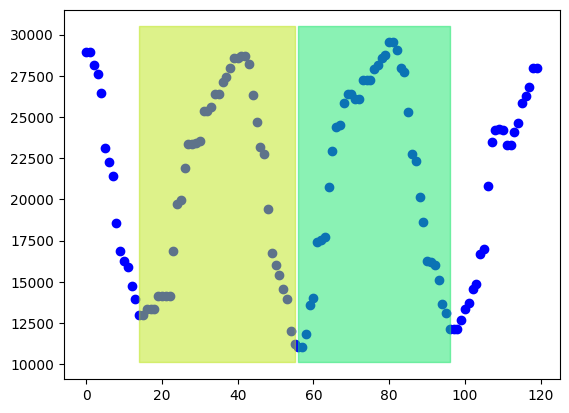

0.6048111745950018
==========       152 / 1276  -  11.912225705329154  % complete      ==========
         Current MAE =  0.09646121040500871
         Current DSC =  0.8794050546068894


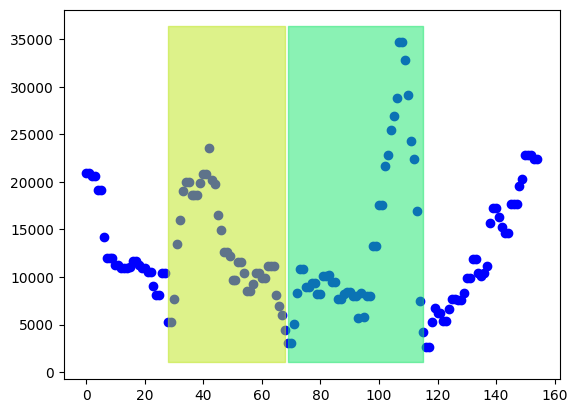

0.843814323791465
==========       153 / 1276  -  11.990595611285267  % complete      ==========
         Current MAE =  0.09690305279291843
         Current DSC =  0.8790059011746076


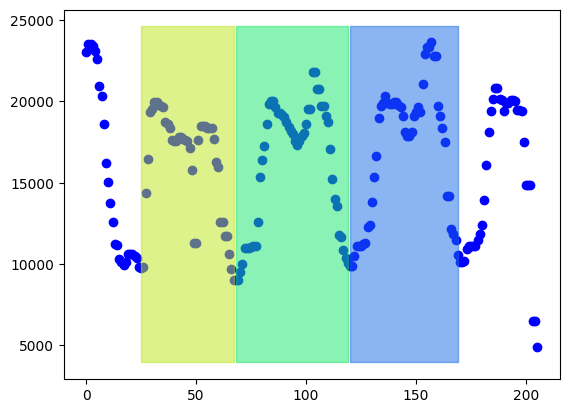

0.5609275606585388
==========       154 / 1276  -  12.068965517241379  % complete      ==========
         Current MAE =  0.09642684315615381
         Current DSC =  0.8793889044167159


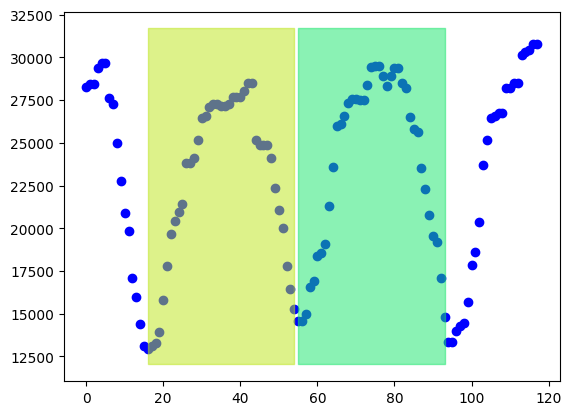

0.5260443256314933
==========       155 / 1276  -  12.147335423197493  % complete      ==========
         Current MAE =  0.0959954363786035
         Current DSC =  0.8796937965577648


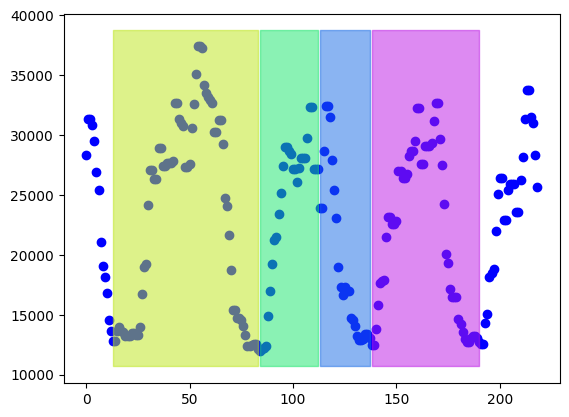

0.6298094497901502
==========       156 / 1276  -  12.225705329153605  % complete      ==========
         Current MAE =  0.09582373824861361
         Current DSC =  0.8799428446934774


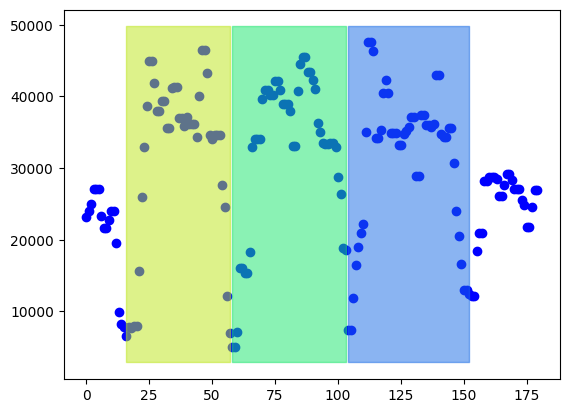

0.8648802840724504
==========       157 / 1276  -  12.304075235109718  % complete      ==========
         Current MAE =  0.0965686635039632
         Current DSC =  0.8799483415427481


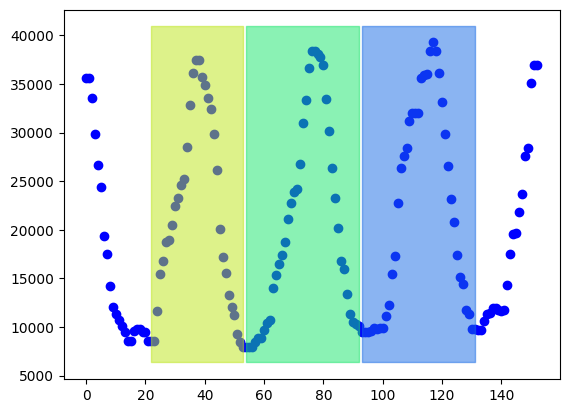

0.7756575989255462
==========       158 / 1276  -  12.382445141065832  % complete      ==========
         Current MAE =  0.09658431371636052
         Current DSC =  0.8801693199556085


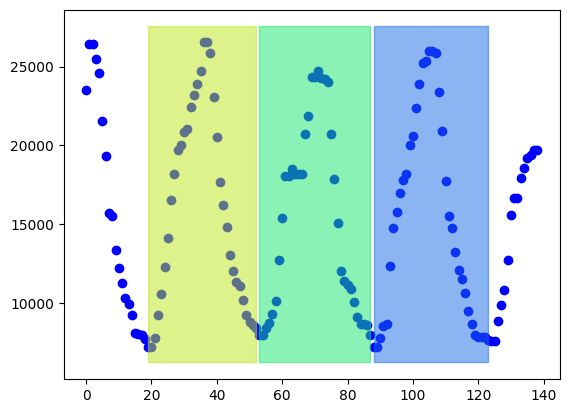

0.7105998030079016
==========       159 / 1276  -  12.460815047021944  % complete      ==========
         Current MAE =  0.0961846611964345
         Current DSC =  0.8804424153933735


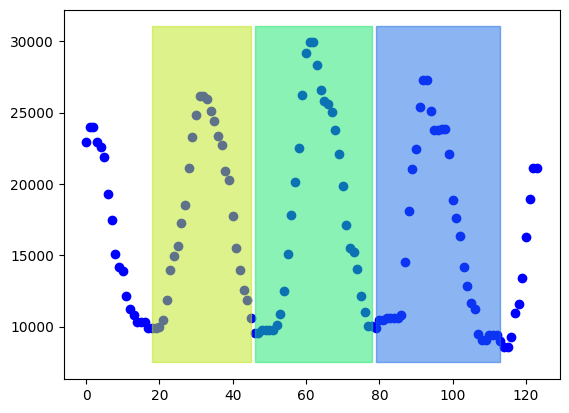

0.6566478427074328
==========       160 / 1276  -  12.539184952978056  % complete      ==========
         Current MAE =  0.09568851075319244
         Current DSC =  0.8808358453214169


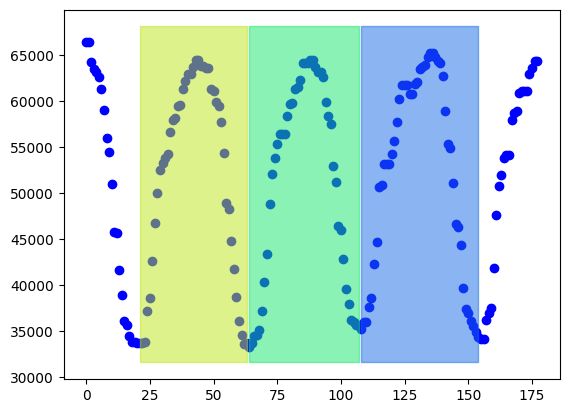

0.47610781359944426
==========       161 / 1276  -  12.617554858934168  % complete      ==========
         Current MAE =  0.09555839584020108
         Current DSC =  0.8812351226806641


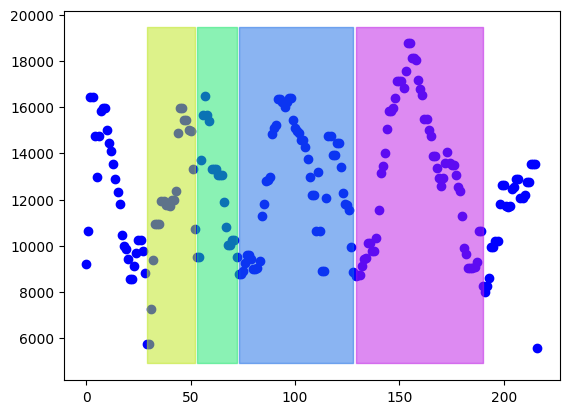

0.5163642785607185
==========       162 / 1276  -  12.695924764890282  % complete      ==========
         Current MAE =  0.09582060862572989
         Current DSC =  0.881191247039371


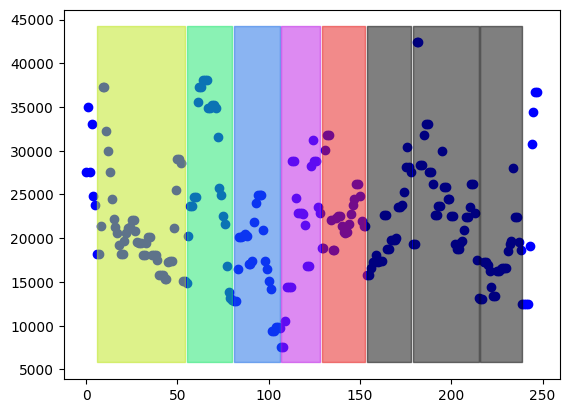

0.5803504693376972
==========       163 / 1276  -  12.774294670846395  % complete      ==========
         Current MAE =  0.09591987138845845
         Current DSC =  0.880633291291313


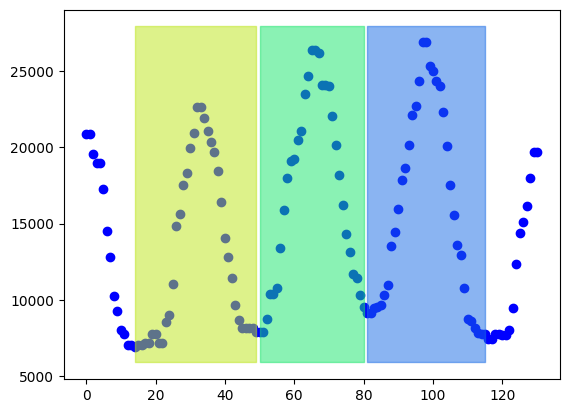

0.7029721705722481
==========       164 / 1276  -  12.852664576802507  % complete      ==========
         Current MAE =  0.09571654880699132
         Current DSC =  0.8808746926668214


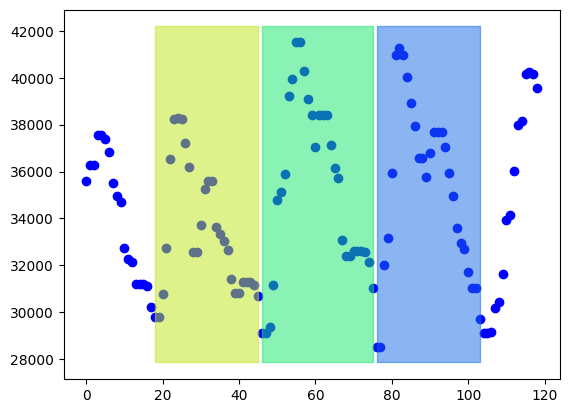

0.27664370069454036
==========       165 / 1276  -  12.931034482758621  % complete      ==========
         Current MAE =  0.0951680353093836
         Current DSC =  0.8811011596159501


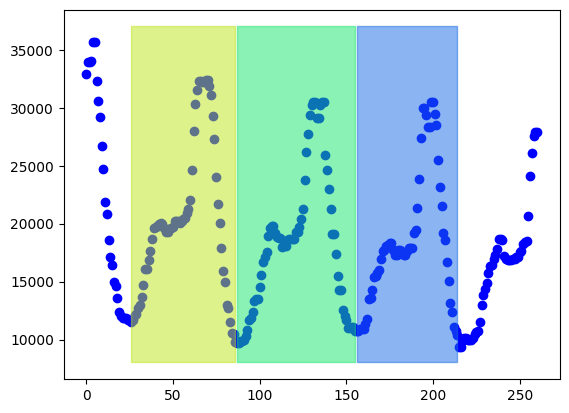

0.669836677969503
==========       166 / 1276  -  13.009404388714733  % complete      ==========
         Current MAE =  0.09483729698459906
         Current DSC =  0.8814143678510046


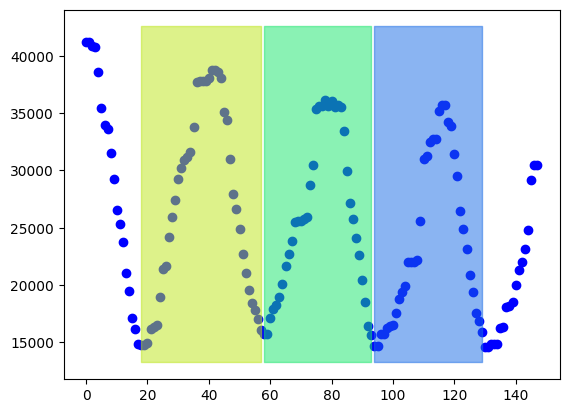

0.591601152408155
==========       167 / 1276  -  13.087774294670846  % complete      ==========
         Current MAE =  0.09450589927437685
         Current DSC =  0.8818597065474458


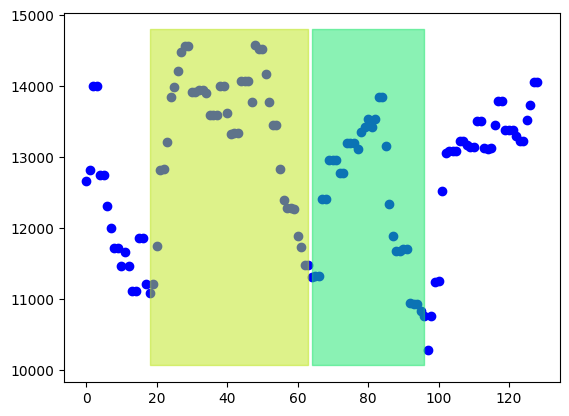

0.22914074726766082
==========       168 / 1276  -  13.16614420062696  % complete      ==========
         Current MAE =  0.09467574030039674
         Current DSC =  0.8820932223683312


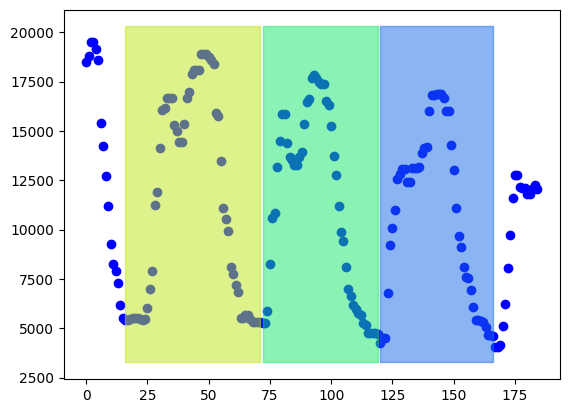

0.733292965985355
==========       169 / 1276  -  13.244514106583072  % complete      ==========
         Current MAE =  0.09456566088946276
         Current DSC =  0.8823207581537009


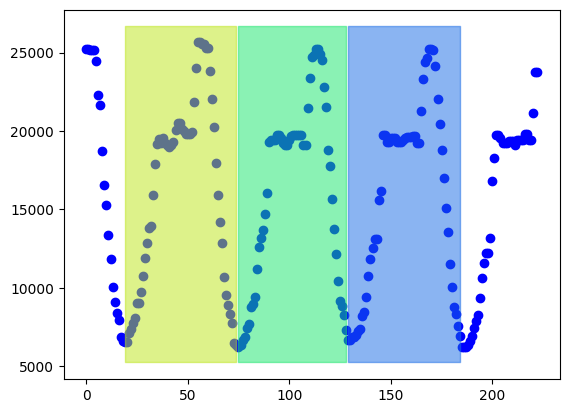

0.7456632672051925
==========       170 / 1276  -  13.322884012539184  % complete      ==========
         Current MAE =  0.09475020120692222
         Current DSC =  0.8825742903877707


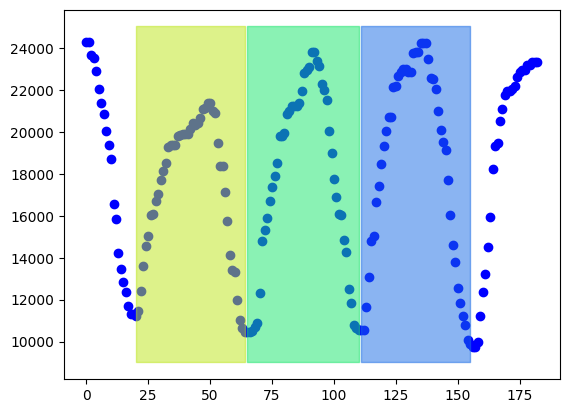

0.5488375119594371
==========       171 / 1276  -  13.401253918495298  % complete      ==========
         Current MAE =  0.09463174578390816
         Current DSC =  0.8826866508924474


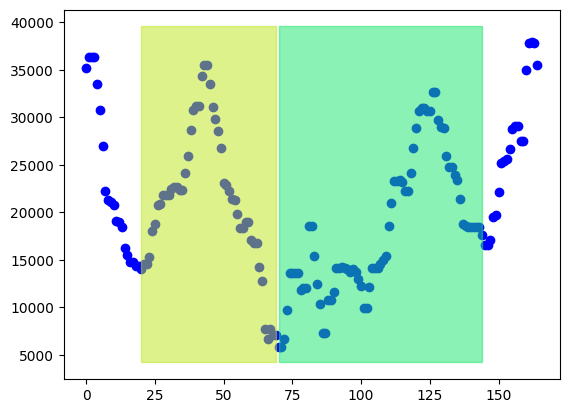

0.8164143353096952
==========       172 / 1276  -  13.47962382445141  % complete      ==========
         Current MAE =  0.09542547670181224
         Current DSC =  0.8826762572970501


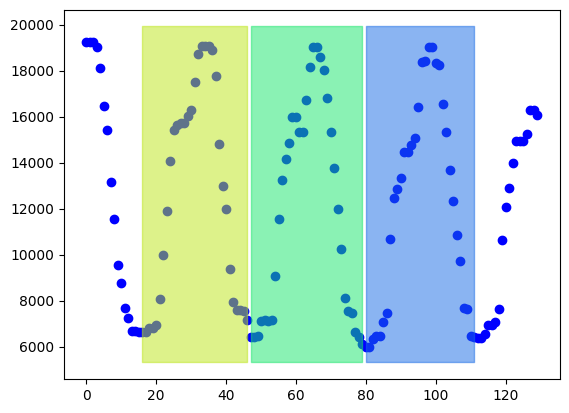

0.667709947376976
==========       173 / 1276  -  13.557993730407523  % complete      ==========
         Current MAE =  0.09499476961107789
         Current DSC =  0.8829135705280855


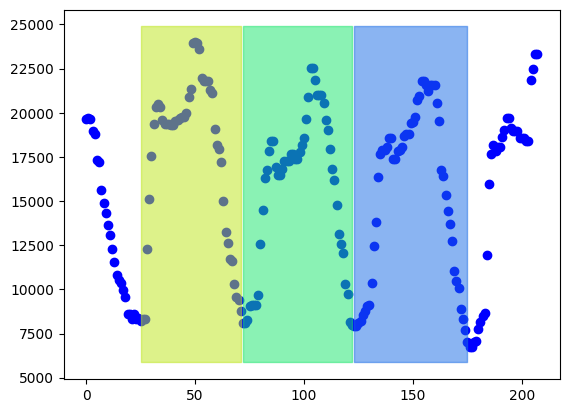

0.6491198819605534
==========       174 / 1276  -  13.636363636363637  % complete      ==========
         Current MAE =  0.0945843143142912
         Current DSC =  0.8830939452538545


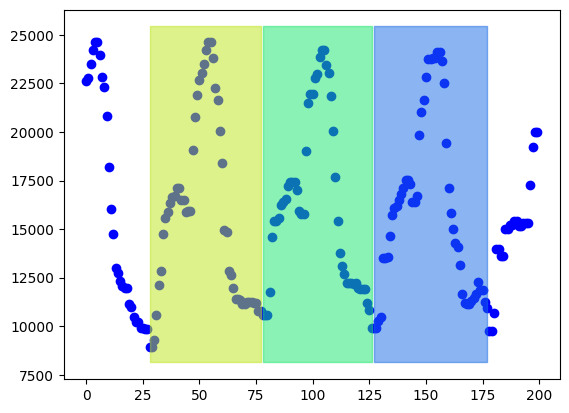

0.5972762350088789
==========       175 / 1276  -  13.714733542319749  % complete      ==========
         Current MAE =  0.09487241150612022
         Current DSC =  0.883345537185669


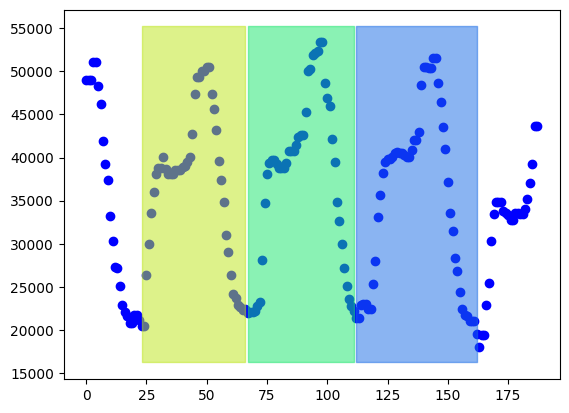

0.5920521682987653
==========       176 / 1276  -  13.793103448275861  % complete      ==========
         Current MAE =  0.09449809841128003
         Current DSC =  0.8835617212409322


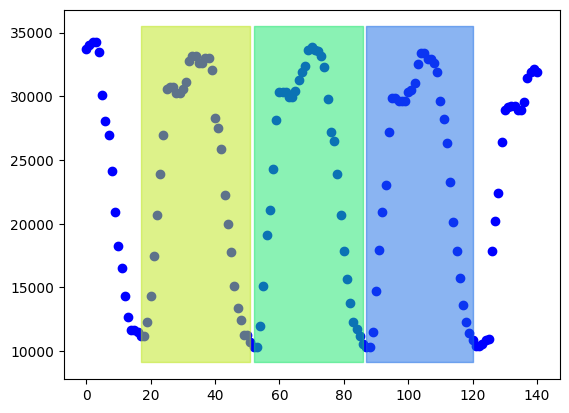

0.6830435619608571
==========       177 / 1276  -  13.871473354231975  % complete      ==========
         Current MAE =  0.09421282179892126
         Current DSC =  0.883956880555988


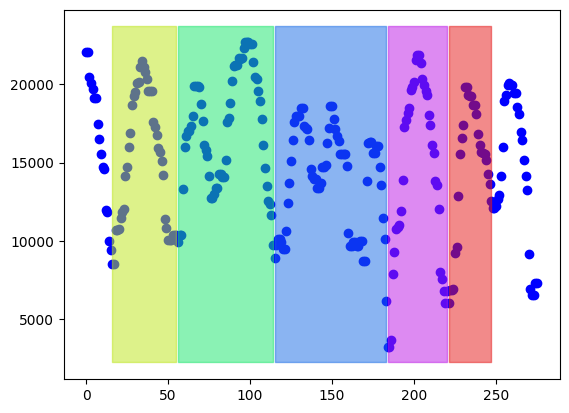

0.648802786954772
==========       178 / 1276  -  13.949843260188088  % complete      ==========
         Current MAE =  0.0947959793472404
         Current DSC =  0.8835304362720318


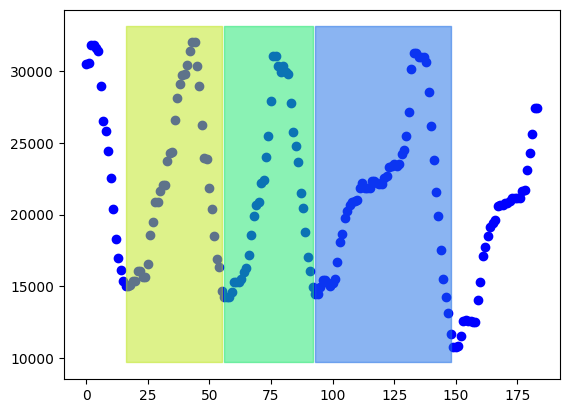

0.5509891594441895
==========       179 / 1276  -  14.0282131661442  % complete      ==========
         Current MAE =  0.09431682869388001
         Current DSC =  0.8837723565501208


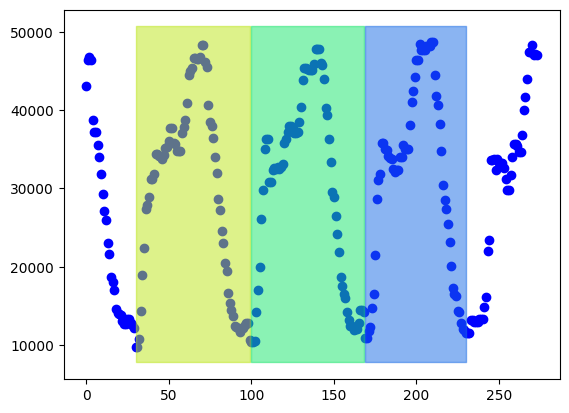

0.7865285642272509
==========       180 / 1276  -  14.106583072100314  % complete      ==========
         Current MAE =  0.09427154825904029
         Current DSC =  0.8839755124515958


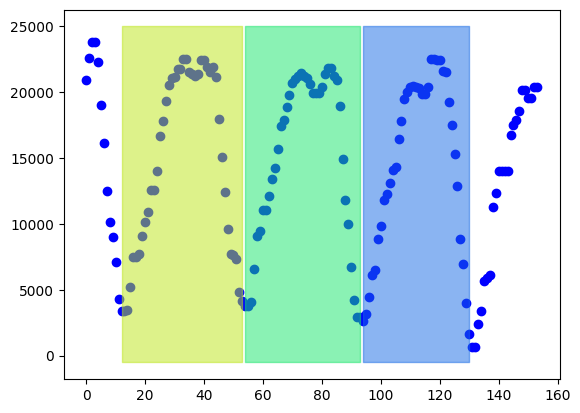

0.8655410294893654
==========       181 / 1276  -  14.184952978056426  % complete      ==========
         Current MAE =  0.09540199358786235
         Current DSC =  0.8835870877155283


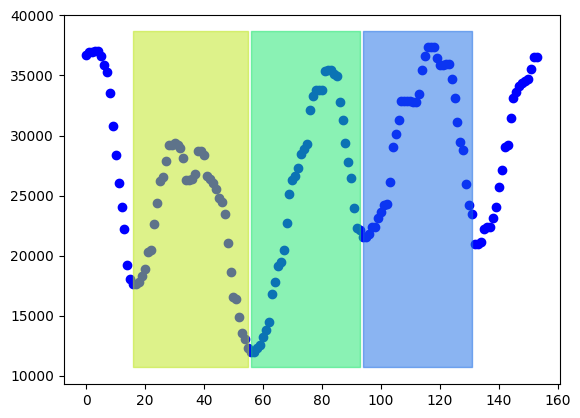

0.5476165571857442
==========       182 / 1276  -  14.263322884012538  % complete      ==========
         Current MAE =  0.09550004142360471
         Current DSC =  0.8838365359620733


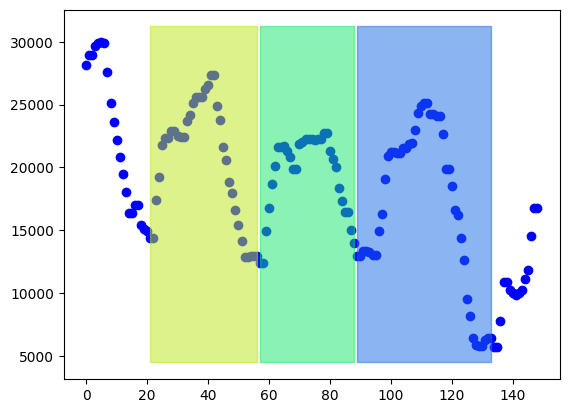

0.5844546032528958
==========       183 / 1276  -  14.341692789968652  % complete      ==========
         Current MAE =  0.09508007066765632
         Current DSC =  0.8840948115281069


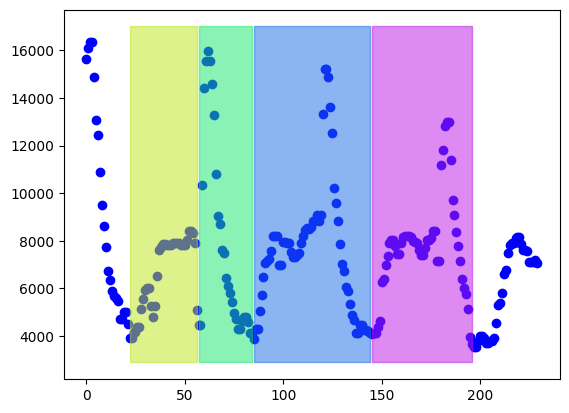

0.6793579120103387
==========       184 / 1276  -  14.420062695924765  % complete      ==========
         Current MAE =  0.09457045052203578
         Current DSC =  0.8842687921031661


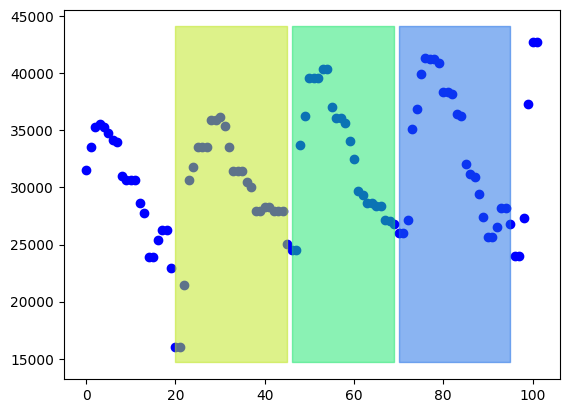

0.442213539144543
==========       185 / 1276  -  14.498432601880877  % complete      ==========
         Current MAE =  0.09500123728479681
         Current DSC =  0.8844997554212003


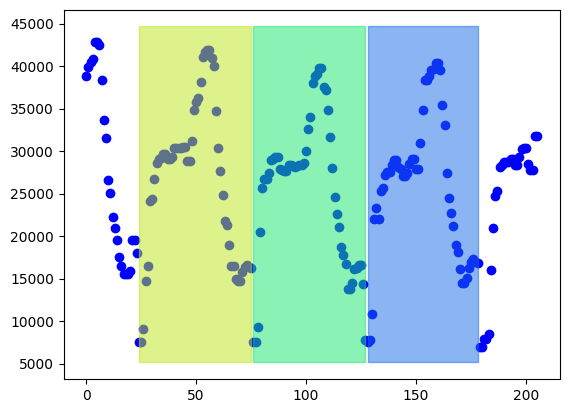

0.8142354331178083
==========       186 / 1276  -  14.576802507836991  % complete      ==========
         Current MAE =  0.0957618165122996
         Current DSC =  0.8847386035867917


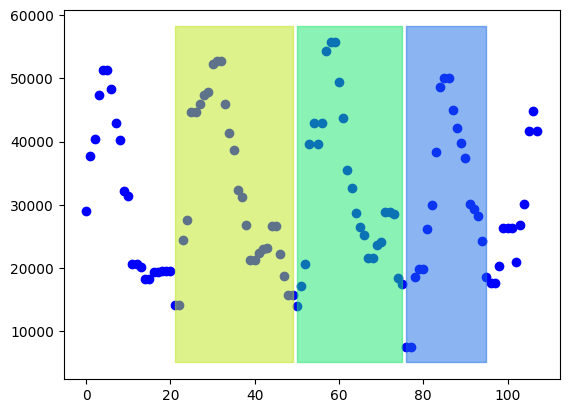

0.7775938522355501
==========       187 / 1276  -  14.655172413793103  % complete      ==========
         Current MAE =  0.09626502567383902
         Current DSC =  0.8847127451616175


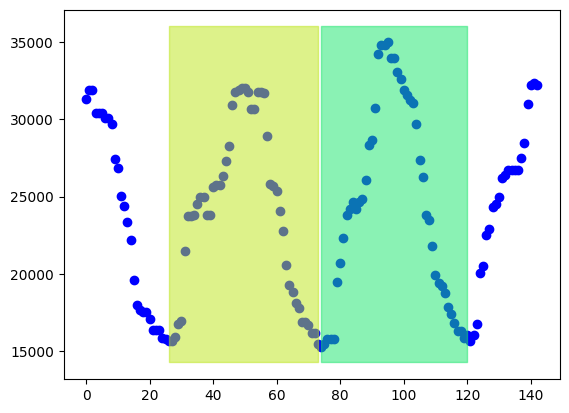

0.5386693799157568
==========       188 / 1276  -  14.733542319749215  % complete      ==========
         Current MAE =  0.09602099164308443
         Current DSC =  0.8849222254245839


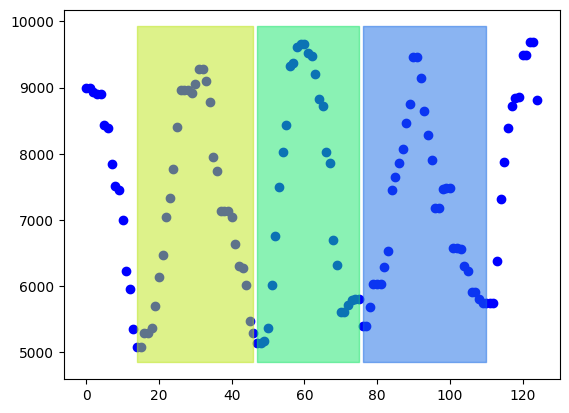

0.4502589679390528
==========       189 / 1276  -  14.81191222570533  % complete      ==========
         Current MAE =  0.09631302397812672
         Current DSC =  0.8847839151109967


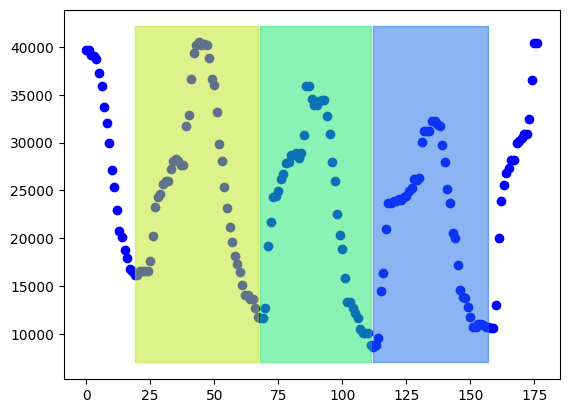

0.713577801497895
==========       190 / 1276  -  14.890282131661442  % complete      ==========
         Current MAE =  0.09633919519213617
         Current DSC =  0.8849160724564602


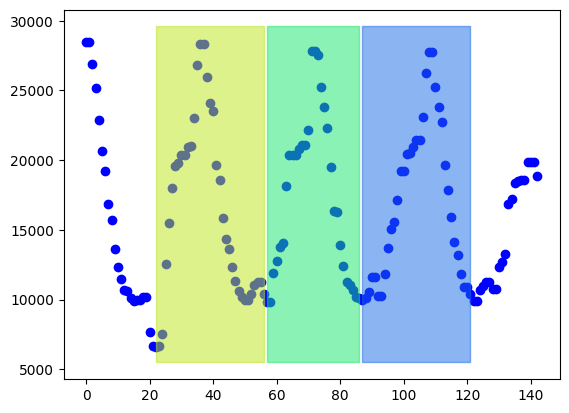

0.6854780919359414
==========       191 / 1276  -  14.968652037617554  % complete      ==========
         Current MAE =  0.09628030309609259
         Current DSC =  0.8851144878652083


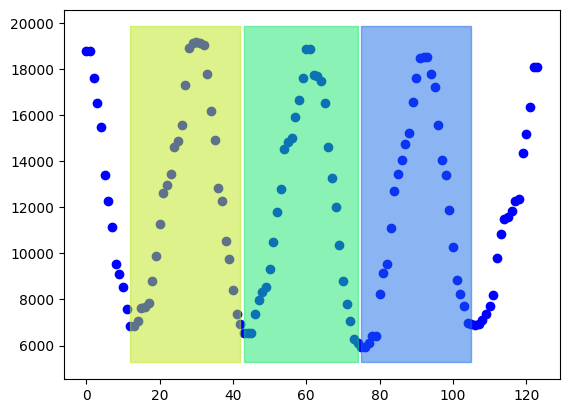

0.6631575402542872
==========       192 / 1276  -  15.047021943573668  % complete      ==========
         Current MAE =  0.0958654017863022
         Current DSC =  0.8851880477741361


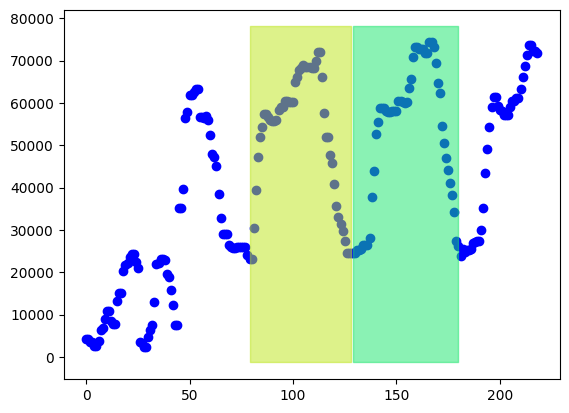

0.6753947419336574
==========       193 / 1276  -  15.12539184952978  % complete      ==========
         Current MAE =  0.09578441517023564
         Current DSC =  0.885350996039692


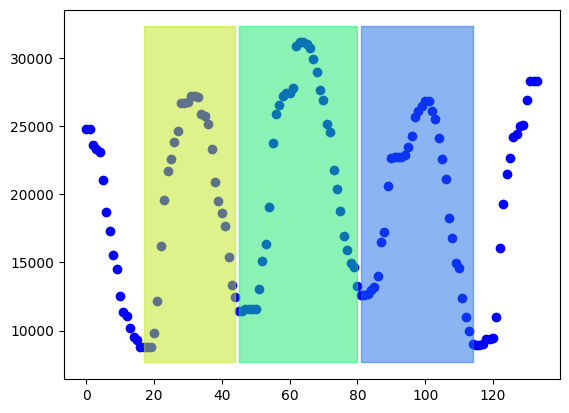

0.6461159983424198
==========       194 / 1276  -  15.203761755485893  % complete      ==========
         Current MAE =  0.09531989862087537
         Current DSC =  0.8856319462515644


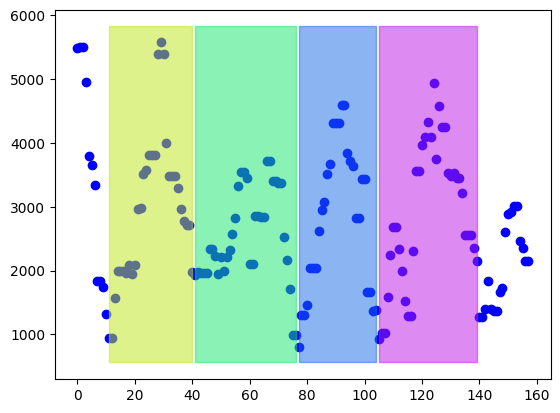

0.8002791789730802
==========       195 / 1276  -  15.282131661442007  % complete      ==========
         Current MAE =  0.09541895864718893
         Current DSC =  0.8848724753428728


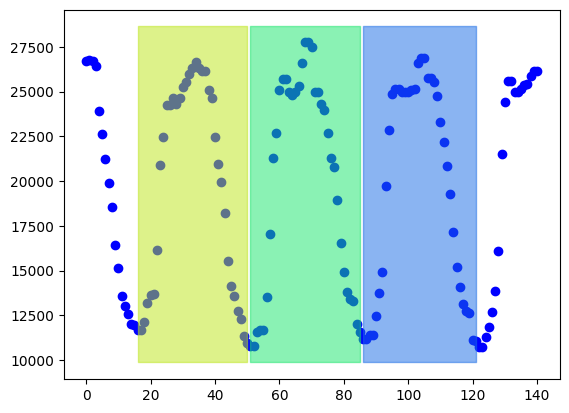

0.590676227054832
==========       196 / 1276  -  15.360501567398119  % complete      ==========
         Current MAE =  0.09504369175028726
         Current DSC =  0.8850043856975983


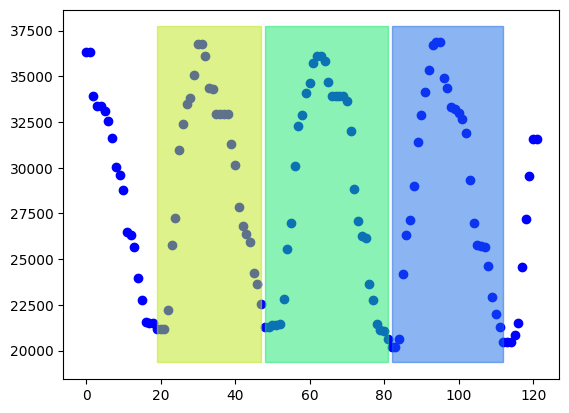

0.43144062580835857
==========       197 / 1276  -  15.438871473354231  % complete      ==========
         Current MAE =  0.09535268904130824
         Current DSC =  0.8852991183397129


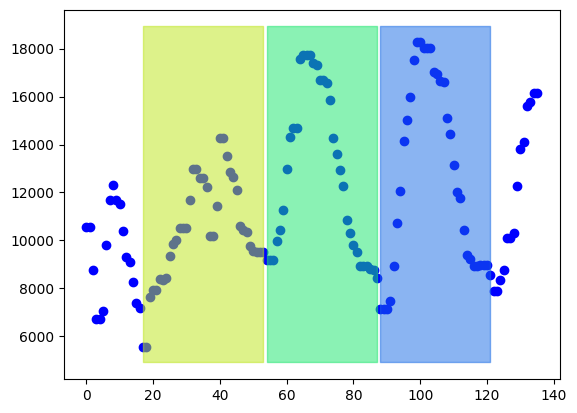

0.5764047827846901
==========       198 / 1276  -  15.517241379310345  % complete      ==========
         Current MAE =  0.0949839830261461
         Current DSC =  0.8850381678403026


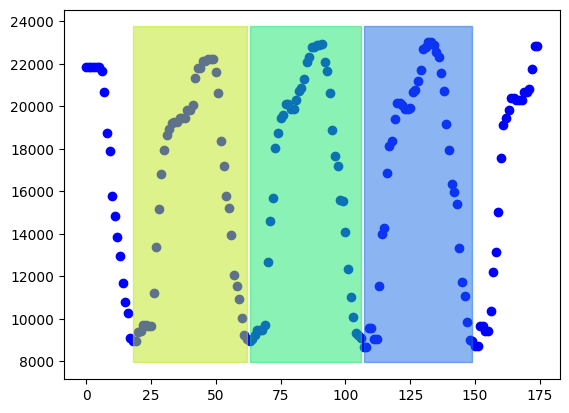

0.6103166443408118
==========       199 / 1276  -  15.595611285266457  % complete      ==========
         Current MAE =  0.0946102493426412
         Current DSC =  0.8852492112610209


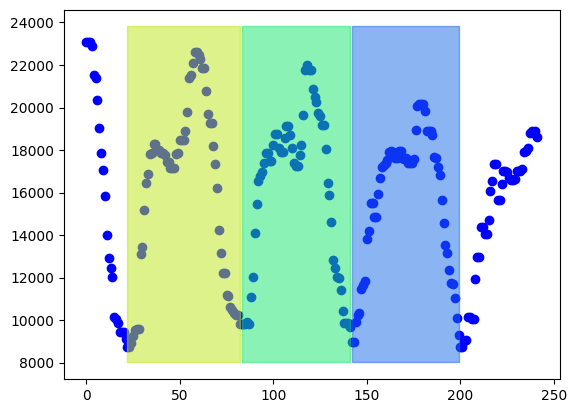

0.5749255886647403
==========       200 / 1276  -  15.67398119122257  % complete      ==========
         Current MAE =  0.09435397976798443
         Current DSC =  0.8853009387850761


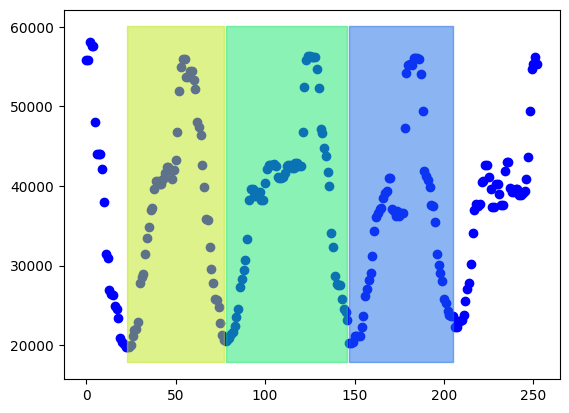

0.6398248418291351
==========       201 / 1276  -  15.752351097178684  % complete      ==========
         Current MAE =  0.09411835874758623
         Current DSC =  0.8854516255321787


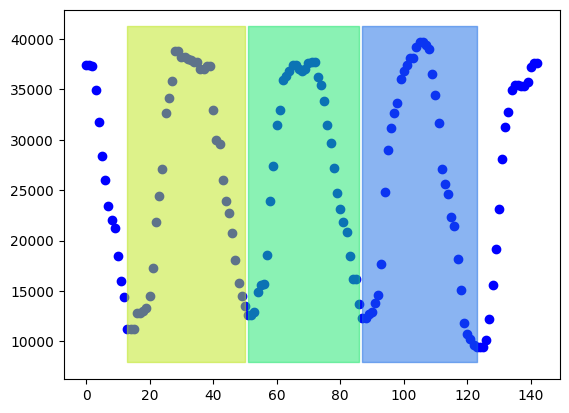

0.7116377516136491
==========       202 / 1276  -  15.830721003134796  % complete      ==========
         Current MAE =  0.0939034713921393
         Current DSC =  0.8854487535386982


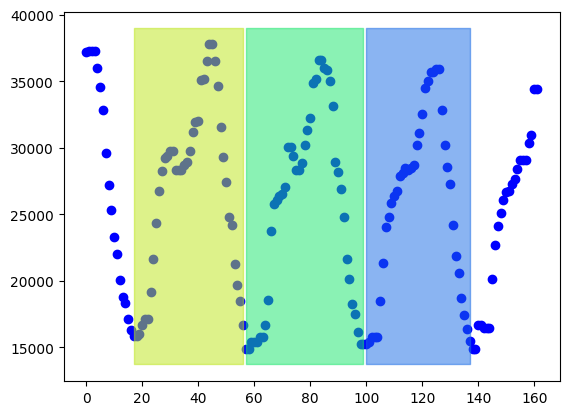

0.5836078112851673
==========       203 / 1276  -  15.909090909090908  % complete      ==========
         Current MAE =  0.09346291385475279
         Current DSC =  0.8854562417039731


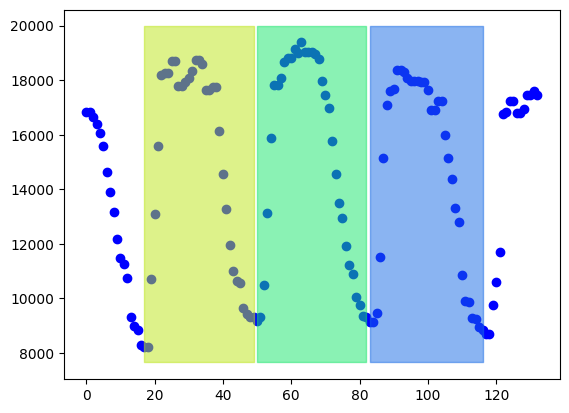

0.5337424082585986
==========       204 / 1276  -  15.987460815047022  % complete      ==========
         Current MAE =  0.09310523707408934
         Current DSC =  0.8857577782051236


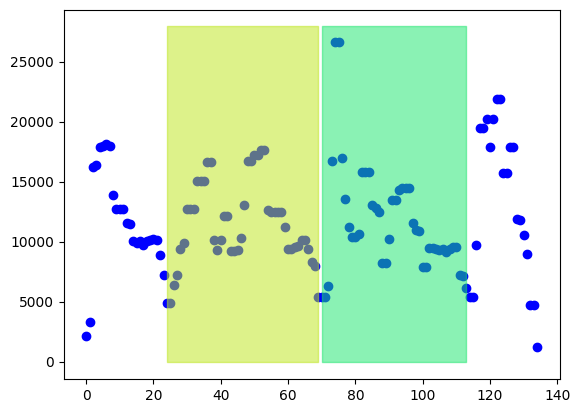

0.7595200552530843
==========       205 / 1276  -  16.065830721003135  % complete      ==========
         Current MAE =  0.09358639967200517
         Current DSC =  0.8858811573284429


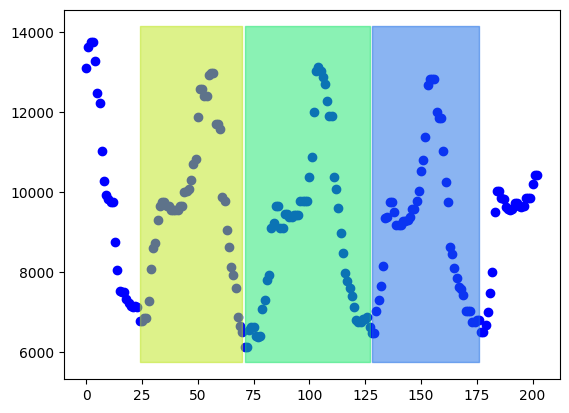

0.5050754489078223
==========       206 / 1276  -  16.144200626959247  % complete      ==========
         Current MAE =  0.09349816560461686
         Current DSC =  0.8859374285901634


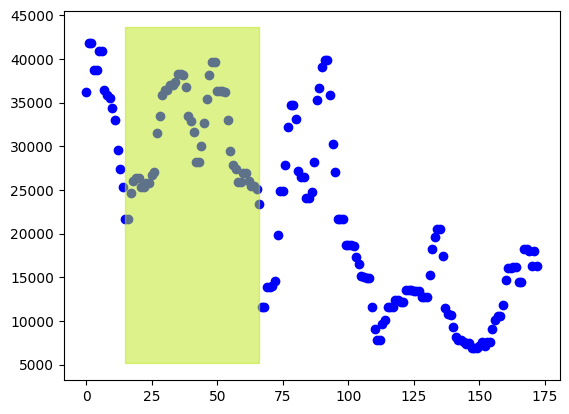

0.4524660925361392
==========       207 / 1276  -  16.22257053291536  % complete      ==========
         Current MAE =  0.09409696988088767
         Current DSC =  0.8856673119724661


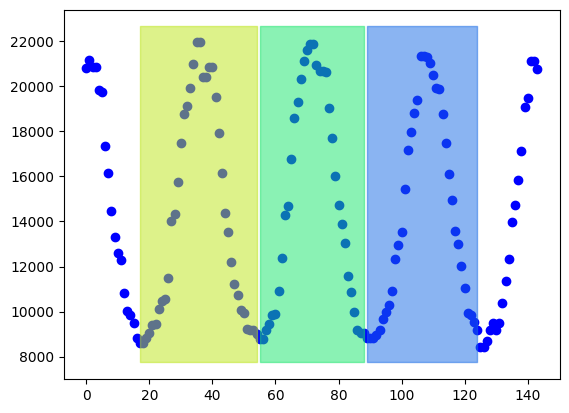

0.5979868051095801
==========       208 / 1276  -  16.300940438871475  % complete      ==========
         Current MAE =  0.0938252907443488
         Current DSC =  0.885922601303229


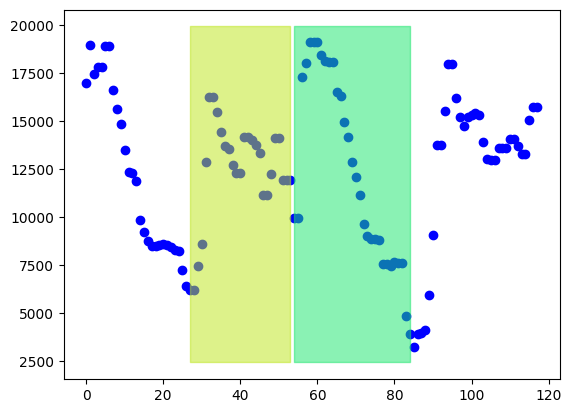

0.683131121018077
==========       209 / 1276  -  16.379310344827587  % complete      ==========
         Current MAE =  0.09383381964810476
         Current DSC =  0.8860842825122998


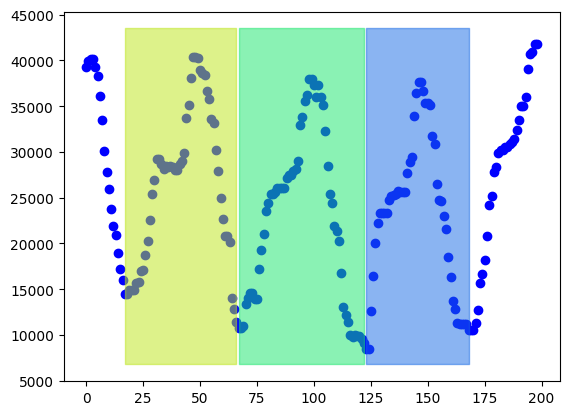

0.7350096461597281
==========       210 / 1276  -  16.4576802507837  % complete      ==========
         Current MAE =  0.09413189615347492
         Current DSC =  0.885951413710912


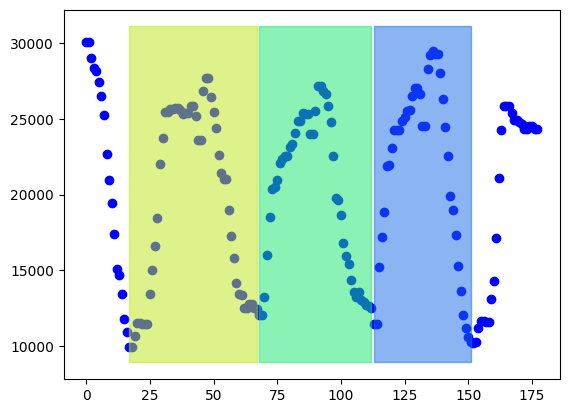

0.6126763022429768
==========       211 / 1276  -  16.53605015673981  % complete      ==========
         Current MAE =  0.09379459805823212
         Current DSC =  0.8861017653727419


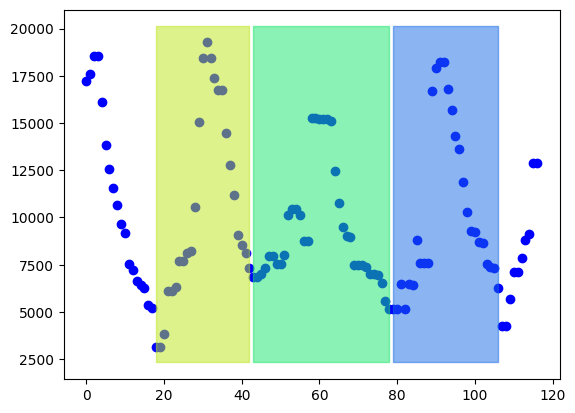

0.7298985682355413
==========       212 / 1276  -  16.614420062695924  % complete      ==========
         Current MAE =  0.0937575389137643
         Current DSC =  0.8860413800432997


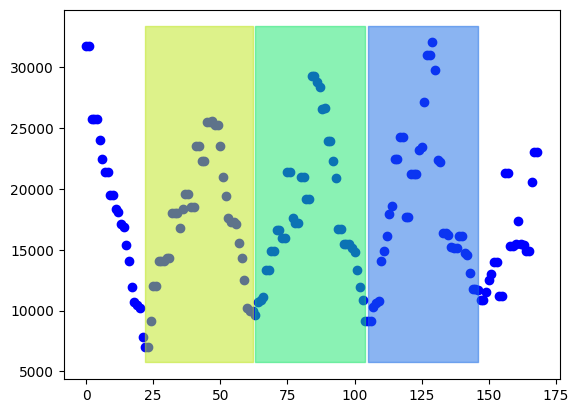

0.7039400605173493
==========       213 / 1276  -  16.692789968652036  % complete      ==========
         Current MAE =  0.09356788737901947
         Current DSC =  0.8858004682500598


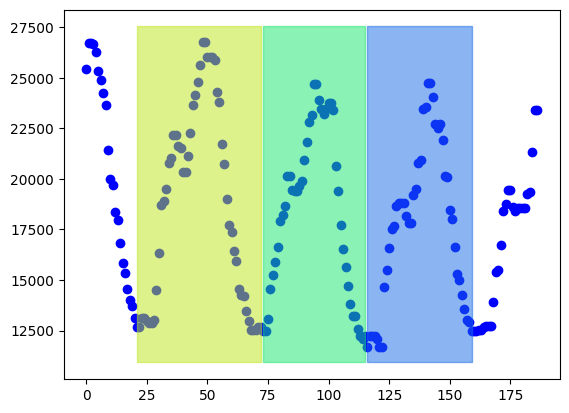

0.524133857026147
==========       214 / 1276  -  16.771159874608152  % complete      ==========
         Current MAE =  0.09331989941833148
         Current DSC =  0.8858106918981142


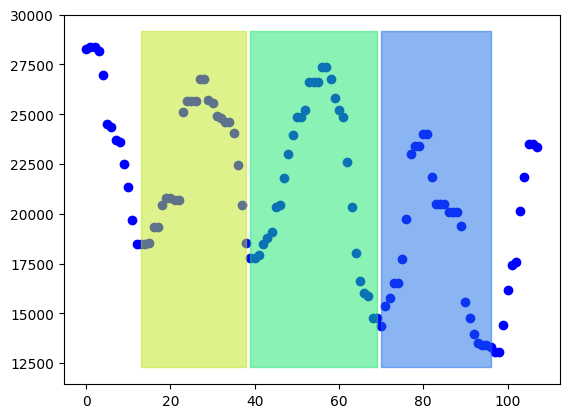

0.40331965114224594
==========       215 / 1276  -  16.849529780564264  % complete      ==========
         Current MAE =  0.09334816662127446
         Current DSC =  0.8860564098801724


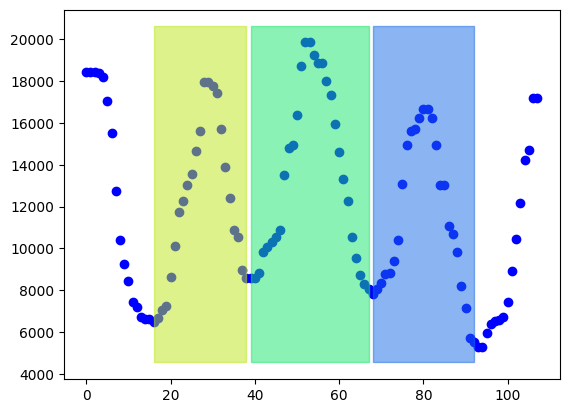

0.6262264450533074
==========       216 / 1276  -  16.927899686520377  % complete      ==========
         Current MAE =  0.09313849427541546
         Current DSC =  0.8862628729807006


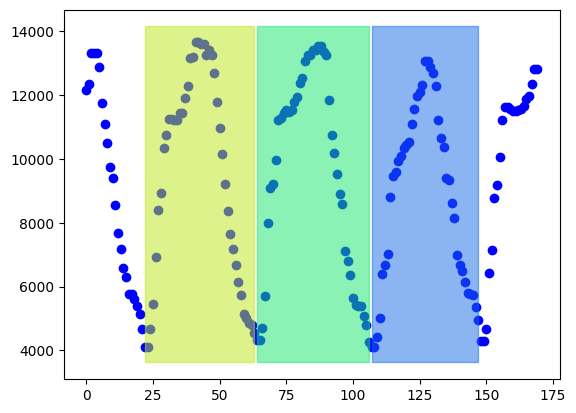

0.6885548766165271
==========       217 / 1276  -  17.00626959247649  % complete      ==========
         Current MAE =  0.09273014888728981
         Current DSC =  0.8863066322243158


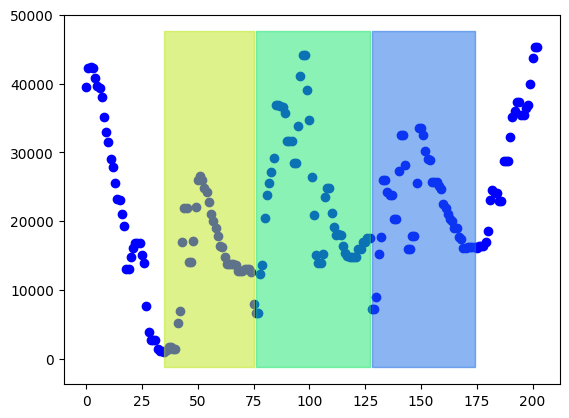

0.8655928503493374
==========       218 / 1276  -  17.0846394984326  % complete      ==========
         Current MAE =  0.09433179099920631
         Current DSC =  0.8864104159928243


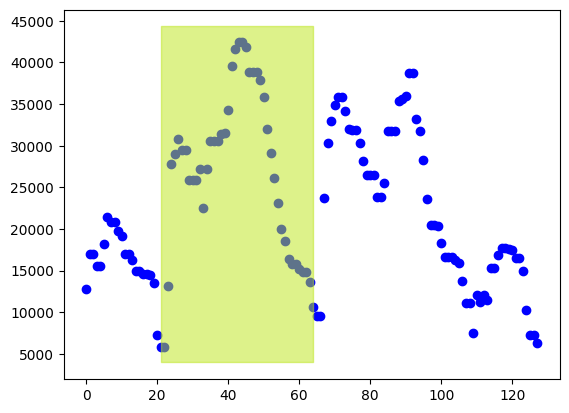

0.8634374122984767
==========       219 / 1276  -  17.163009404388713  % complete      ==========
         Current MAE =  0.0952006988524437
         Current DSC =  0.8862215906517691


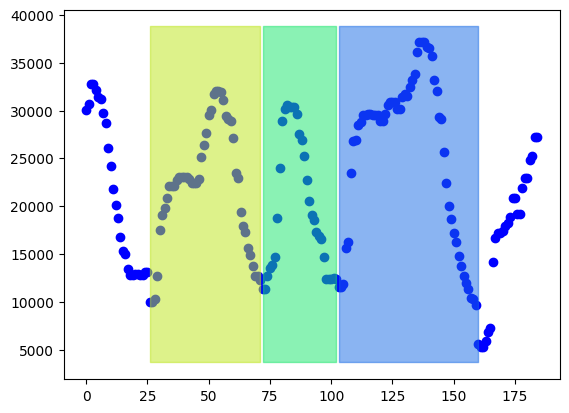

0.6865770126064324
==========       220 / 1276  -  17.24137931034483  % complete      ==========
         Current MAE =  0.09533478827389065
         Current DSC =  0.8864041656255722


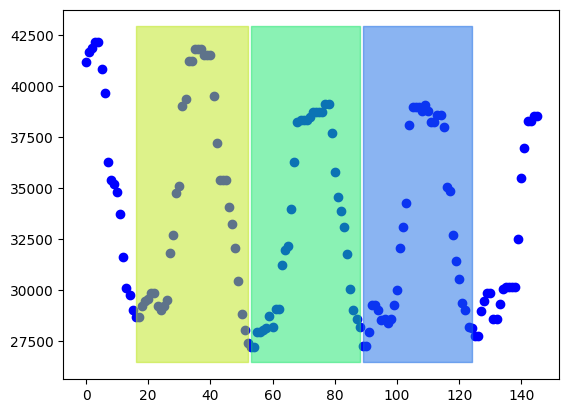

0.3118470892630955
==========       221 / 1276  -  17.31974921630094  % complete      ==========
         Current MAE =  0.09499300939540077
         Current DSC =  0.8867175473886377


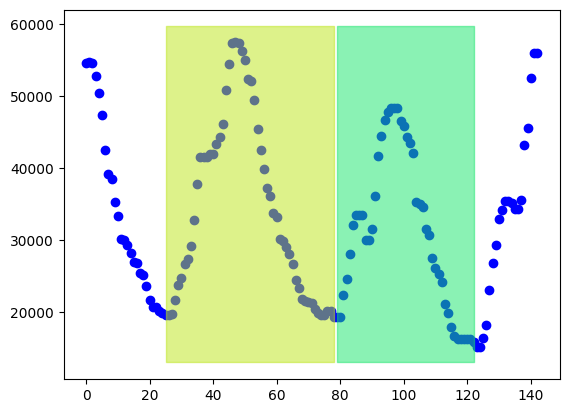

0.6628201529492961
==========       222 / 1276  -  17.398119122257054  % complete      ==========
         Current MAE =  0.09480531994724503
         Current DSC =  0.8868708648123182


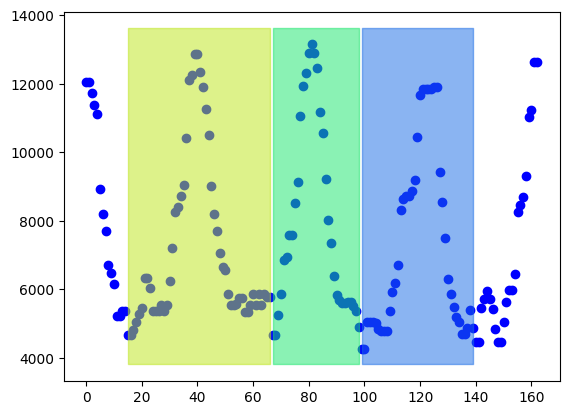

0.6420674842078263
==========       223 / 1276  -  17.476489028213166  % complete      ==========
         Current MAE =  0.09507895860335835
         Current DSC =  0.8865152565353119


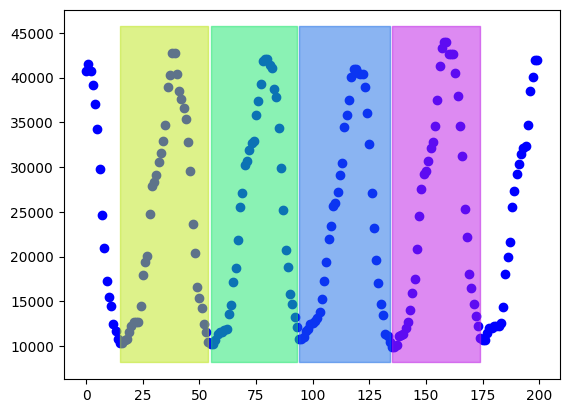

0.7564469611056174
==========       224 / 1276  -  17.55485893416928  % complete      ==========
         Current MAE =  0.09498691679115137
         Current DSC =  0.8866869716772011


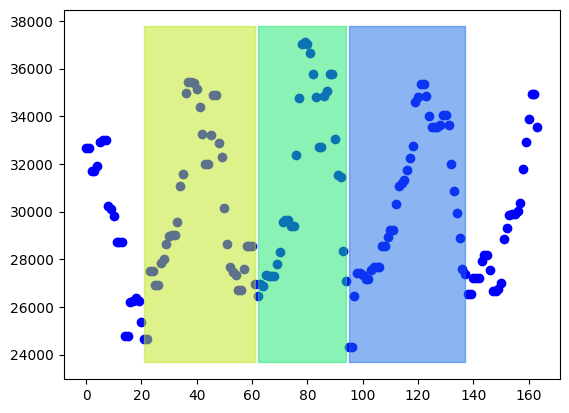

0.3011341186559899
==========       225 / 1276  -  17.63322884012539  % complete      ==========
         Current MAE =  0.09504586232477677
         Current DSC =  0.8869858354992337


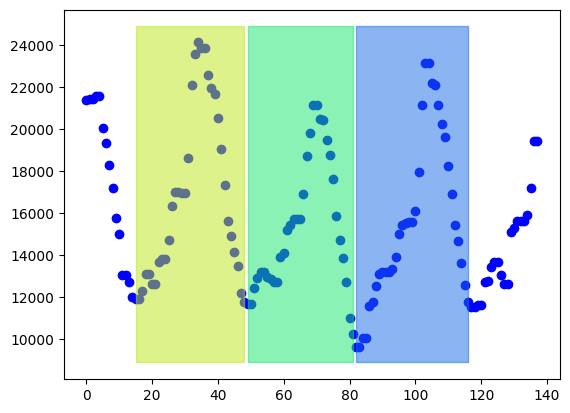

0.5244429946779269
==========       226 / 1276  -  17.711598746081506  % complete      ==========
         Current MAE =  0.09488161096063907
         Current DSC =  0.8872243659158724


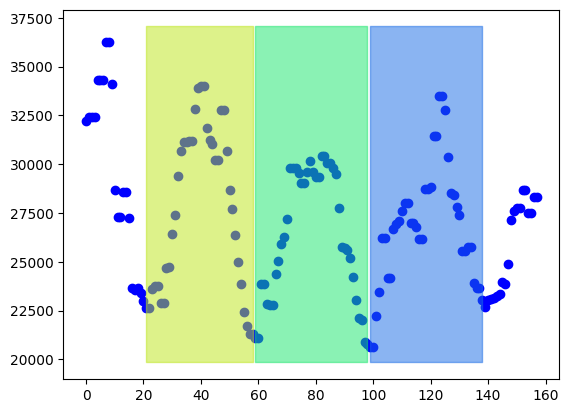

0.35704747081291144
==========       227 / 1276  -  17.78996865203762  % complete      ==========
         Current MAE =  0.09491025162739031
         Current DSC =  0.8872155631166198


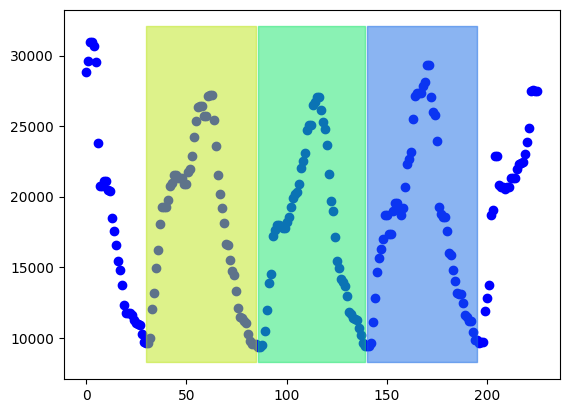

0.6609635170673488
==========       228 / 1276  -  17.86833855799373  % complete      ==========
         Current MAE =  0.09496443116756789
         Current DSC =  0.8874401891963524


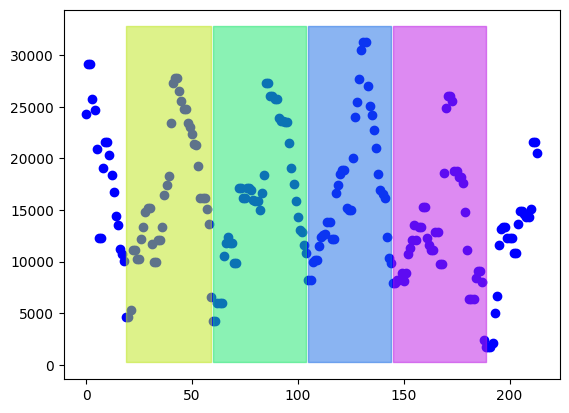

0.8307934417483919
==========       229 / 1276  -  17.946708463949843  % complete      ==========
         Current MAE =  0.09518467889093436
         Current DSC =  0.8862841610825218


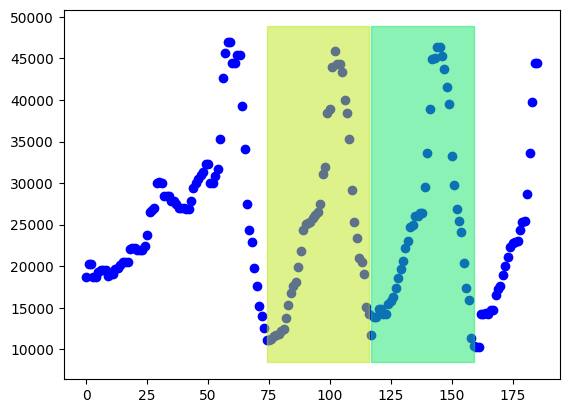

0.7567084455727378
==========       230 / 1276  -  18.025078369905955  % complete      ==========
         Current MAE =  0.09533913134107447
         Current DSC =  0.886356110158174


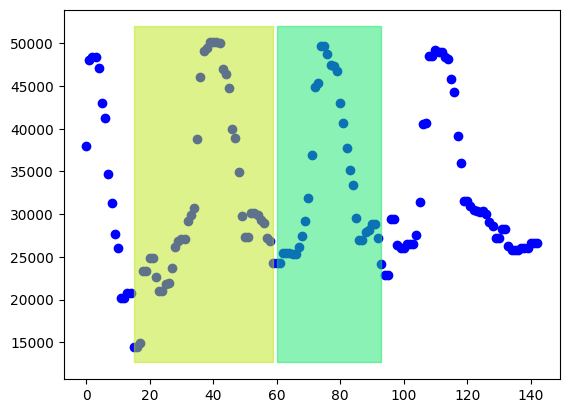

0.6121563546526219
==========       231 / 1276  -  18.103448275862068  % complete      ==========
         Current MAE =  0.09512585964200232
         Current DSC =  0.8859824788518799


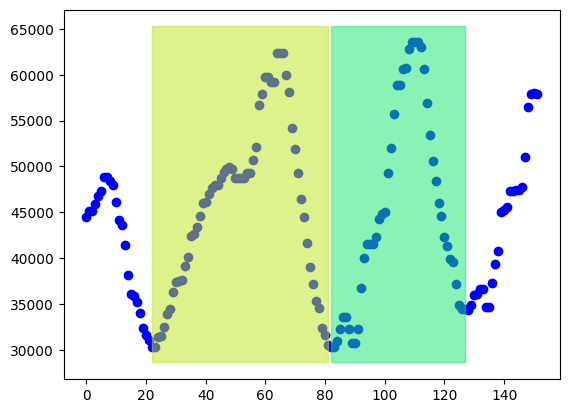

0.5184633545614219
==========       232 / 1276  -  18.181818181818183  % complete      ==========
         Current MAE =  0.09484051760224937
         Current DSC =  0.8861145508186571


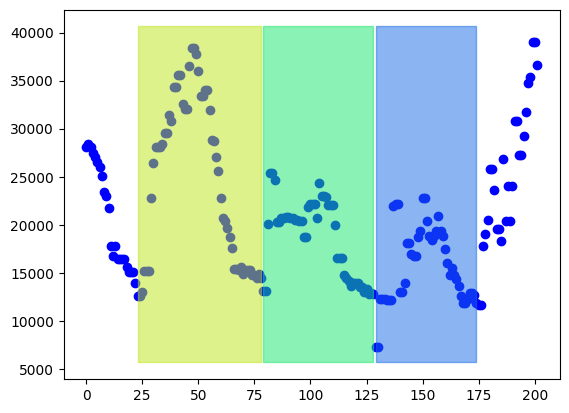

0.6161471159341129
==========       233 / 1276  -  18.260188087774296  % complete      ==========
         Current MAE =  0.09454693267035215
         Current DSC =  0.8862130777518636


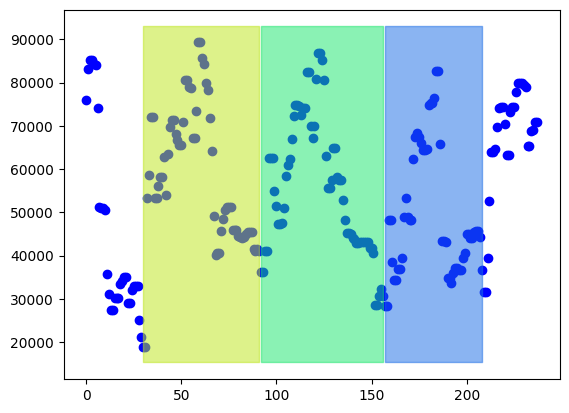

0.7061960627043976
==========       234 / 1276  -  18.338557993730408  % complete      ==========
         Current MAE =  0.0947751784692008
         Current DSC =  0.8864781140771687


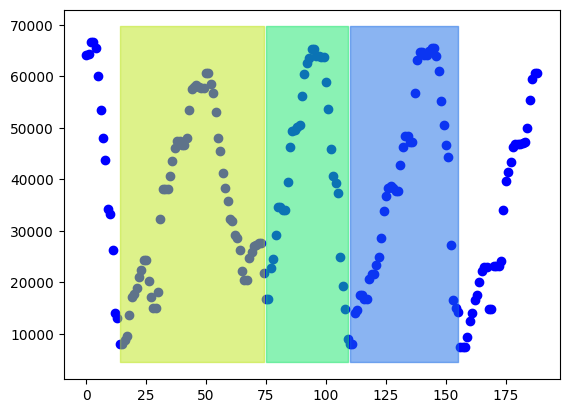

0.8404943904167174
==========       235 / 1276  -  18.41692789968652  % complete      ==========
         Current MAE =  0.09519938164311252
         Current DSC =  0.8865763002253594


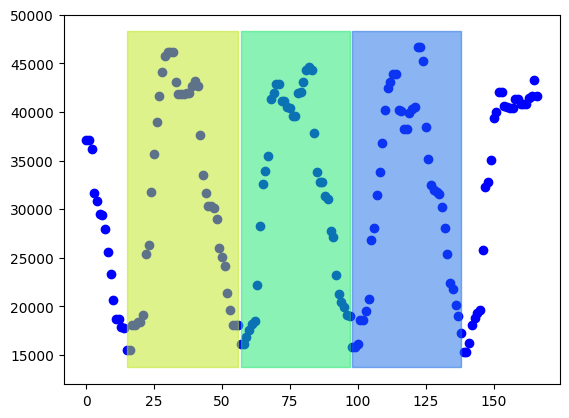

0.6541461935261944
==========       236 / 1276  -  18.495297805642632  % complete      ==========
         Current MAE =  0.09544705561986395
         Current DSC =  0.8867627816685175


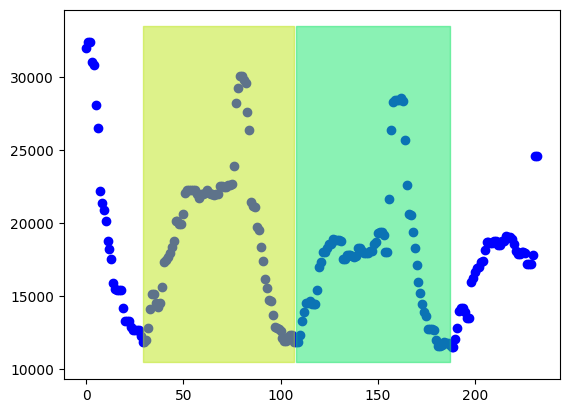

0.6000009916869966
==========       237 / 1276  -  18.573667711598745  % complete      ==========
         Current MAE =  0.0952994335882107
         Current DSC =  0.8869540029940223


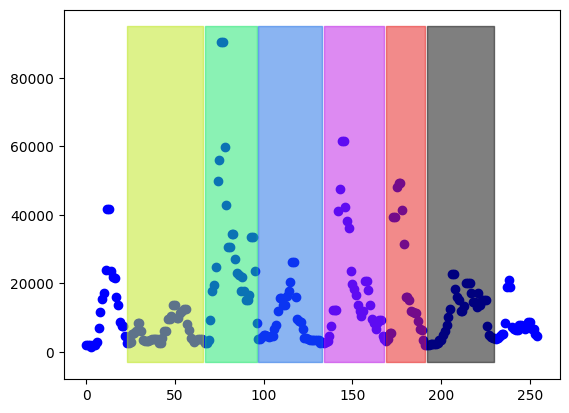

0.9167250159201474
==========       238 / 1276  -  18.65203761755486  % complete      ==========
         Current MAE =  0.0962966437577083
         Current DSC =  0.8843336218044537


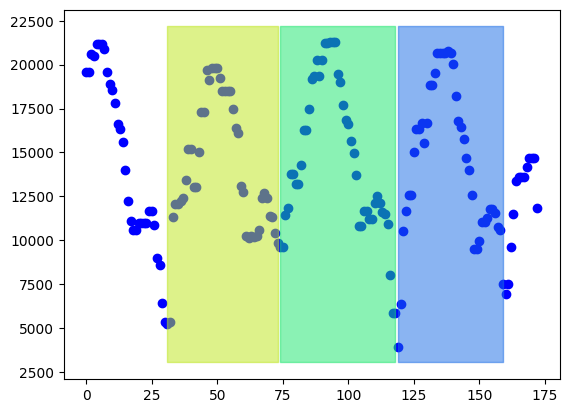

0.7575841199139407
==========       239 / 1276  -  18.730407523510973  % complete      ==========
         Current MAE =  0.09657723398930251
         Current DSC =  0.8842013645371632


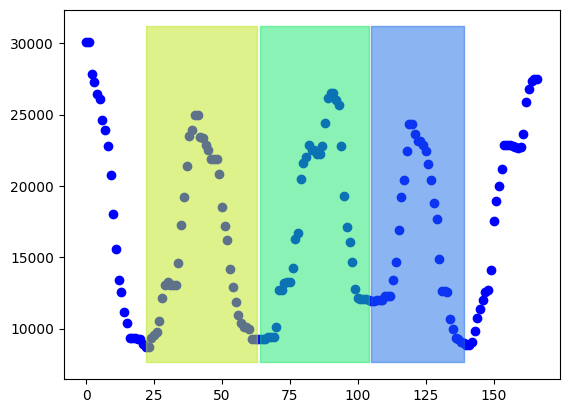

0.6435895436969515
==========       240 / 1276  -  18.808777429467085  % complete      ==========
         Current MAE =  0.09643145047034744
         Current DSC =  0.8843403781453768


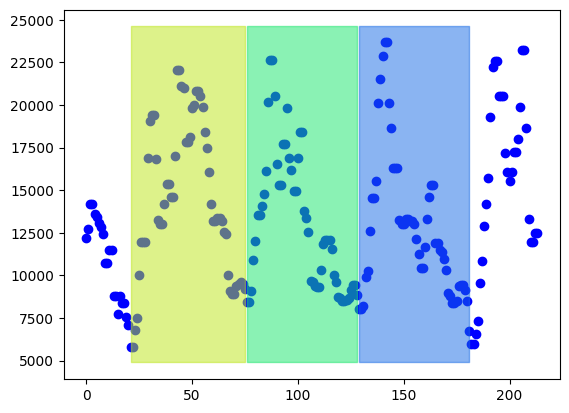

0.6750024333041308
==========       241 / 1276  -  18.887147335423197  % complete      ==========
         Current MAE =  0.09607675925662383
         Current DSC =  0.884071047375311


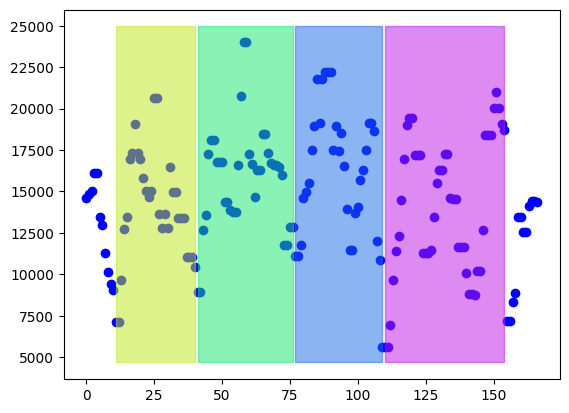

0.6319094160477886
==========       242 / 1276  -  18.96551724137931  % complete      ==========
         Current MAE =  0.0974004778034488
         Current DSC =  0.882778212551243


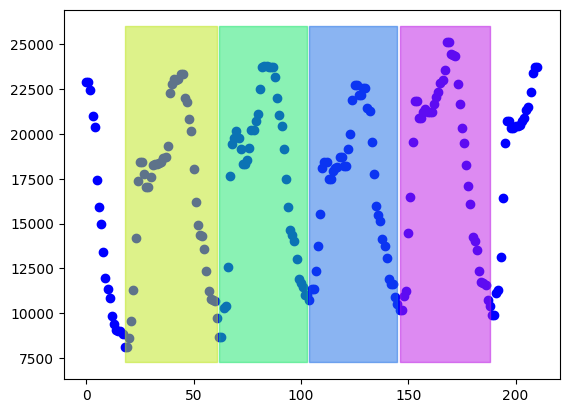

0.6030100645155799
==========       243 / 1276  -  19.043887147335422  % complete      ==========
         Current MAE =  0.09720766261641602
         Current DSC =  0.8828856400501581


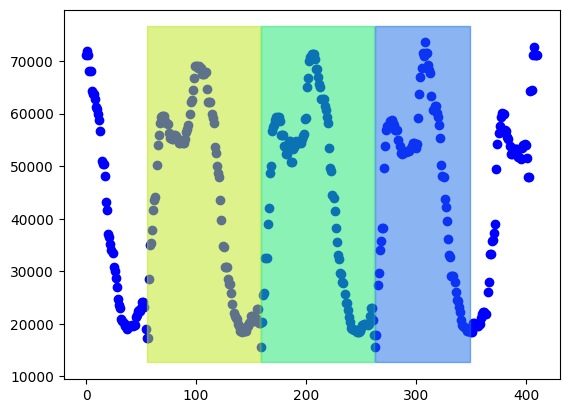

0.7735458821688921
==========       244 / 1276  -  19.122257053291538  % complete      ==========
         Current MAE =  0.09748317972078313
         Current DSC =  0.8830581221912728


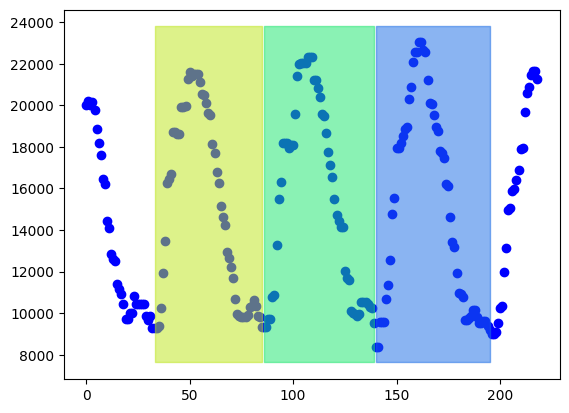

0.596151345781257
==========       245 / 1276  -  19.20062695924765  % complete      ==========
         Current MAE =  0.09747413921085735
         Current DSC =  0.8828848617417472


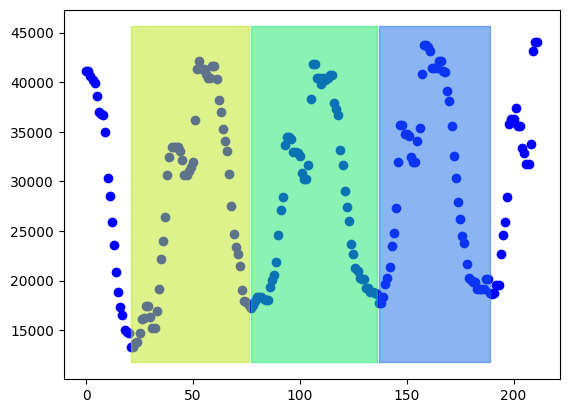

0.6222792169360956
==========       246 / 1276  -  19.278996865203762  % complete      ==========
         Current MAE =  0.09716159722454146
         Current DSC =  0.8830187827106414


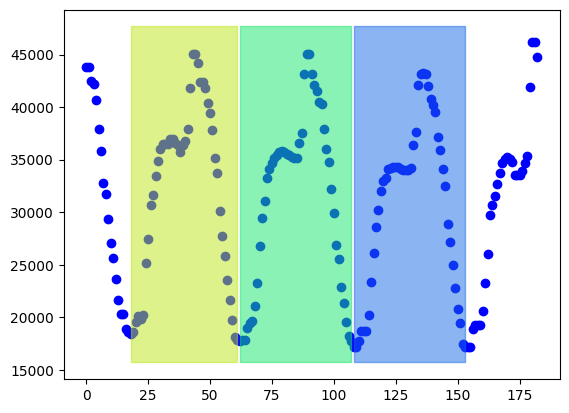

0.6023400017798711
==========       247 / 1276  -  19.357366771159874  % complete      ==========
         Current MAE =  0.09724269539378567
         Current DSC =  0.8830757500671664


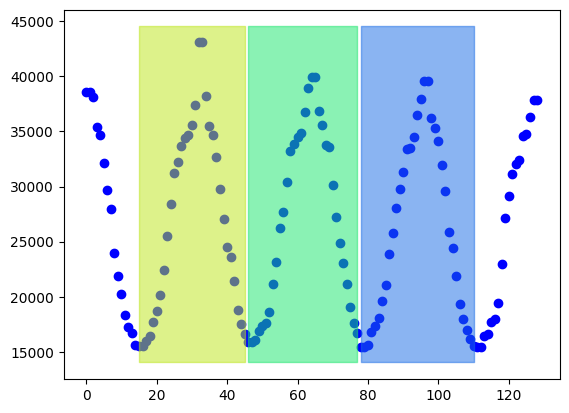

0.6175090421252323
==========       248 / 1276  -  19.435736677115987  % complete      ==========
         Current MAE =  0.09685823137656518
         Current DSC =  0.8832478119480994


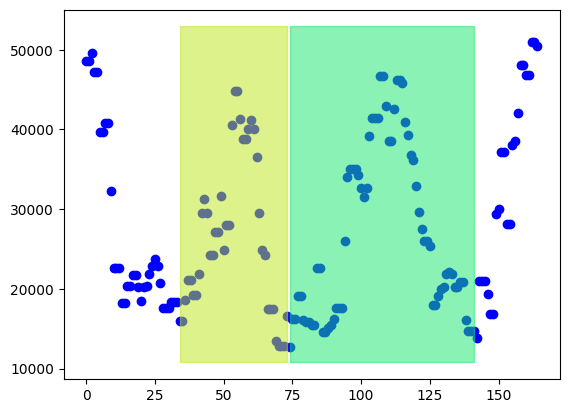

0.7221013954063327
==========       249 / 1276  -  19.5141065830721  % complete      ==========
         Current MAE =  0.09768553374010085
         Current DSC =  0.8828384895401308


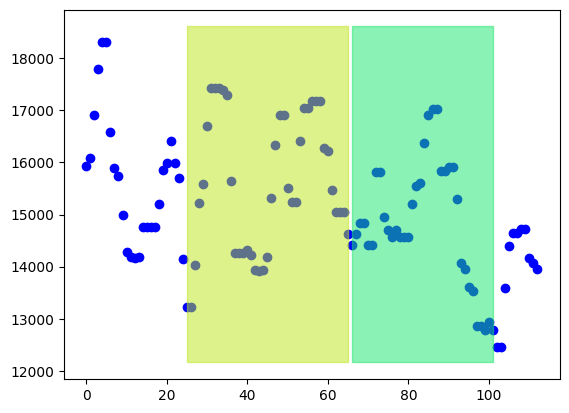

0.24491421264642227
==========       250 / 1276  -  19.592476489028215  % complete      ==========
         Current MAE =  0.09768221158668514
         Current DSC =  0.8827983891963959


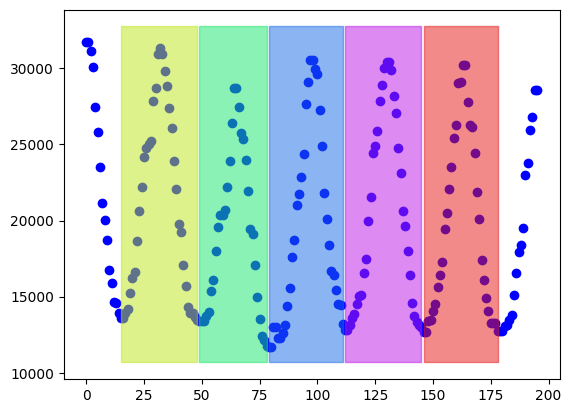

0.5836390288046365
==========       251 / 1276  -  19.670846394984327  % complete      ==========
         Current MAE =  0.09738575446458009
         Current DSC =  0.8830693929318888


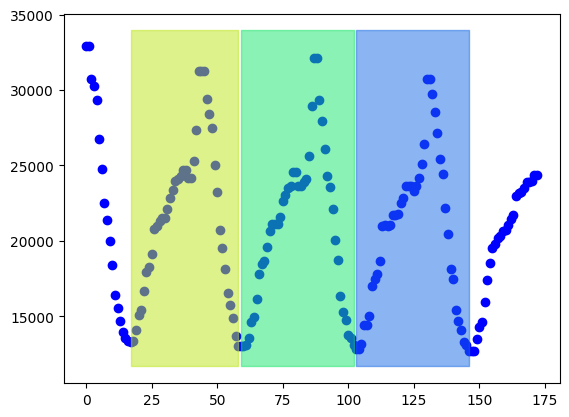

0.5835858096797647
==========       252 / 1276  -  19.74921630094044  % complete      ==========
         Current MAE =  0.09708166478046625
         Current DSC =  0.8832495915038245


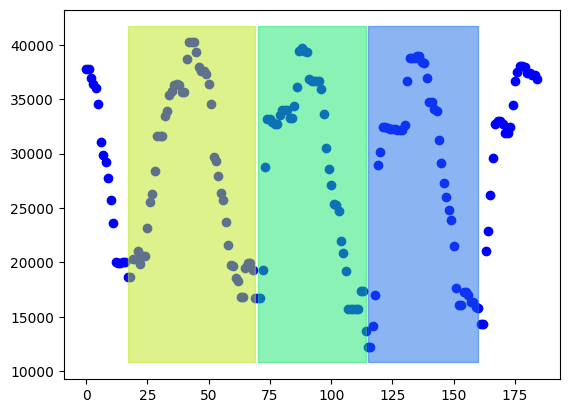

0.6253360505155813
==========       253 / 1276  -  19.82758620689655  % complete      ==========
         Current MAE =  0.09729780728180672
         Current DSC =  0.883416423448932


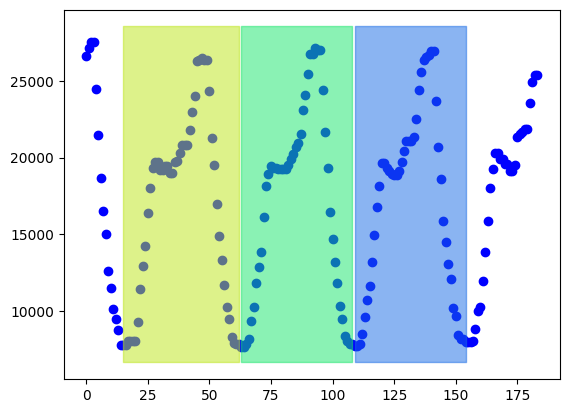

0.7136731141889844
==========       254 / 1276  -  19.905956112852664  % complete      ==========
         Current MAE =  0.09728713199896677
         Current DSC =  0.8834510584046521


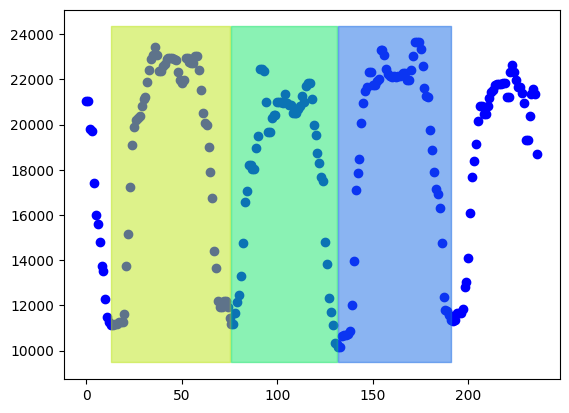

0.5456392982780192
==========       255 / 1276  -  19.984326018808776  % complete      ==========
         Current MAE =  0.09702712830421684
         Current DSC =  0.8834566731078952


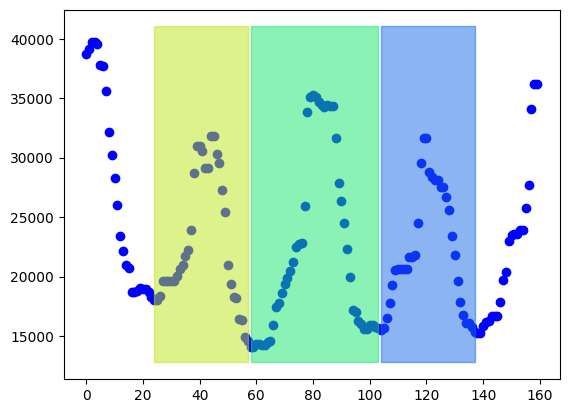

0.5473076602344787
==========       256 / 1276  -  20.062695924764892  % complete      ==========
         Current MAE =  0.0966499095645382
         Current DSC =  0.8835011154878885


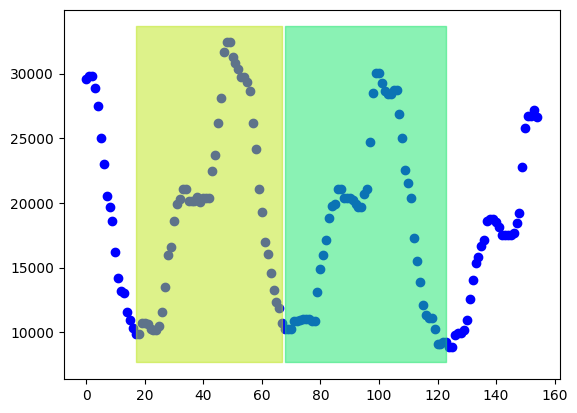

0.6964493406486868
==========       257 / 1276  -  20.141065830721004  % complete      ==========
         Current MAE =  0.09637752475542068
         Current DSC =  0.8837383709529031


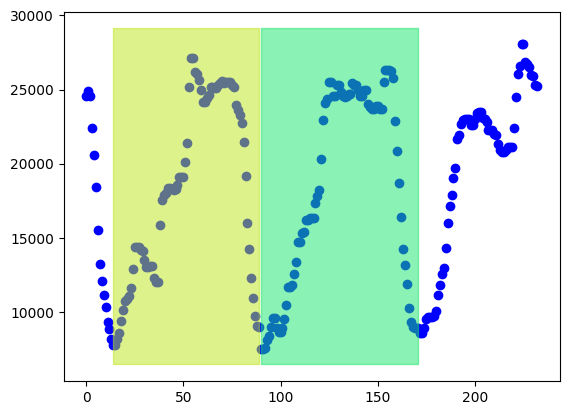

0.7143776326507141
==========       258 / 1276  -  20.219435736677116  % complete      ==========
         Current MAE =  0.09643507073304929
         Current DSC =  0.8838771826537081


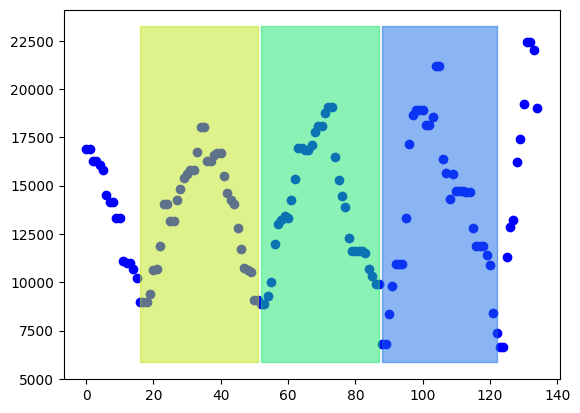

0.5721713365992537
==========       259 / 1276  -  20.29780564263323  % complete      ==========
         Current MAE =  0.09638270011065747
         Current DSC =  0.8835949976011593


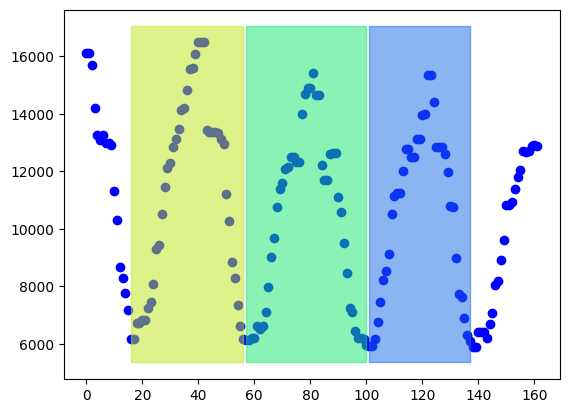

0.6150074101655062
==========       260 / 1276  -  20.37617554858934  % complete      ==========
         Current MAE =  0.09605852233409652
         Current DSC =  0.8835768438302554


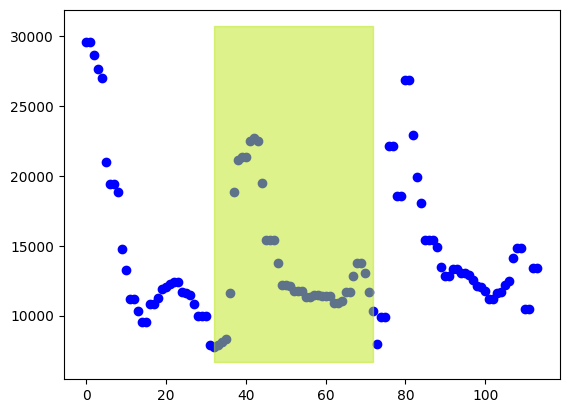

0.6598821772435159
==========       261 / 1276  -  20.454545454545453  % complete      ==========
         Current MAE =  0.09607023063025706
         Current DSC =  0.8836481995966242


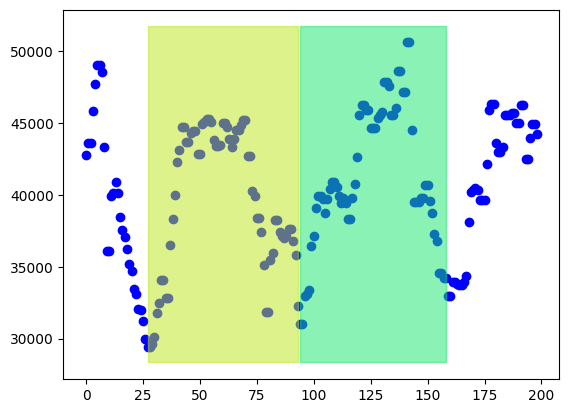

0.3686208867391725
==========       262 / 1276  -  20.53291536050157  % complete      ==========
         Current MAE =  0.09599364059168145
         Current DSC =  0.8838030127168611


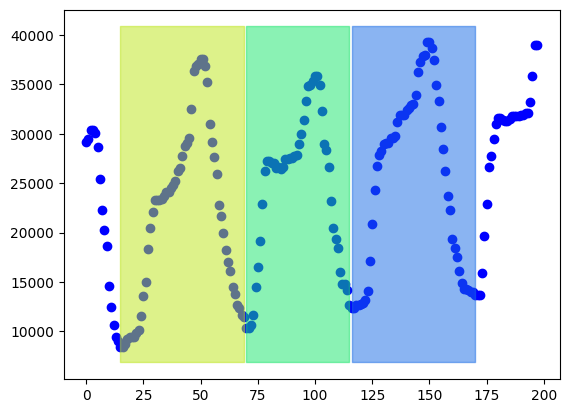

0.7243534051603321
==========       263 / 1276  -  20.61128526645768  % complete      ==========
         Current MAE =  0.09590941746694549
         Current DSC =  0.8838525867734118


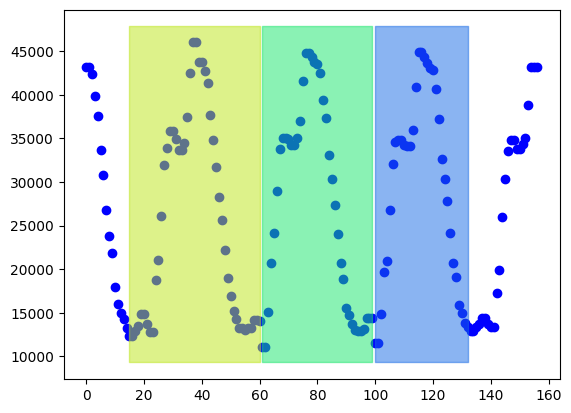

0.7425561660154804
==========       264 / 1276  -  20.689655172413794  % complete      ==========
         Current MAE =  0.09584498552153757
         Current DSC =  0.8839422471143983


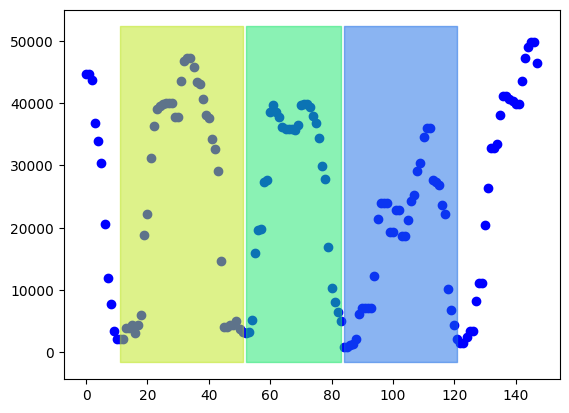

0.9512344340913502
==========       265 / 1276  -  20.768025078369906  % complete      ==========
         Current MAE =  0.09699799928249106
         Current DSC =  0.8832488316409993


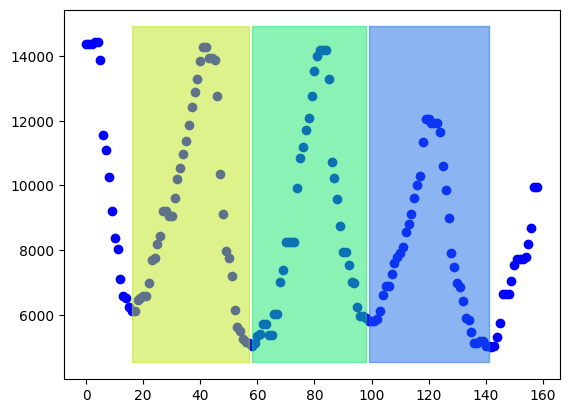

0.6216607525345538
==========       266 / 1276  -  20.846394984326018  % complete      ==========
         Current MAE =  0.09684669969561678
         Current DSC =  0.8834537325945115


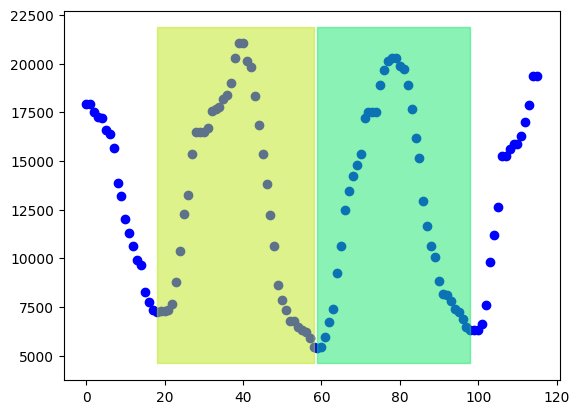

0.7272628339186945
==========       267 / 1276  -  20.92476489028213  % complete      ==========
         Current MAE =  0.09670848568964358
         Current DSC =  0.8835806020636684


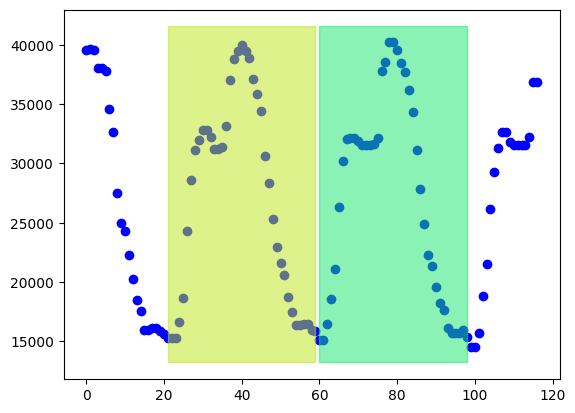

0.6217779298596631
==========       268 / 1276  -  21.003134796238246  % complete      ==========
         Current MAE =  0.09647070167443611
         Current DSC =  0.8837880810250097


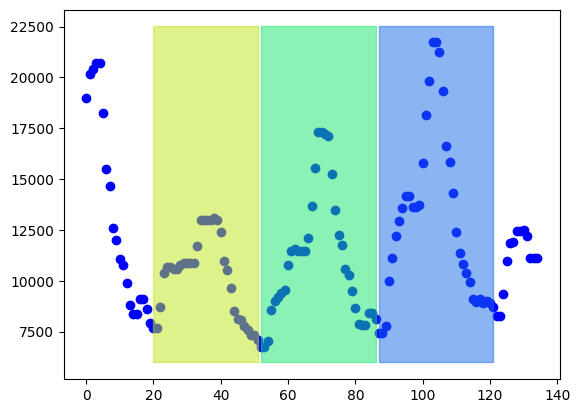

0.5695243773123461
==========       269 / 1276  -  21.08150470219436  % complete      ==========
         Current MAE =  0.09627755611057602
         Current DSC =  0.8839439904822736


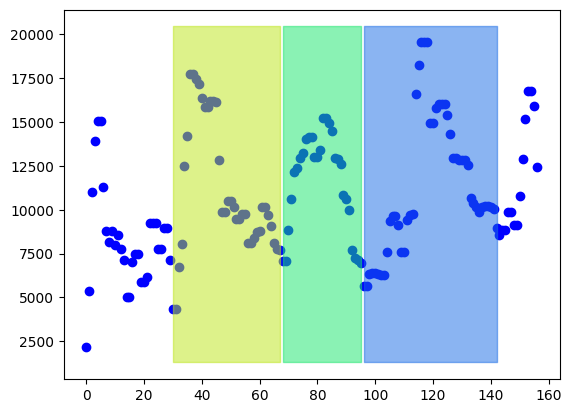

0.6672254572914604
==========       270 / 1276  -  21.15987460815047  % complete      ==========
         Current MAE =  0.09661364483896885
         Current DSC =  0.883748753203286


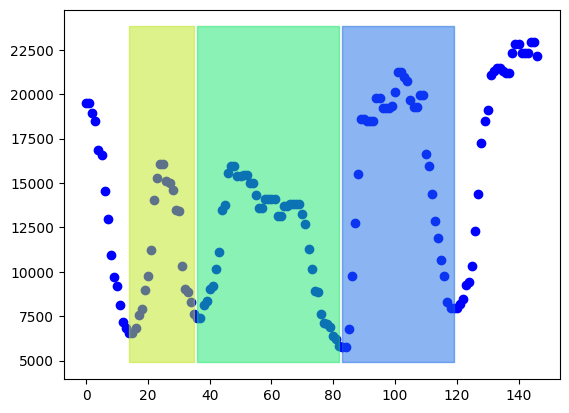

0.6439233916366821
==========       271 / 1276  -  21.238244514106583  % complete      ==========
         Current MAE =  0.09638024705687076
         Current DSC =  0.8839187344941706


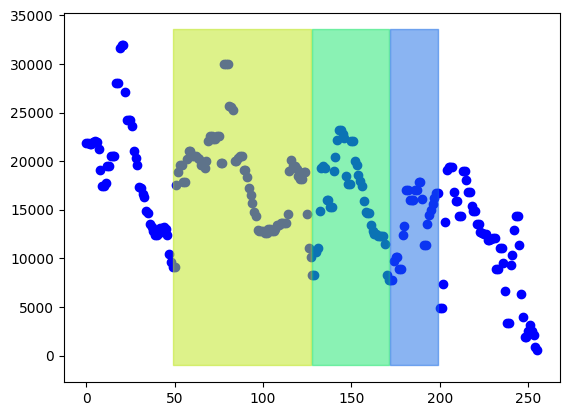

0.6349122502136929
==========       272 / 1276  -  21.316614420062695  % complete      ==========
         Current MAE =  0.0960974559712084
         Current DSC =  0.8840936913209803


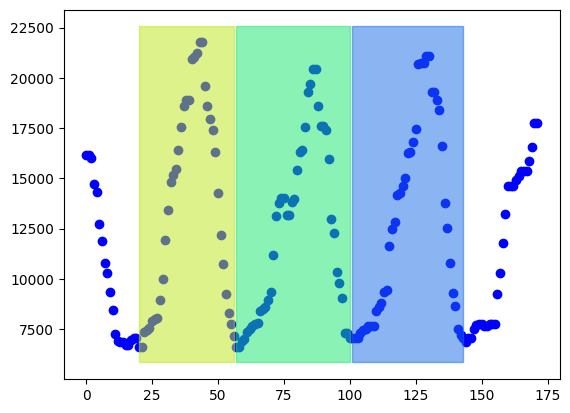

0.6797198433735215
==========       273 / 1276  -  21.394984326018808  % complete      ==========
         Current MAE =  0.09606274132047622
         Current DSC =  0.8841967453886738


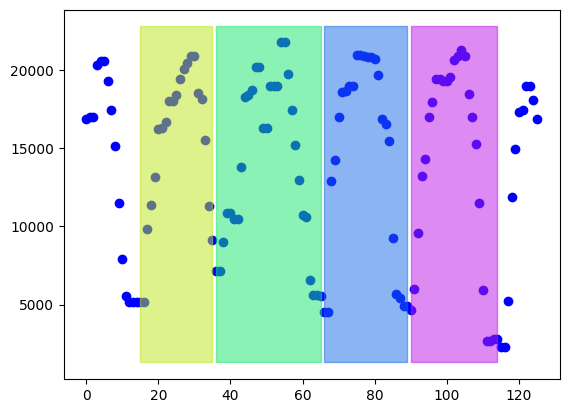

0.7883992204077439
==========       274 / 1276  -  21.473354231974923  % complete      ==========
         Current MAE =  0.0963268108071451
         Current DSC =  0.8841990178083852


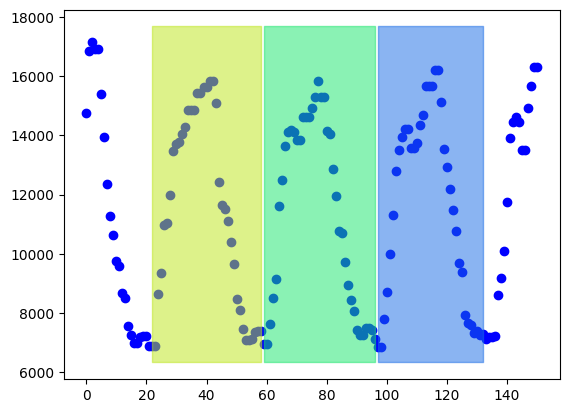

0.5689069770211669
==========       275 / 1276  -  21.551724137931036  % complete      ==========
         Current MAE =  0.09622863886108514
         Current DSC =  0.884250964901664


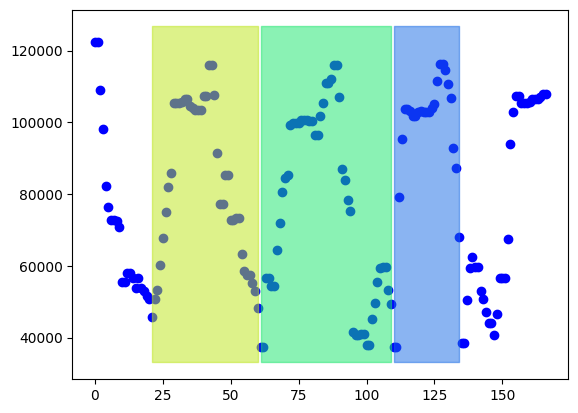

0.6539124036503118
==========       276 / 1276  -  21.630094043887148  % complete      ==========
         Current MAE =  0.09619519103064275
         Current DSC =  0.8844690197619839


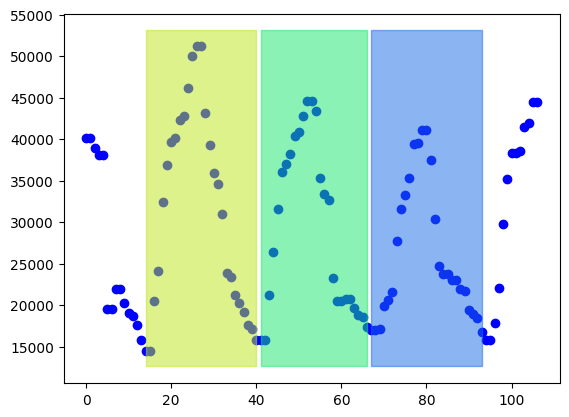

0.6505935191868972
==========       277 / 1276  -  21.70846394984326  % complete      ==========
         Current MAE =  0.09598434739262253
         Current DSC =  0.8846600834643368


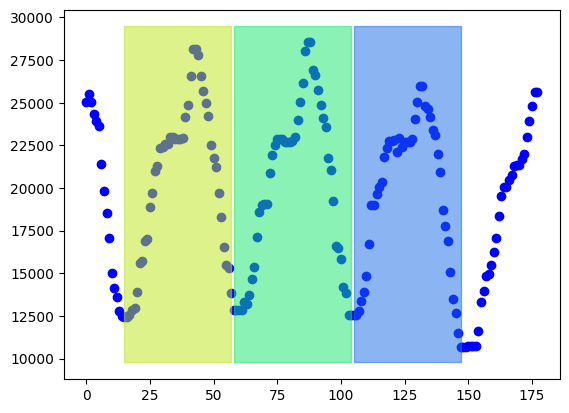

0.5582042860052577
==========       278 / 1276  -  21.786833855799372  % complete      ==========
         Current MAE =  0.09590551364866848
         Current DSC =  0.884827451311427


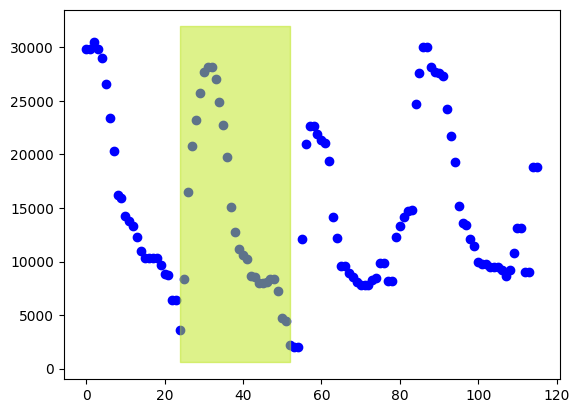

0.8720344030206402
==========       279 / 1276  -  21.865203761755485  % complete      ==========
         Current MAE =  0.09636006898987128
         Current DSC =  0.8848746993635718


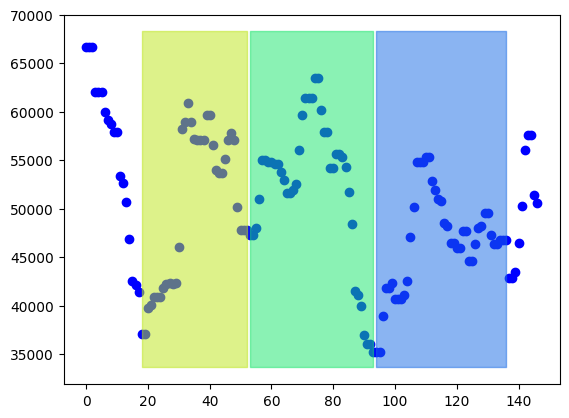

0.3963404657774446
==========       280 / 1276  -  21.9435736677116  % complete      ==========
         Current MAE =  0.09642699734506106
         Current DSC =  0.8850828294243132


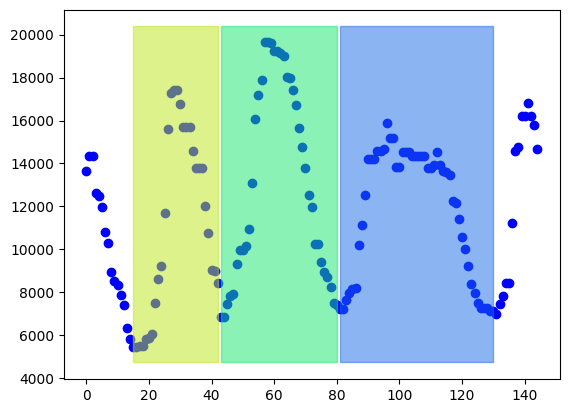

0.6300907684683009
==========       281 / 1276  -  22.021943573667713  % complete      ==========
         Current MAE =  0.09618923992356193
         Current DSC =  0.8851401110136636


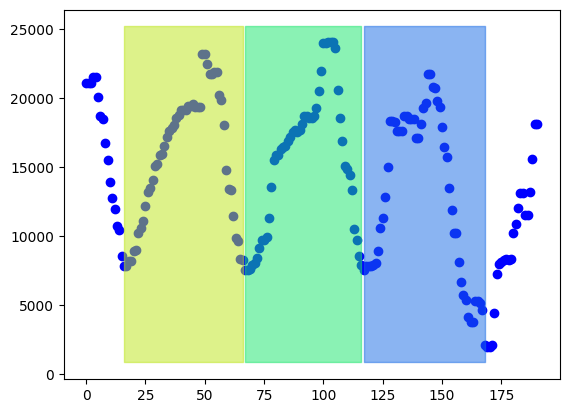

0.7252192245678649
==========       282 / 1276  -  22.100313479623825  % complete      ==========
         Current MAE =  0.09634888142085335
         Current DSC =  0.8851903541713741


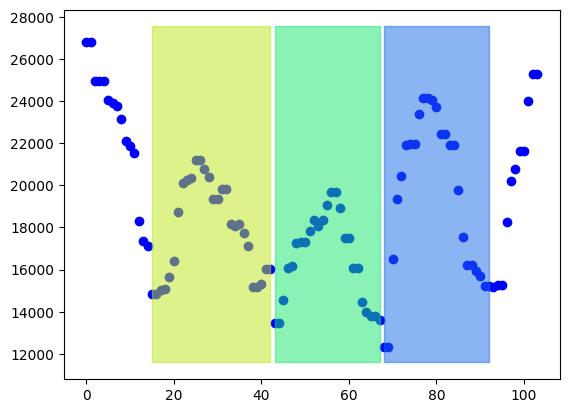

0.3687281160389643
==========       283 / 1276  -  22.178683385579937  % complete      ==========
         Current MAE =  0.09665961518627515
         Current DSC =  0.8850240374622412


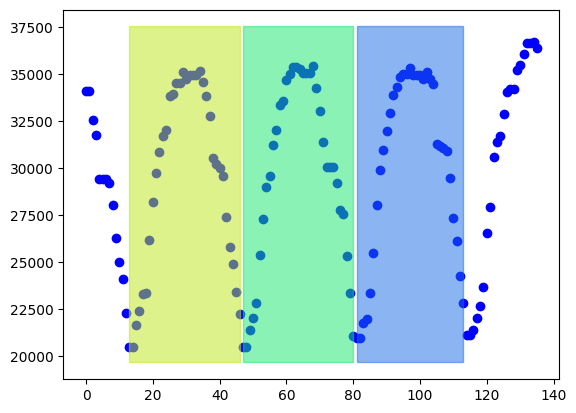

0.4151479583677398
==========       284 / 1276  -  22.25705329153605  % complete      ==========
         Current MAE =  0.09637917873199041
         Current DSC =  0.8849257218166137


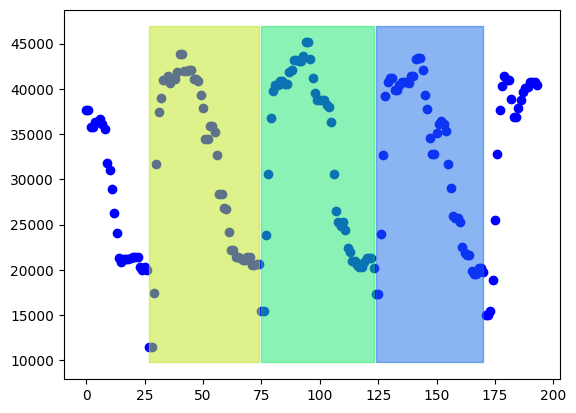

0.6661697951562179
==========       285 / 1276  -  22.33542319749216  % complete      ==========
         Current MAE =  0.09654846905867207
         Current DSC =  0.8850947451173213


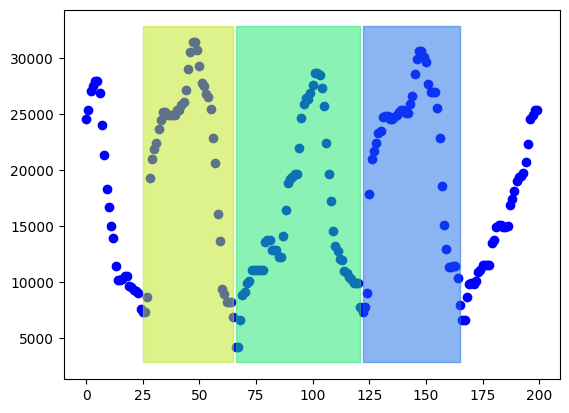

0.7942874691337506
==========       286 / 1276  -  22.413793103448278  % complete      ==========
         Current MAE =  0.09676091502218825
         Current DSC =  0.8852485722595161


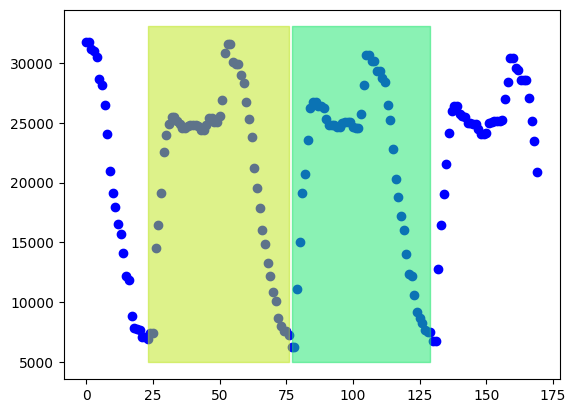

0.7890981164556383
==========       287 / 1276  -  22.49216300940439  % complete      ==========
         Current MAE =  0.09696027794695392
         Current DSC =  0.8853895238467625


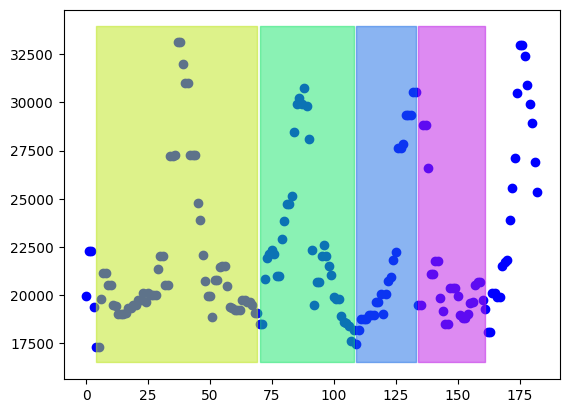

0.4230074944708147
==========       288 / 1276  -  22.570532915360502  % complete      ==========
         Current MAE =  0.09669083838268104
         Current DSC =  0.8855669065896008


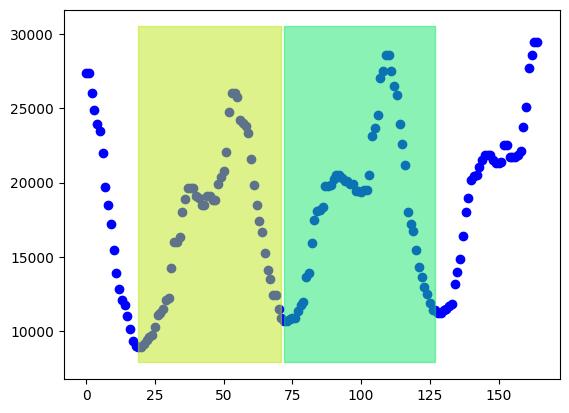

0.6417063011146675
==========       289 / 1276  -  22.648902821316614  % complete      ==========
         Current MAE =  0.09646384679433136
         Current DSC =  0.8856791874529168


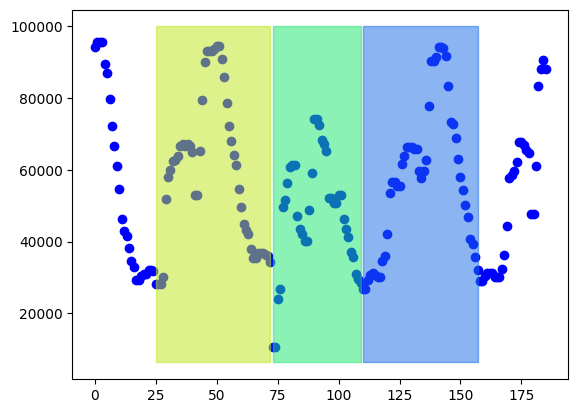

0.7590166095832677
==========       290 / 1276  -  22.727272727272727  % complete      ==========
         Current MAE =  0.09678073602983286
         Current DSC =  0.885900230859888


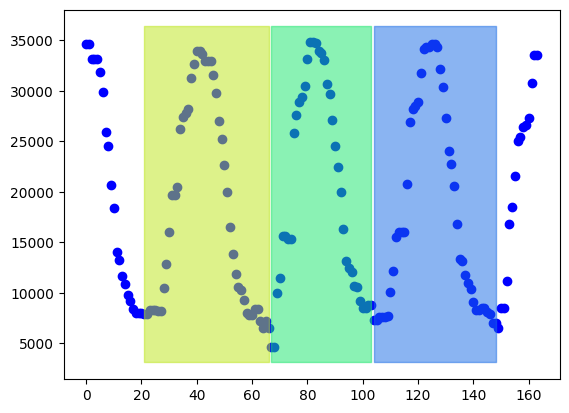

0.8241398072125059
==========       291 / 1276  -  22.80564263322884  % complete      ==========
         Current MAE =  0.09687447635234214
         Current DSC =  0.8860585331097501


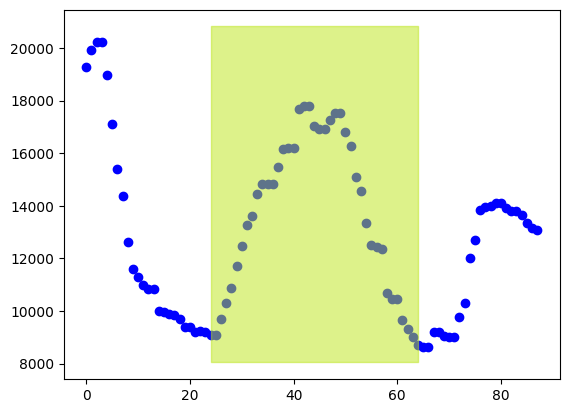

0.49385984288271234
==========       292 / 1276  -  22.884012539184955  % complete      ==========
         Current MAE =  0.09657251834876066
         Current DSC =  0.8861219442054017


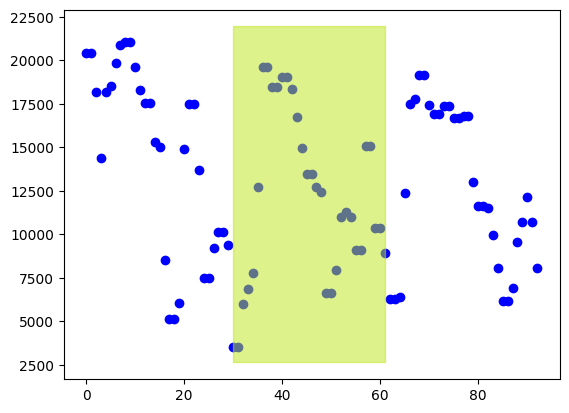

0.8207967332793491
==========       293 / 1276  -  22.962382445141067  % complete      ==========
         Current MAE =  0.09828848347714197
         Current DSC =  0.8853710796239026


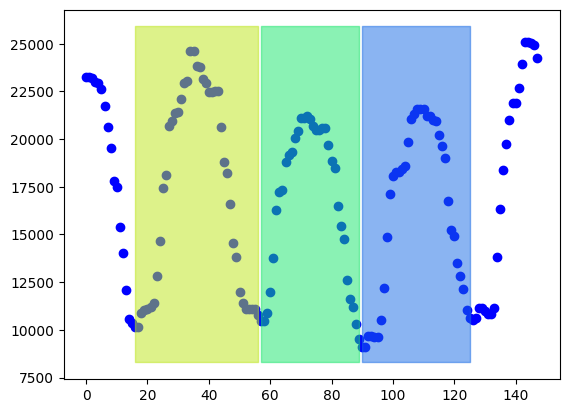

0.5601512067778448
==========       294 / 1276  -  23.04075235109718  % complete      ==========
         Current MAE =  0.09811217837867124
         Current DSC =  0.8855476951112553


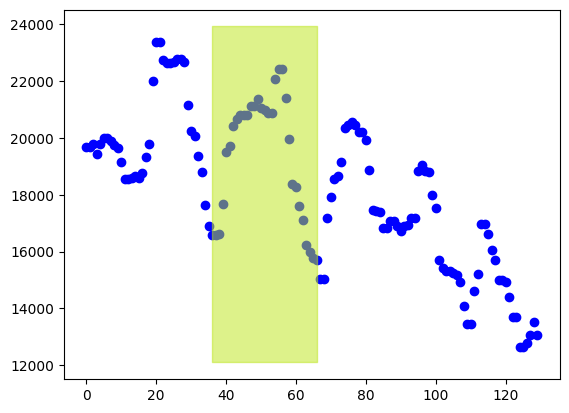

0.29702358279205604
==========       295 / 1276  -  23.11912225705329  % complete      ==========
         Current MAE =  0.09786476896501843
         Current DSC =  0.8856918076337394


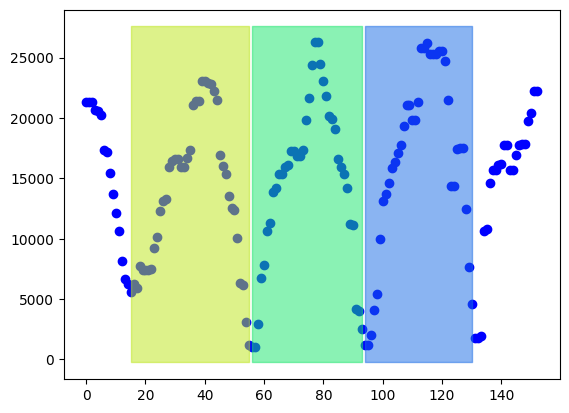

0.9270870589396573
==========       296 / 1276  -  23.197492163009404  % complete      ==========
         Current MAE =  0.09855234691373735
         Current DSC =  0.8846945512939144


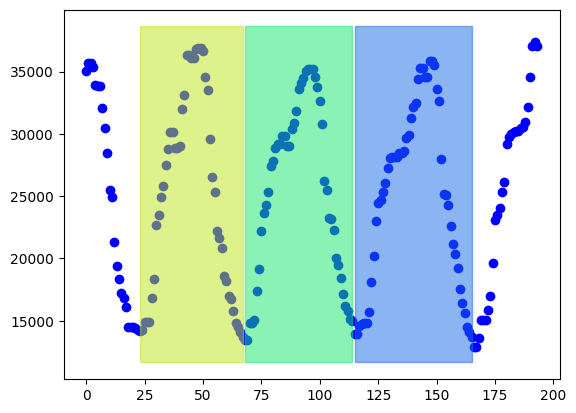

0.6152581440025605
==========       297 / 1276  -  23.275862068965516  % complete      ==========
         Current MAE =  0.09865652516676054
         Current DSC =  0.8848225867708123


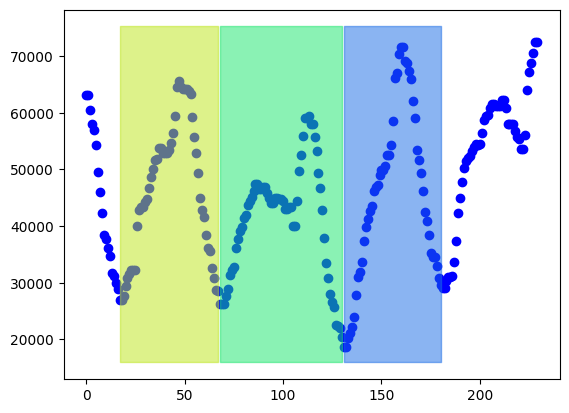

0.6527803534338023
==========       298 / 1276  -  23.354231974921632  % complete      ==========
         Current MAE =  0.09848094524969966
         Current DSC =  0.8848901685052271


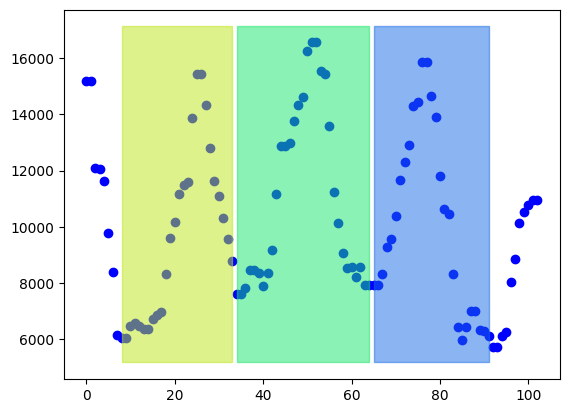

0.5913229290711975
==========       299 / 1276  -  23.432601880877744  % complete      ==========
         Current MAE =  0.09865206961685882
         Current DSC =  0.8844803426178004


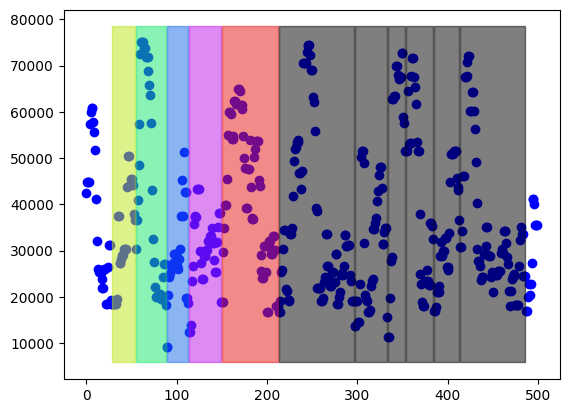

0.7429661082850405
==========       300 / 1276  -  23.510971786833856  % complete      ==========
         Current MAE =  0.10004109077129712
         Current DSC =  0.8842876929044724


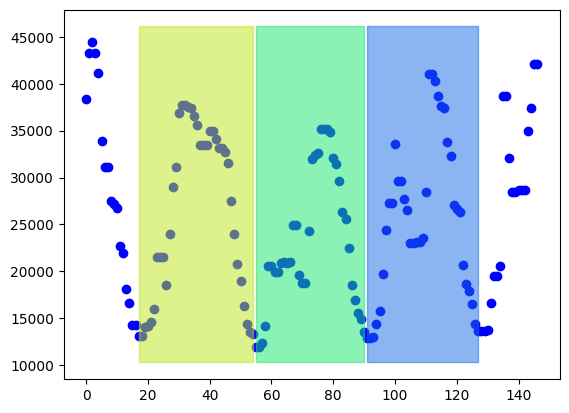

0.6680052760281271
==========       301 / 1276  -  23.58934169278997  % complete      ==========
         Current MAE =  0.09993919607954153
         Current DSC =  0.8843431613373994


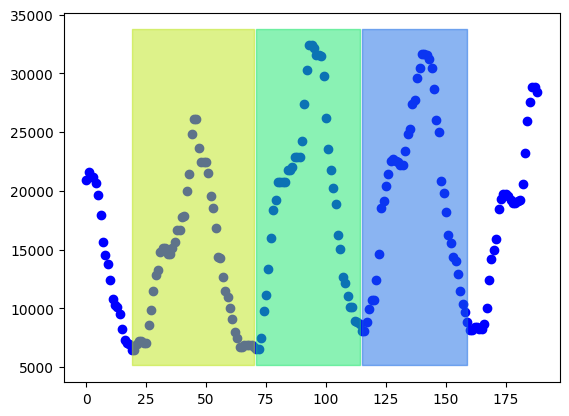

0.765625286462102
==========       302 / 1276  -  23.66771159874608  % complete      ==========
         Current MAE =  0.09994414867446648
         Current DSC =  0.8844329152280921


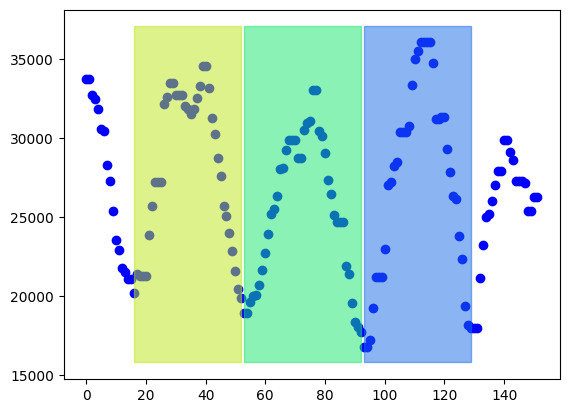

0.4686484685420645
==========       303 / 1276  -  23.746081504702193  % complete      ==========
         Current MAE =  0.09984357615902516
         Current DSC =  0.8846052768993693


In [ ]:
import os
def dice_coef(y_true, y_pred, smooth=0.00001):
    #y_pred = tf.keras.layers.ThresholdedReLU(0.5)(y_pred)
    # y_pred = tf.cast(y_pred, tf.float32)
    # y_true = tf.cast(y_true, tf.float32)
    intersection = keras.backend.sum(y_true * y_pred, axis=[1,2,3])
    union = keras.backend.sum(y_true, axis=[1,2,3]) +keras.backend.sum(y_pred, axis=[1,2,3])
    dice = keras.backend.mean((2. * intersection + smooth)/(union + smooth), axis=0)
    return dice


# echo_train = EchoSet(split = 'train' , pad=8, batch_size = 1)
# echo_valid = EchoSet(split ='val', pad = 8, batch_size = 1)
echo_test = EchoSet(split ='test', pad = 8, batch_size = 1, center = False)

model = RMUNet()
model.load_weights("/content/drive/MyDrive/Echocardiography/saved-models/RMU10")
model.compile(optimizer=tf.keras.optimizers.Adam())

save_item = True

# # Per frame U-Net
# model = RMUNet()
# model.load_weights("RMU_3channel")

MAE = []
DSC = []
ef_array = []
nans = []
for item_idx in range(0, echo_test.__len__()):
#for item_idx in range(0, 50):

    per_complete = item_idx * 100 / echo_test.__len__()
   #os.system('clear')
    print( "==========      " , item_idx, "/",echo_test.__len__(), " - ",per_complete, " % complete      ==========")
    print("         Current MAE = ", np.mean(MAE))
    print("         Current DSC = ", np.mean(DSC))
        
    #save_item = True

    X, y = echo_test.__getitem__(item_idx)

    #For per-frame u-net
    outs = np.zeros([1, np.shape(X)[1], 128, 128, 1])
    for m in range(0, np.shape(X)[1] -1):
        out = model.call(X[:, m, :, :, :])
        outs[0][m] = out

    seg_pred = tf.boolean_mask(outs[0], y.ed_es_frames)
    seg_ground_truth =  tf.boolean_mask(y.video_masks, y.ed_es_frames)
    seg_pred = tf.experimental.numpy.where(seg_pred > 0.45, 1.0, 0.0)
    dice = dice_coef(tf.cast(seg_ground_truth, tf.float32), tf.cast(seg_pred, tf.float32))
    DSC = np.append(DSC,dice)
    

    # Calculate the area of each mask in pixels
    seg_pred_avg = np.where(outs > 0.45, 1, 0)
    areas = tf.math.reduce_sum(outs, axis =(2, 3))
    seg_pred_avg = np.squeeze(seg_pred_avg, 0)
    areas = areas[0].numpy()

    #Ensure that frames with no masks are not used for calculation (use arbitrary value of area > 100)
    seg_pred_avg = seg_pred_avg[(areas >100)[:, 0]]
    X = X[:,(areas > 100)[:,0]]
    areas = areas[areas > 100]

    i = 0
    gif_names = []
    vols = np.zeros(np.shape(areas)[0])
    #Skip frames that are zero 
    
    for frame in seg_pred_avg:
        
        frame = frame.astype(np.uint8)
        # Get the contour of the LV
        contours, _ = cv2.findContours(frame, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

        #Find the largest contour
        if contours:

            cnt = contours[0]
            for c in contours:
                area = cv2.contourArea(c)
                if area > cv2.contourArea(cnt):
                    cnt = c
            
            im3 = X[0][i].copy() * 255
            #V, im = modified_simpsons(cnt, frame, draw=True, im=im3)
            V, im = simpsons_biplane(cnt, frame, areas[i],draw=True, im=im3)
            vols[i] = V


            if save_item:
                im3 = im
                filename = 'gif_images/f' + str(i) + '.png'
                gif_names.append(filename)
                cv2.imwrite(filename, im)

        i = i + 1

    if np.any(vols):
        # Reject outliers
        filtered = sig.medfilt(vols)

        # Detect peaks
        trim_min = sorted(filtered)[round(len(filtered) ** 0.05)]
        trim_max = sorted(filtered)[round(len(filtered) ** 0.95)]

        trim_range = trim_max - trim_min
        
        # Distance = minimum required distance between frames, 32 is heuristic
        troughs = sig.find_peaks(-filtered,  distance=20,  prominence=(0.50 * trim_range))

        trough_frames = troughs[0]
        troughs_vols = filtered[trough_frames]
        
        # Uncomment to produce beat level figures 
        fig, ax = plt.subplots()
        ax.scatter(range(0, np.shape(filtered)[0]), filtered, color='blue')
        ylim = ax.get_ylim()

        color = [0.2, 0.9, 0.9]

        beats = []

        for index in range(0, len(trough_frames) -1):
            color_rgb = clr.hsv_to_rgb(color)
            curr_trough = trough_frames[index]
            next_trough = trough_frames[index + 1]

            beat_start = int(curr_trough)
            beat_end = int(next_trough -1)

            ax.fill_betweenx(ylim, beat_start, beat_end, color= color_rgb, alpha=0.5)

            color[0] = color[0] + 0.2
            beats = np.append(beats, [beat_start, beat_end])
            beats = beats.reshape((-1, 2))


        plt.show()
        EF_per_beat = []
        for beat in beats:
            curr_beat_vols = filtered[int(beat[0]):int(beat[1])]
            max_frame = np.argmax(curr_beat_vols)
            min_frame = np.argmin(curr_beat_vols)

            EF = (curr_beat_vols[max_frame] - curr_beat_vols[min_frame]) / curr_beat_vols[max_frame]

            #print("Ejection fraction of beat ", b_no, " = ", EF)
            EF_per_beat = np.append(EF_per_beat, EF)

        EF = np.mean(EF_per_beat)
        abs_error = abs(EF -  float(y.ef))
        ef_array = np.append(ef_array, EF)
        MAE = np.append(MAE, abs_error)
        print(EF)
        if np.isnan(MAE).any():
            nans = np.append(nans, item_idx)

    if save_item:
        #with imageio.get_writer('gifs/' +str(item_idx) +'.gif', mode='I') as writer:
        with imageio.get_writer('gif_images/' +str(item_idx) +'.gif', mode='I') as writer:
            for filename in gif_names:
                image = imageio.imread(filename)
                writer.append_data(image)

    for filename in set(gif_names):
        os.remove(filename)

    save_item = True
    MAE = MAE[~np.isnan(MAE)]



print("MAE: ", MAE / echo_test.__len__())
